# Setup and Imports

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install openpyxl

In [3]:
!pip install xlsxwriter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.1 MB/s eta 0:00:00


In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import pandas as pd
import tensorflow as tf
import cv2
import xlsxwriter

from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import GRU
from keras.layers import Flatten
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
from keras import backend as K
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Define functions

In [5]:
# rmspe metric
def rmspe(y_true, y_pred):
    return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))

In [6]:
# smape metric
def smape(y_true, y_pred):
    return 100 * K.mean(K.abs((y_pred - y_true)) / (K.abs(y_true) + K.abs(y_pred)))

In [7]:
# create model
def create_model(model_type, n_steps, n_features):
  model = Sequential()
  if(model_type == 0):
    model.add(Conv1D(filters=64, kernel_size=3, activation="relu", input_shape=(n_steps, n_features)))
    model.add(Conv1D(filters=128, kernel_size=1, activation="relu", input_shape=(n_steps, n_features)))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
  if(model_type == 1):
    model.add(Conv1D(filters=64, kernel_size=1, activation="relu", input_shape=(n_steps, n_features)))
    model.add(GRU(128, input_shape=(3, n_features)))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
  model.compile(optimizer='adam', loss='mse', metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(name='rmse'), rmspe, 'mape', smape])
  return model

In [8]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

In [9]:
# predict all
def predict_all(model, X_test):
  preds = list()
  for x in X_test:
    x = x.reshape((1, n_steps, n_features))
    preds.extend(model.predict(x, verbose=0)[0])
  return preds

In [10]:
# evaluate model
def get_metrics(truth, preds):
  mse_score = tf.keras.metrics.mean_squared_error(truth, preds)
  mae_score = tf.keras.metrics.mean_absolute_error(truth, preds)
  rmse_score = tf.keras.metrics.RootMeanSquaredError()
  rmse_score.update_state(truth, preds)
  rmspe_score = rmspe(truth, preds)
  mape_score = tf.keras.metrics.mean_absolute_percentage_error(truth, preds)
  smape_score = smape(truth, preds)
  return [mse_score.numpy(), mae_score.numpy(), rmse_score.result().numpy(), rmspe_score.numpy(), mape_score.numpy(), smape_score.numpy()]

In [11]:
def plot_train_results(history):
  plt.title('MSE')
  plt.plot(history.history['mse'])
  plt.plot(history.history['val_mse'])
  plt.legend(['MSE', 'Validation MSE'])
  plt.xlabel('Epoch')
  plt.ylabel('LC units (normalized)')
  plt.show()

  plt.title('MAE')
  plt.plot(history.history['mae'])
  plt.plot(history.history['val_mae'])
  plt.legend(['MAE', 'Validation MAE'])
  plt.xlabel('Epoch')
  plt.ylabel('LC units (normalized)')
  plt.show()

  plt.title('RMSE')
  plt.plot(history.history['rmse'])
  plt.plot(history.history['val_rmse'])
  plt.legend(['RMSE', 'Validation RMSE'])
  plt.xlabel('Epoch')
  plt.ylabel('LC units (normalized)')
  plt.show()

  plt.title('RMSPE')
  plt.plot(history.history['rmspe'])
  plt.plot(history.history['val_rmspe'])
  plt.legend(['RMSPE', 'Validation RMSPE'])
  plt.xlabel('Epoch')
  plt.ylabel('Percent (%)')
  plt.show()

  plt.title('MAPE')
  plt.plot(history.history['mape'])
  plt.plot(history.history['val_mape'])
  plt.legend(['MAPE', 'Validation MAPE'])
  plt.xlabel('Epoch')
  plt.ylabel('Percent (%)')
  plt.show()

# Set parameters

In [12]:
#Select model
#0 = CNN; 1 = CNN/GRU
model_type = 0

In [13]:
# choose a number of time steps
n_steps = 3

In [14]:
# create scaler
scaler = MinMaxScaler()

In [15]:
result_list = []

# ***DB0***

## Data

### Get data

In [16]:
book = pd.ExcelFile('Data for ML TT-DB0.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
nf = pd.Series(sheet.loc[:,"Nf"]).array
lc = pd.Series(sheet.loc[:,"LC"]).array


print(temp)
print(nf)
print(lc)

<PandasArray>
["TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'", "TT 59'",
 "TT 62'", "TT 65'", "TT 68'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 485, dtype: object
<PandasArray>
[41090.5061075265, 39607.9167484446, 39237.7021284893, 38280.1016563549,
 49376.1002417963, 36766.2488161939,  35987.539636953,   37974.03129662,
 34512.2493018107, 48315.0959072694,
 ...
 53365.4528603779, 37203.2022351574, 50240.0562554178, 40441.3650671086,
 41569.4387577175, 53495.5587959451, 46559.4539687279, 45999.9230542643,
 35568.2691226242, 35616.6976337195]
Length: 485, dtype: float64
<PandasArray>
[3.65047827854631e-05, 3.78712167450439e-05, 3.82285383350952e-05,
 3.91848489187851e-05, 9.11372096614223e-05, 4.07982877855985e-05,
 4.16810933765463e-05, 6.58344640965869e-05, 4.34628292952584e-05,
  0.00013453352162387,
 ...
   0.0001218016460388, 4.03191099120625e-05, 9.95221815552966e-06,
 1.23635787063641e-05, 6.01

In [17]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [18]:
temp_new = np.array(temp_new)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [19]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [20]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(483, 3, 2) (483,)
[[0.06666667 0.0883952 ]
 [0.1        0.08010384]
 [0.13333333 0.07803342]] 0.12206416188823929
[[0.1        0.08010384]
 [0.13333333 0.07803342]
 [0.16666667 0.07267805]] 0.12535186403354687
[[0.13333333 0.07803342]
 [0.16666667 0.07267805]
 [0.2        0.13473226]] 0.3039589931194969
[[0.16666667 0.07267805]
 [0.2        0.13473226]
 [0.23333333 0.06421185]] 0.13089870887058483
[[0.2        0.13473226]
 [0.23333333 0.06421185]
 [0.26666667 0.05985693]] 0.13393370804841445
[[0.23333333 0.06421185]
 [0.26666667 0.05985693]
 [0.3        0.07096636]] 0.2169706314988369
[[0.26666667 0.05985693]
 [0.3        0.07096636]
 [0.33333333 0.05160639]] 0.14005914167032327
[[0.3        0.07096636]
 [0.33333333 0.05160639]
 [0.36666667 0.12879861]] 0.45315126430285263
[[0.33333333 0.05160639]
 [0.36666667 0.12879861]
 [0.4        0.10462788]] 0.4204434040032089
[[0.36666667 0.12879861]
 [0.4        0.10462788]
 [0.43333333 0.11738566]] 0.47354876014706165
[[0.4        0.10462788]

In [21]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [22]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [23]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

347
347
39
39
97
97


In [24]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [25]:
#number of features
n_features = X.shape[2]

In [30]:
model = create_model(model_type, n_steps, n_features)

In [31]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [32]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
11/11 - 2s - loss: 0.0505 - mse: 0.0505 - mae: 0.1871 - rmse: 0.2247 - rmspe: inf - mape: 1433566.2500 - smape: 22.8949 - val_loss: 0.0324 - val_mse: 0.0324 - val_mae: 0.1618 - val_rmse: 0.1799 - val_rmspe: 46.3830 - val_mape: 31.3591 - val_smape: 14.4891 - 2s/epoch - 150ms/step
Epoch 2/2000
11/11 - 0s - loss: 0.0440 - mse: 0.0440 - mae: 0.1736 - rmse: 0.2098 - rmspe: inf - mape: 1431063.1250 - smape: 21.8943 - val_loss: 0.0233 - val_mse: 0.0233 - val_mae: 0.1388 - val_rmse: 0.1527 - val_rmspe: 38.7097 - val_mape: 27.0742 - val_smape: 11.5530 - 92ms/epoch - 8ms/step
Epoch 3/2000
11/11 - 0s - loss: 0.0329 - mse: 0.0329 - mae: 0.1471 - rmse: 0.1813 - rmspe: inf - mape: 1424787.8750 - smape: 19.5006 - val_loss: 0.0065 - val_mse: 0.0065 - val_mae: 0.0657 - val_rmse: 0.0808 - val_rmspe: 23.5866 - val_mape: 15.2173 - val_smape: 4.4739 - 87ms/epoch - 8ms/step
Epoch 4/2000
11/11 - 0s - loss: 0.0208 - mse: 0.0208 - mae: 0.1089 - rmse: 0.1442 - rmspe: inf - mape: 1642264.0000 - smap

### Plot training results

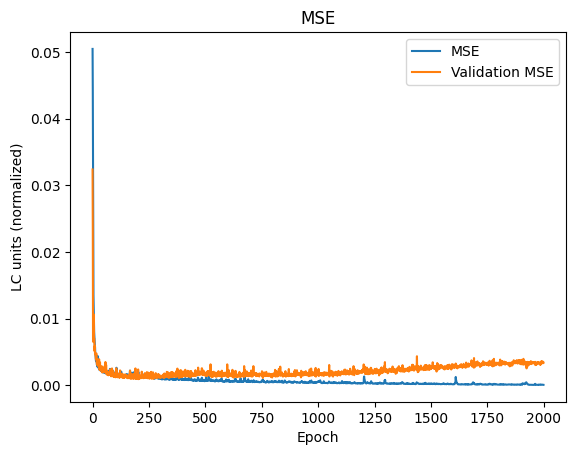

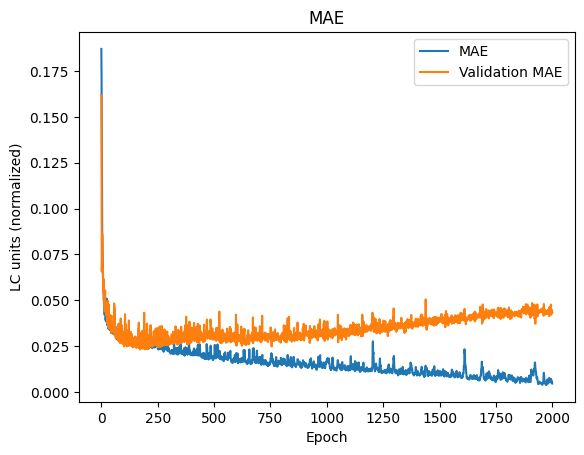

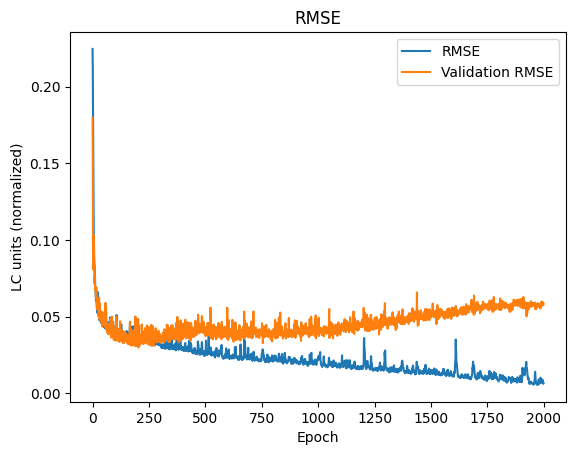

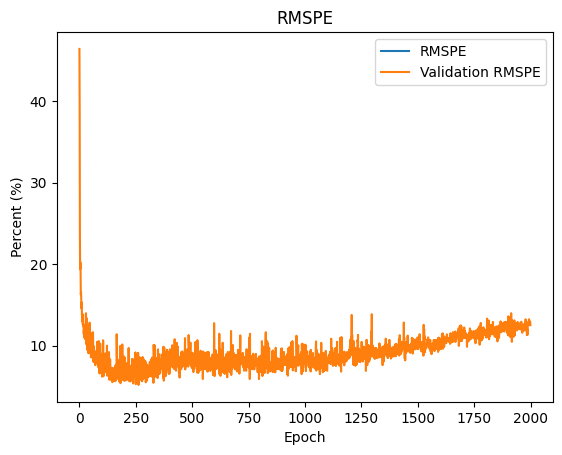

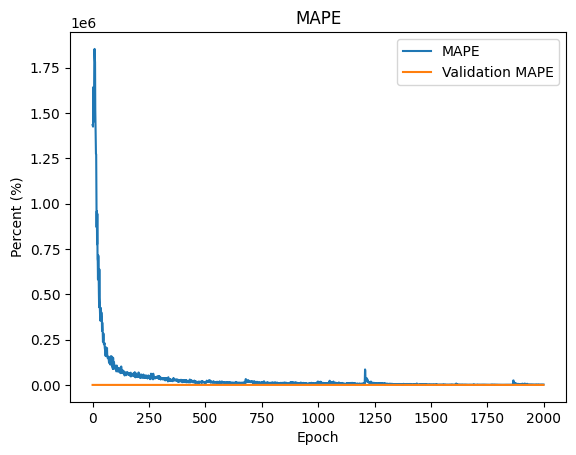

In [33]:
plot_train_results(history)

## Testing

### Predict

In [34]:
preds = predict_all(model, X_test)
print(preds)

[0.9092412, 0.93371284, 0.9192424, 0.9212756, 0.8977146, 0.8993658, 0.9523779, 0.93895763, 0.92303944, 0.9288321, 0.9123794, 0.91427743, 0.74283046, 0.94337386, 0.9266251, 0.85967267, 0.85523045, 0.80872196, 0.6348715, 0.3800965, 0.21555409, 0.47554767, 0.60311776, 0.55424786, 0.60708475, 0.66616195, 0.6384516, 0.7512565, 0.59973115, 0.45533904, 0.3046456, 0.06054785, 0.35318458, 0.5230764, 0.50530076, 0.59559286, 0.5830651, 0.62689185, 0.6450857, 0.66684735, 0.7155183, 0.722549, 0.74777544, 0.5823312, 0.60596764, 0.38433665, 0.21800886, 0.5398633, 0.64426774, 0.6027725, 0.80861133, 0.7129767, 0.86252177, 0.8346818, 0.82990813, 0.8467371, 0.8644547, 0.8670682, 0.8413804, 0.8659556, 0.7211208, 0.42597497, 0.37738818, 0.3843072, 0.5860058, 0.548421, 0.63190293, 0.61200917, 0.6713059, 0.6677131, 0.71596026, 0.7278878, 0.78031594, 0.8056204, 0.81978005, 0.8304801, 0.78932106, 0.80565685, 0.82466656, 0.8147702, 0.8269081, 0.7048168, 0.5116531, 0.52643687, 0.12746035, 0.18452738, 0.2186035, 

### Inverse

In [35]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [36]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [37]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [38]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

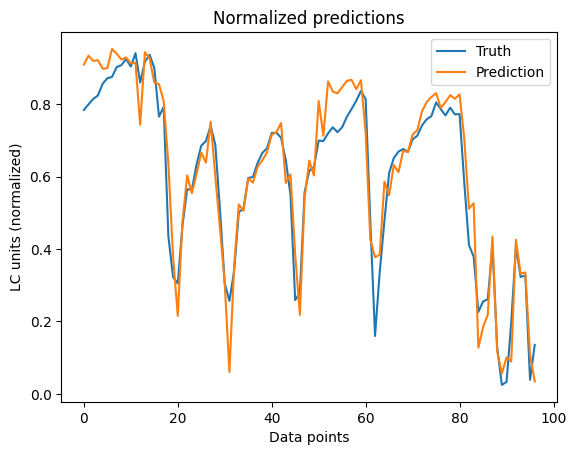

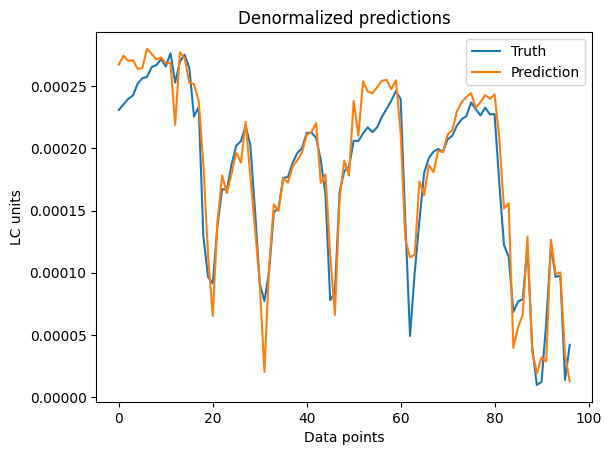

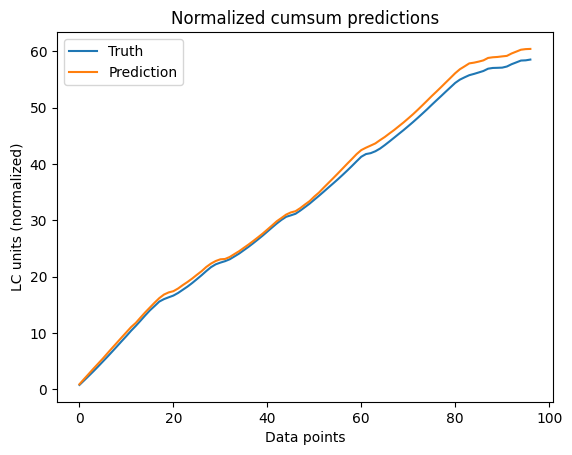

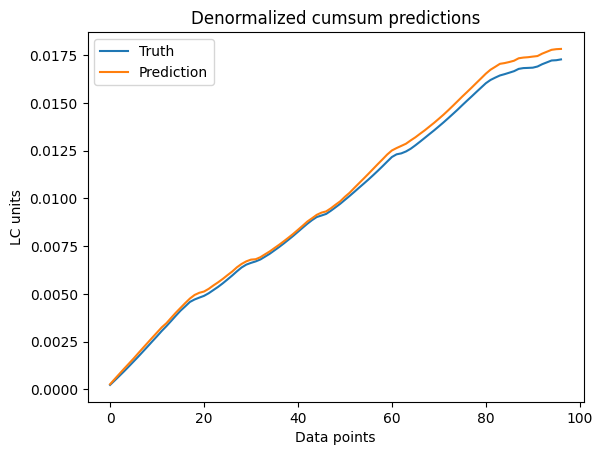

In [39]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [40]:
#Normalized score
get_metrics(y_test, preds)

[0.005184303, 0.054194067, 0.072002105, 37.779984, 17.284128, 7.6371355]

In [41]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[4.386352e-10, 1.5763706e-05, 2.094362e-05, 32.020424, 15.751908, 7.2192373]

In [42]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.3390315, 1.0081365, 1.1571653, 5.0525956, 3.9655833, 1.9219713]

In [43]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.1329487e-07, 0.00029324362, 0.00033659302, 4.992205, 3.915713, 1.8984511]

In [44]:
result_list.append(['db0', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [45]:
model.save('model')

In [46]:
!zip -r "/content/db0_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 14%)
  adding: content/model/variables/variables.index (deflated 67%)
  adding: content/model/assets/ (stored 0%)


In [47]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [48]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 0.0052 - mse: 0.0052 - mae: 0.0542 - rmse: 0.0720 - rmspe: 43.8341 - mape: 17.2841 - smape: 20.0941


[0.0051843030378222466,
 0.0051843030378222466,
 0.05419406667351723,
 0.0720021054148674,
 43.834068298339844,
 17.28412628173828,
 20.09405517578125]

In [49]:
!cp "/content/db0_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB1***

## Data

### Get data

In [50]:
book = pd.ExcelFile('Data for ML TT-DB1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
nf = pd.Series(sheet.loc[:,"Nf"]).array
lc = pd.Series(sheet.loc[:,"LC"]).array


print(temp)
print(nf)
print(lc)

<PandasArray>
[38, 41, 44, 47, 50, 53, 56, 59, 62, 65,
 ...
 47, 50, 38, 40, 43, 46, 49, 52, 54, 57]
Length: 496, dtype: int64
<PandasArray>
[64122.1205326926,  45405.534205958, 40242.2001229581, 56696.4383369348,
 51580.0130808749, 79424.5393719238,  58679.525782504, 53399.3097453367,
 58091.7058622165, 49809.7792307447,
 ...
 95878.2837855266, 43108.4340095735,      73450.45307,      181239.2144,
      129105.2526,      140228.3196,      155480.7897,      76477.72731,
      41743.17516,      47234.45108]
Length: 496, dtype: float64
<PandasArray>
[0.000124761937589403, 6.60712411485371e-05, 4.96990719664704e-05,
 0.000123464545663354, 0.000116324127149644, 0.000163677373552329,
 0.000136333753439863, 0.000131087836778851, 0.000154927452489456,
 0.000140534652192943,
 ...
 0.000187738028772655, 9.27892671562061e-05,             8.17e-05,
          0.000193115,           0.00019364,          0.000199674,
          0.000205813,           0.00018306,             4.79e-05,
          0.0001

In [51]:
temp_new = temp

In [52]:
temp_new = np.array(temp_new)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [53]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [54]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(494, 3, 2) (494,)
[[0.03333333 0.11122741]
 [0.06666667 0.05769071]
 [0.1        0.04292158]] 0.03825435028473853
[[0.06666667 0.05769071]
 [0.1        0.04292158]
 [0.13333333 0.08998708]] 0.31767114017285736
[[0.1        0.04292158]
 [0.13333333 0.08998708]
 [0.16666667 0.07535212]] 0.29062389544482914
[[0.13333333 0.08998708]
 [0.16666667 0.07535212]
 [0.2        0.15499826]] 0.4699936118922454
[[0.16666667 0.07535212]
 [0.2        0.15499826]
 [0.23333333 0.09565948]] 0.3664185086245464
[[0.2        0.15499826]
 [0.23333333 0.09565948]
 [0.26666667 0.08055601]] 0.34654746164308436
[[0.23333333 0.09565948]
 [0.26666667 0.08055601]
 [0.3        0.09397808]] 0.43684972041248804
[[0.26666667 0.08055601]
 [0.3        0.09397808]
 [0.33333333 0.07028856]] 0.38233112445148454
[[0.3        0.09397808]
 [0.33333333 0.07028856]
 [0.36666667 0.10572888]] 0.5198879897161115
[[0.33333333 0.07028856]
 [0.36666667 0.10572888]
 [0.4        0.1017809 ]] 0.5350902978823932
[[0.36666667 0.10572888]


In [55]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [56]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [57]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

355
355
40
40
99
99


In [58]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [59]:
#number of features
n_features = X.shape[2]

In [60]:
model = create_model(model_type, n_steps, n_features)

In [61]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [62]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
12/12 - 1s - loss: 0.0295 - mse: 0.0295 - mae: 0.1412 - rmse: 0.1717 - rmspe: inf - mape: 1493529.3750 - smape: 13.7072 - val_loss: 0.0163 - val_mse: 0.0163 - val_mae: 0.1146 - val_rmse: 0.1275 - val_rmspe: 20.4215 - val_mape: 19.2329 - val_smape: 9.2111 - 1s/epoch - 122ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0244 - mse: 0.0244 - mae: 0.1199 - rmse: 0.1563 - rmspe: inf - mape: 1709496.1250 - smape: 11.2085 - val_loss: 0.0099 - val_mse: 0.0099 - val_mae: 0.0730 - val_rmse: 0.0994 - val_rmspe: 16.0835 - val_mape: 13.5946 - val_smape: 5.0050 - 58ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0218 - mse: 0.0218 - mae: 0.1054 - rmse: 0.1478 - rmspe: inf - mape: 1762942.5000 - smape: 10.1444 - val_loss: 0.0084 - val_mse: 0.0084 - val_mae: 0.0637 - val_rmse: 0.0918 - val_rmspe: 14.4139 - val_mape: 12.2743 - val_smape: 4.1960 - 71ms/epoch - 6ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0191 - mse: 0.0191 - mae: 0.0976 - rmse: 0.1382 - rmspe: inf - mape: 1749298.2500 - smape:

### Plot training results

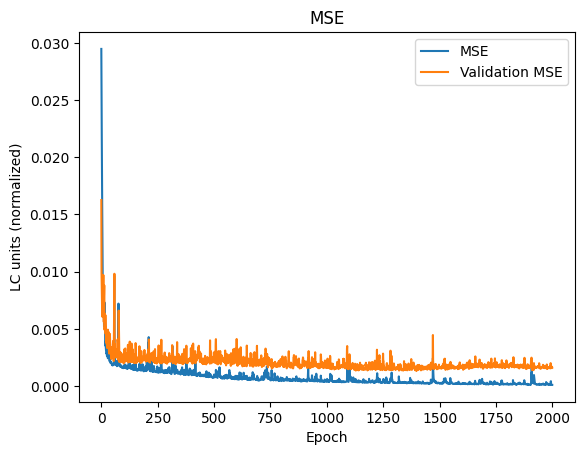

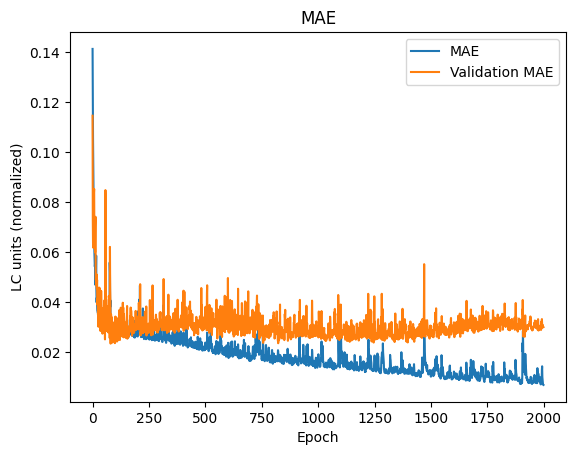

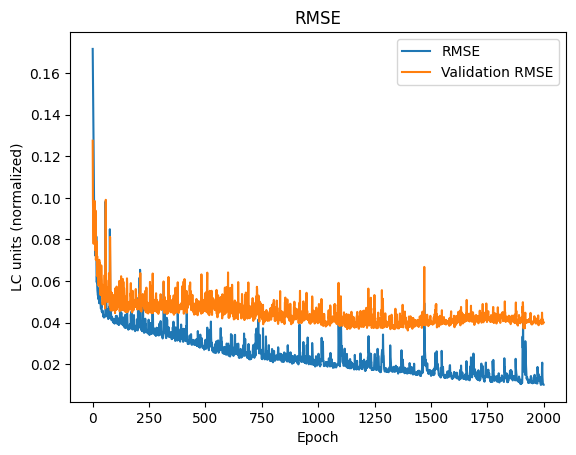

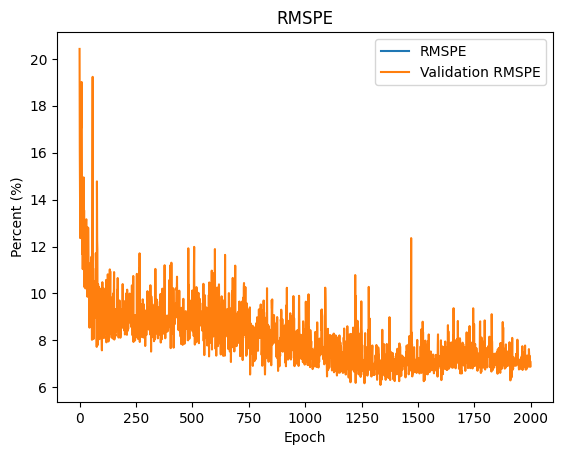

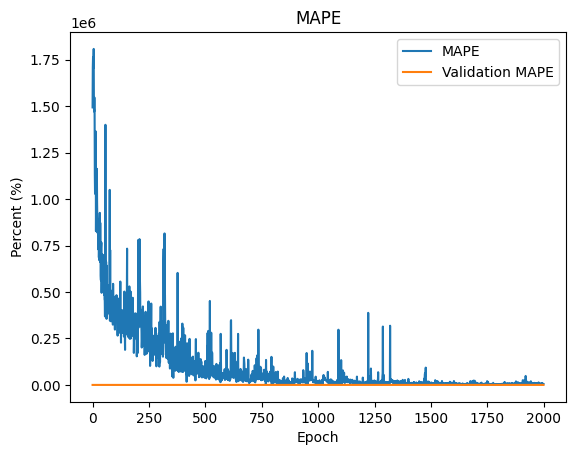

In [63]:
plot_train_results(history)

## Testing

### Predict

In [64]:
preds = predict_all(model, X_test)
print(preds)

[0.75369513, 0.81358135, 0.82079005, 0.83764994, 0.82619905, 0.82894075, 0.89887285, 0.86832315, 0.86097753, 0.8652579, 0.8603769, 0.8449728, 0.84234536, 0.8558172, 0.8699379, 0.896252, 0.8850899, 0.8374189, 0.5173204, 0.517652, 0.5541068, 0.69812745, 0.7661261, 0.5950373, 0.6125894, 0.616591, 0.6429979, 0.666314, 0.612424, 0.5470431, 0.3709675, 0.56426406, 0.6533515, 0.7991048, 0.70083785, 0.56182724, 0.61155444, 0.6409997, 0.6248984, 0.66346675, 0.77231777, 0.74616027, 0.7823877, 0.66871625, 0.6697154, 0.41370618, 0.44285822, 0.54477125, 0.6040825, 0.76220655, 0.61816144, 0.6261058, 0.61716634, 0.61430895, 0.704088, 0.73491585, 0.72980565, 0.810909, 0.8044766, 0.81000715, 0.84755516, 0.80266505, 0.46111095, 0.3778923, 0.38898033, 0.5101145, 0.564846, 0.6314382, 0.6338258, 0.6145908, 0.68223655, 0.6607719, 0.70697993, 0.75941896, 0.77401054, 0.8170454, 0.8090729, 0.82623684, 0.80155575, 0.7589389, 0.77949864, 0.7307901, 0.79219663, 0.6143036, 0.6861089, 0.4262025, 0.40234104, 0.466445

### Inverse

In [65]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [66]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [67]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [68]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

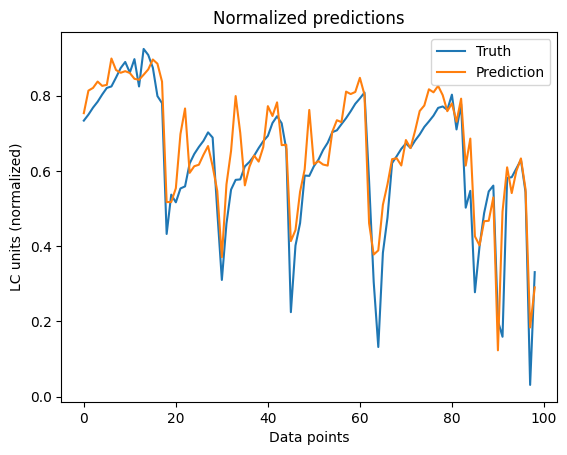

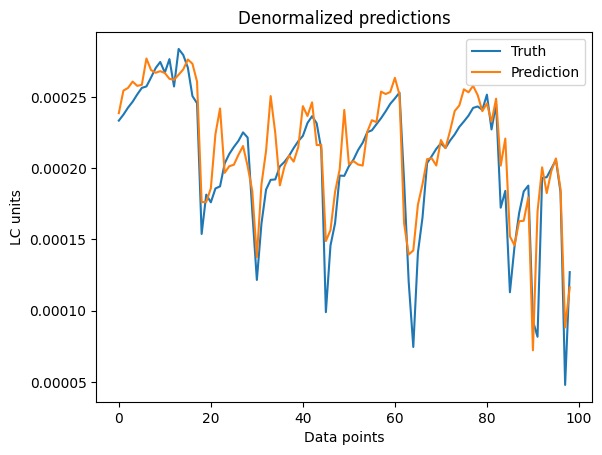

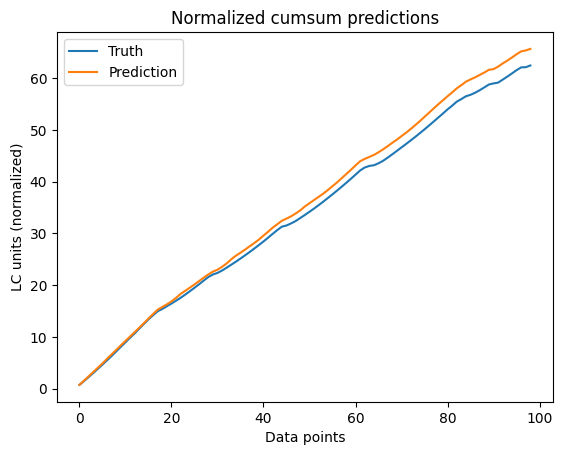

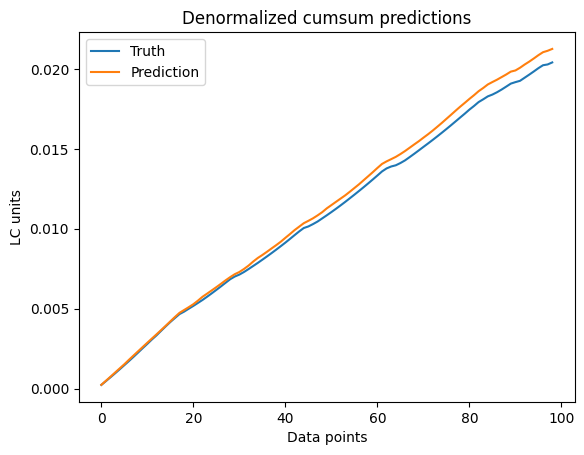

In [69]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [70]:
#Normalized score
get_metrics(y_test, preds)

[0.0067050965, 0.05737706, 0.08188465, 58.755768, 18.53414, 6.155657]

In [71]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[4.6731125e-10, 1.5147429e-05, 2.1617383e-05, 19.866705, 10.068151, 4.3789945]

In [72]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[3.2134109, 1.5026814, 1.792599, 4.2984905, 4.168483, 2.0390873]

In [73]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[2.2396073e-07, 0.0003967063, 0.0004732449, 3.5280156, 3.4252768, 1.6820967]

In [74]:
result_list.append(['db1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [75]:
model.save('model')

In [76]:
!zip -r "/content/db1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 17%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [77]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [78]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 0.0067 - mse: 0.0067 - mae: 0.0574 - rmse: 0.0819 - rmspe: 91.1378 - mape: 18.5341 - smape: 10.6584


[0.006705095525830984,
 0.006705095525830984,
 0.057377059012651443,
 0.08188464492559433,
 91.13783264160156,
 18.53413963317871,
 10.658366203308105]

In [79]:
!cp "/content/db1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB2-1***

## Data

### Get data

In [80]:
book = pd.ExcelFile('Data for ML TT-DB2-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Nf1"]).array
lc = pd.Series(sheet.loc[:,"LC1"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'", "TT 59'",
 "TT 62'", "TT 65'", "TT 68'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 485, dtype: object
<PandasArray>
[0.39210526315789473,  0.7242105263157894,  1.0563157894736843,
   1.388421052631579,  1.7205263157894737,  2.0526315789473686,
   2.384736842105263,   2.716842105263158,   3.048947368421053,
  3.3810526315789473,
 ...
  1.0050000000000001,                1.28,                0.42,
  0.6257142857142857,  0.8314285714285714,  1.0371428571428571,
  1.2428571428571429,  1.4485714285714286,  1.6542857142857144,
                1.86]
Length: 485, dtype: float64
<PandasArray>
[82629155.38, 12175012.53, 3903707.065, 1649331.863, 1293050.762, 477050.6499,
 293488.9822, 224573.3774, 130915.5197, 156000.6289,
 ...
 7245024.471, 1917585.214, 95679850.21, 19391478.89, 9006561.573, 6611693.205,
 3241121.595, 1996905.032, 825555.4903, 59278

In [81]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [82]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [83]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [84]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(483, 3, 3) (483,)
[[6.66666667e-02 4.58822766e-02 1.11406186e-04]
 [1.00000000e-01 8.68323707e-02 1.64091883e-05]
 [1.33333333e-01 1.27782465e-01 5.25655545e-06]] 0.00023423743315349692
[[1.00000000e-01 8.68323707e-02 1.64091883e-05]
 [1.33333333e-01 1.27782465e-01 5.25655545e-06]
 [1.66666667e-01 1.68732559e-01 2.21686371e-06]] 0.0005544845542795632
[[1.33333333e-01 1.27782465e-01 5.25655545e-06]
 [1.66666667e-01 1.68732559e-01 2.21686371e-06]
 [2.00000000e-01 2.09682653e-01 1.73647131e-06]] 0.002122780456022642
[[1.66666667e-01 1.68732559e-01 2.21686371e-06]
 [2.00000000e-01 2.09682653e-01 1.73647131e-06]
 [2.33333333e-01 2.50632747e-01 6.36215774e-07]] 0.0019153823204362372
[[2.00000000e-01 2.09682653e-01 1.73647131e-06]
 [2.33333333e-01 2.50632747e-01 6.36215774e-07]
 [2.66666667e-01 2.91582841e-01 3.88709998e-07]] 0.003117071517804524
[[2.33333333e-01 2.50632747e-01 6.36215774e-07]
 [2.66666667e-01 2.91582841e-01 3.88709998e-07]
 [3.00000000e-01 3.32532935e-01 2.95787491e-07]] 0.

In [85]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [86]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [87]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

347
347
39
39
97
97


In [88]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [89]:
#number of features
n_features = X.shape[2]

In [90]:
model = create_model(model_type, n_steps, n_features)

In [91]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [92]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
11/11 - 1s - loss: 0.1924 - mse: 0.1924 - mae: 0.4283 - rmse: 0.4386 - rmspe: inf - mape: 17985224.0000 - smape: 84.0654 - val_loss: 0.1686 - val_mse: 0.1686 - val_mae: 0.4044 - val_rmse: 0.4106 - val_rmspe: 4902735872.0000 - val_mape: 15853783.0000 - val_smape: 89.1691 - 1s/epoch - 136ms/step
Epoch 2/2000
11/11 - 0s - loss: 0.1373 - mse: 0.1373 - mae: 0.3538 - rmse: 0.3706 - rmspe: inf - mape: 14280402.0000 - smape: 81.3034 - val_loss: 0.0841 - val_mse: 0.0841 - val_mae: 0.2709 - val_rmse: 0.2899 - val_rmspe: 2947788032.0000 - val_mape: 9396034.0000 - val_smape: 84.4981 - 59ms/epoch - 5ms/step
Epoch 3/2000
11/11 - 0s - loss: 0.0591 - mse: 0.0591 - mae: 0.2117 - rmse: 0.2432 - rmspe: inf - mape: 6063470.5000 - smape: 76.9227 - val_loss: 0.0170 - val_mse: 0.0170 - val_mae: 0.1116 - val_rmse: 0.1305 - val_rmspe: 556086784.0000 - val_mape: 1716841.3750 - val_smape: 78.0162 - 56ms/epoch - 5ms/step
Epoch 4/2000
11/11 - 0s - loss: 0.0237 - mse: 0.0237 - mae: 0.1024 - rmse: 0.153

### Plot training results

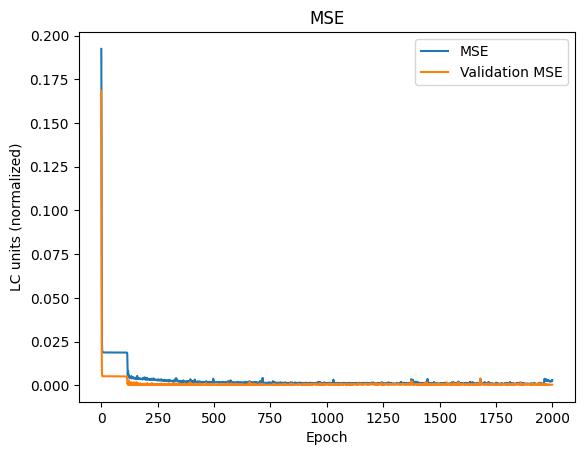

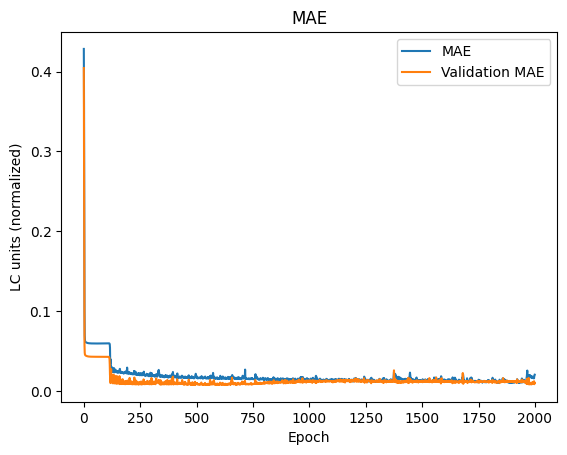

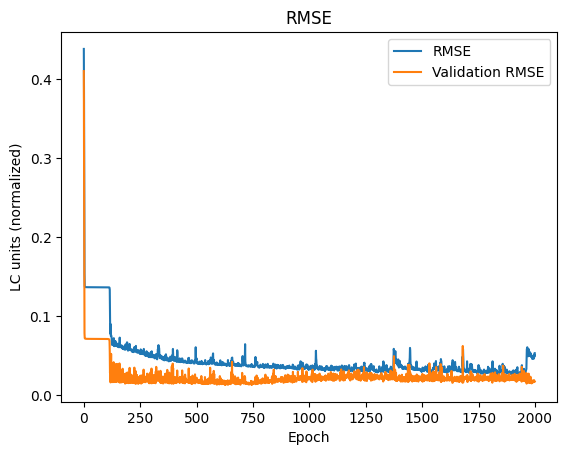

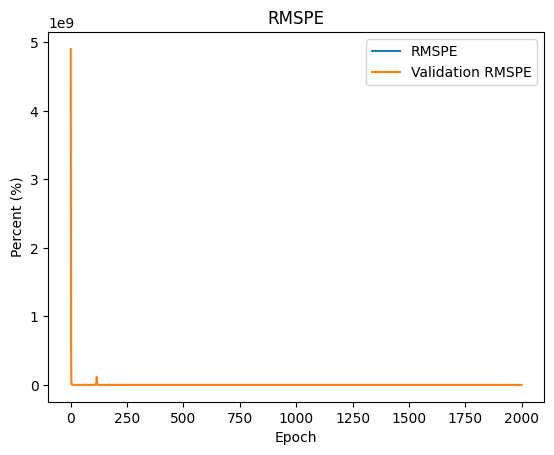

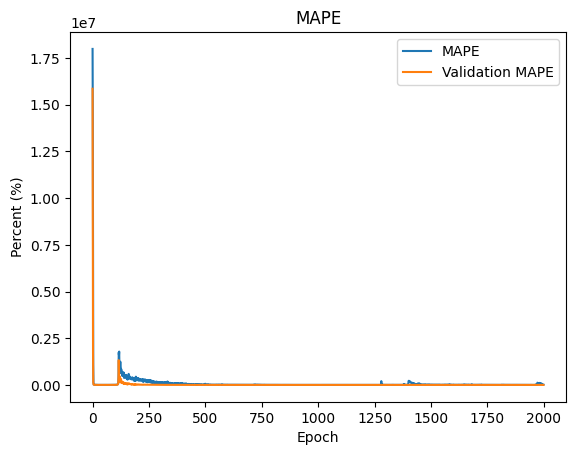

In [93]:
plot_train_results(history)

## Testing

### Predict

In [94]:
preds = predict_all(model, X_test)
print(preds)

[0.012238624, 0.015884537, 0.020970074, 0.029462634, 0.041061506, 0.057710357, 0.077110976, 0.10117369, 0.120943226, 0.13526838, 0.14965287, 0.1637658, 0.17563112, 0.18910569, 0.21651658, 0.256304, 0.29717606, 0.33932418, 0.37281254, 4.4338364e-07, 1.8437488e-08, 8.0974045e-05, 0.00021683269, 0.0004939298, 0.0010722852, 0.0022703067, 0.004834863, 0.0070781307, 0.010203457, 0.012800879, 0.015581527, 2.77004e-07, 3.888459e-08, 1.2664829e-06, 0.00023798128, 0.00058092194, 0.0012603435, 0.0024290183, 0.0042217635, 0.0066039744, 0.009216104, 0.012072049, 0.015657555, 0.020878732, 0.029351568, 0.040902365, 0.00014250494, 0.00010194189, 0.00017498444, 0.00039079736, 0.0008050554, 0.0017367624, 0.003848263, 0.007478616, 0.011556135, 0.017472075, 0.027923089, 0.043311156, 0.062772825, 0.067014165, 0.07135509, 0.08102621, 3.5254907e-05, 2.4127846e-06, 0.00015241593, 0.00031956864, 0.0006162966, 0.0011681191, 0.0023173585, 0.0037125277, 0.0049619908, 0.0062759547, 0.008019338, 0.009852182, 0.0120

### Inverse

In [95]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [96]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [97]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [98]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

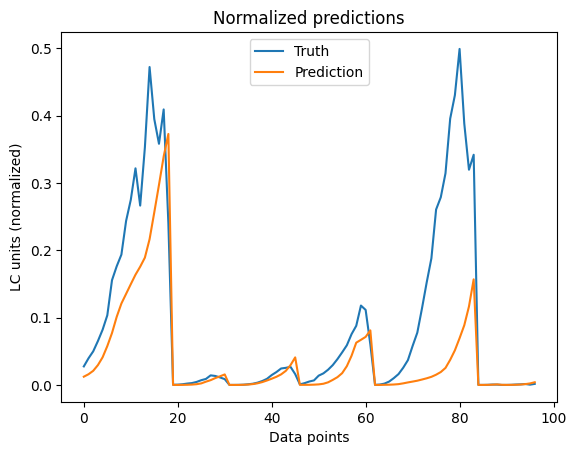

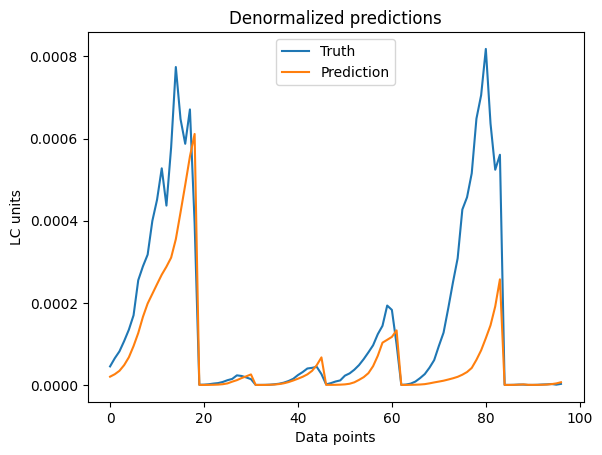

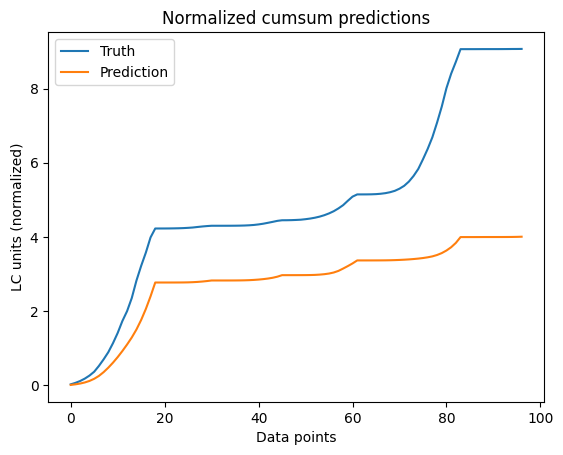

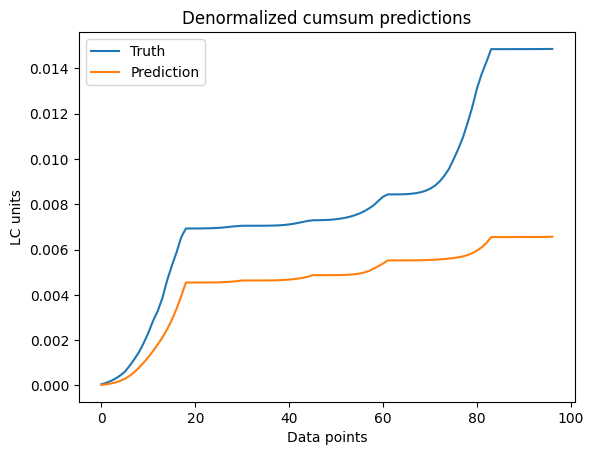

In [99]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [100]:
#Normalized score
get_metrics(y_test, preds)

[0.011739999, 0.056175172, 0.108351275, 411.82724, 113.1222, 50.066463]

In [101]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[3.1551224e-08, 9.209128e-05, 0.00017762664, 411.76834, 67.08433, 50.065243]

In [102]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[6.617445, 2.109906, 2.5724394, 42.802135, 41.828533, 26.879263]

In [103]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.7784365e-05, 0.0034588932, 0.004217151, 42.802135, 41.828533, 26.879263]

In [104]:
result_list.append(['db2-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [105]:
model.save('model')

In [106]:
!zip -r "/content/db2-1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 13%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [107]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [108]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 4ms/step - loss: 0.0117 - mse: 0.0117 - mae: 0.0562 - rmse: 0.1084 - rmspe: 249.8623 - mape: 113.1222 - smape: 48.6209


[0.011739999987185001,
 0.011739999987185001,
 0.056175172328948975,
 0.10835128277540207,
 249.86227416992188,
 113.12223052978516,
 48.620948791503906]

In [109]:
!cp "/content/db2-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB2-2***

## Data

### Get data

In [110]:
book = pd.ExcelFile('Data for ML TT-DB2-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Nf2"]).array
lc = pd.Series(sheet.loc[:,"LC2"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 38'", "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'",
 "TT 59'", "TT 62'", "TT 65'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 496, dtype: object
<PandasArray>
[               0.06, 0.39210526315789473,  0.7242105263157894,
  1.0563157894736843,   1.388421052631579,  1.7205263157894737,
  2.0526315789473686,   2.384736842105263,   2.716842105263158,
   3.048947368421053,
 ...
  1.0050000000000001,                1.28,                0.42,
  0.6257142857142857,  0.8314285714285714,  1.0371428571428571,
  1.2428571428571429,  1.4485714285714286,  1.6542857142857144,
                1.86]
Length: 496, dtype: float64
<PandasArray>
[42443295121.0,   100968359.3,   12662885.23,   6626646.766,   2613199.079,
   1901408.321,   883574.9506,   510185.7718,   364380.5944,   221990.4109,
 ...
   11232528.49,   2660266.689,   137735018.0,   68502660.13,   23988599.94,
   12549721.51,   7478096.00

In [111]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [112]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [113]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [114]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(494, 3, 3) (494,)
[[3.33333333e-02 6.15763547e-03 4.67976731e-03]
 [6.66666667e-02 4.70572984e-02 1.11321341e-05]
 [1.00000000e-01 8.79569614e-02 1.39563463e-06]] 9.112932828103524e-05
[[6.66666667e-02 4.70572984e-02 1.11321341e-05]
 [1.00000000e-01 8.79569614e-02 1.39563463e-06]
 [1.33333333e-01 1.28856624e-01 7.30083221e-07]] 0.0006113768787103596
[[1.00000000e-01 8.79569614e-02 1.39563463e-06]
 [1.33333333e-01 1.28856624e-01 7.30083221e-07]
 [1.66666667e-01 1.69756287e-01 2.87563301e-07]] 0.0013265730677706282
[[1.33333333e-01 1.28856624e-01 7.30083221e-07]
 [1.66666667e-01 1.69756287e-01 2.87563301e-07]
 [2.00000000e-01 2.10655950e-01 2.09081752e-07]] 0.003945113953523547
[[1.66666667e-01 1.69756287e-01 2.87563301e-07]
 [2.00000000e-01 2.10655950e-01 2.09081752e-07]
 [2.33333333e-01 2.51555613e-01 9.68561605e-08]] 0.005219778129187412
[[2.00000000e-01 2.10655950e-01 2.09081752e-07]
 [2.33333333e-01 2.51555613e-01 9.68561605e-08]
 [2.66666667e-01 2.92455276e-01 5.56865322e-08]] 0.0

In [115]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [116]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [117]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

355
355
40
40
99
99


In [118]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [119]:
#number of features
n_features = X.shape[2]

In [120]:
model = create_model(model_type, n_steps, n_features)

In [121]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [122]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
12/12 - 1s - loss: 0.1612 - mse: 0.1612 - mae: 0.3843 - rmse: 0.4016 - rmspe: inf - mape: 18459738.0000 - smape: 81.4721 - val_loss: 0.0950 - val_mse: 0.0950 - val_mae: 0.2879 - val_rmse: 0.3082 - val_rmspe: 879583808.0000 - val_mape: 9981619.0000 - val_smape: 84.3633 - 1s/epoch - 124ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0671 - mse: 0.0671 - mae: 0.2245 - rmse: 0.2590 - rmspe: inf - mape: 9522568.0000 - smape: 76.1815 - val_loss: 0.0174 - val_mse: 0.0174 - val_mae: 0.1094 - val_rmse: 0.1319 - val_rmspe: 190203488.0000 - val_mape: 1988948.0000 - val_smape: 76.8337 - 72ms/epoch - 6ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0286 - mse: 0.0286 - mae: 0.1108 - rmse: 0.1691 - rmspe: inf - mape: 964523.6875 - smape: 74.6283 - val_loss: 0.0064 - val_mse: 0.0064 - val_mae: 0.0591 - val_rmse: 0.0798 - val_rmspe: 20182216.0000 - val_mape: 203961.5469 - val_smape: 73.5023 - 72ms/epoch - 6ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0240 - mse: 0.0240 - mae: 0.0802 - rmse: 0.1548 - rms

### Plot training results

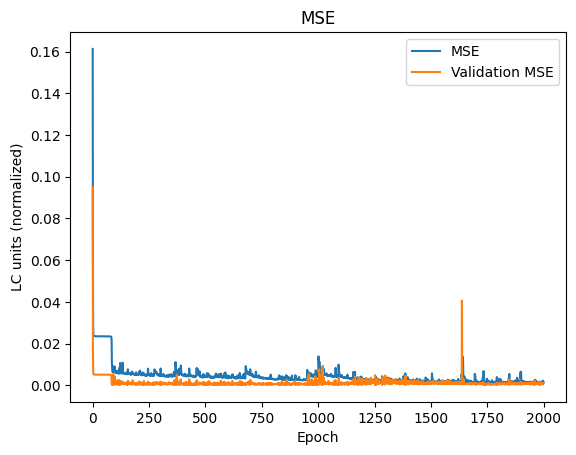

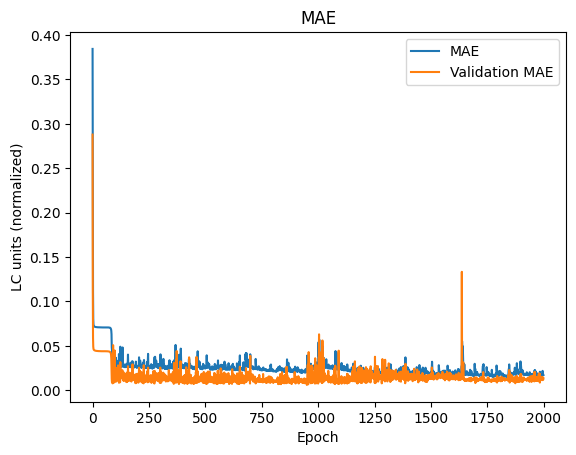

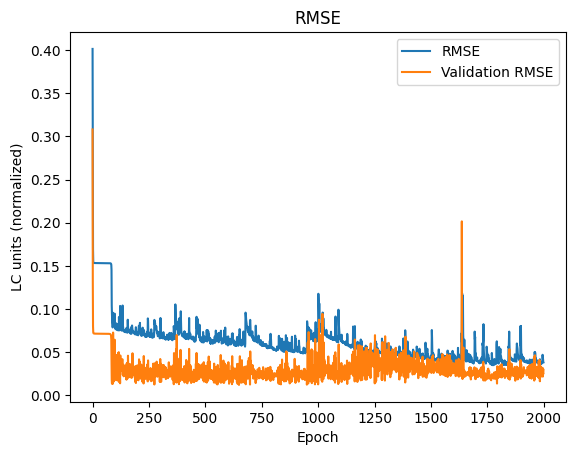

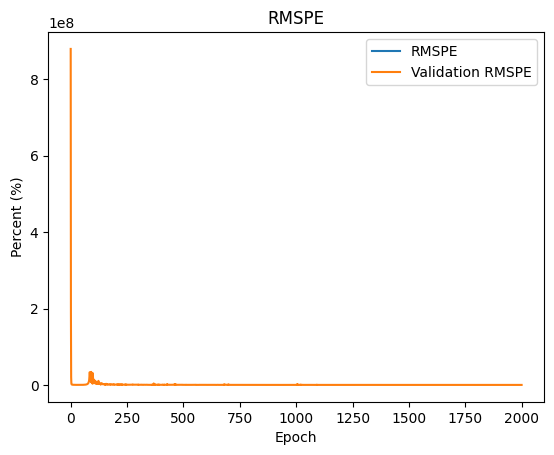

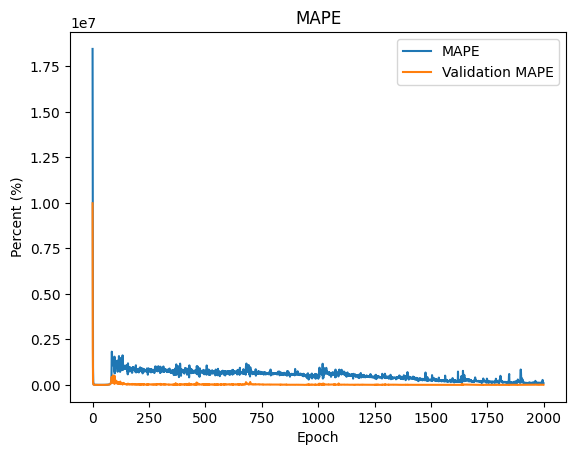

In [123]:
plot_train_results(history)

## Testing

### Predict

In [124]:
preds = predict_all(model, X_test)
print(preds)

[0.018114435, 0.023087699, 0.028454266, 0.033527363, 0.043319948, 0.06015971, 0.08305765, 0.11375099, 0.15326905, 0.16933548, 0.18465185, 0.19348377, 0.21253297, 0.23178309, 0.25115764, 0.2713867, 0.29209104, 0.30972213, 0.3253206, 0.005083877, 0.00020260236, 0.00031791255, 0.00048492372, 0.00079498265, 0.0013235115, 0.0029526763, 0.00738868, 0.019841673, 0.020808313, 0.022241132, 0.024075363, 0.00025020013, 0.00021581458, 0.00052757066, 0.0020095513, 0.003698278, 0.0046937764, 0.00590757, 0.0074774805, 0.009843933, 0.0131423, 0.017567901, 0.022429088, 0.02761384, 0.032443546, 0.04300126, 0.0007574179, 0.00048188164, 0.0006012878, 0.00096610334, 0.0015707144, 0.0024761904, 0.0038577507, 0.0059002857, 0.009749339, 0.015345335, 0.023660438, 0.033789326, 0.06252961, 0.12227169, 0.12519224, 0.11933565, 0.113062166, 0.00042141718, 0.00017910052, 0.0002217278, 0.00045226497, 0.00091236946, 0.0020082376, 0.0043301927, 0.008903836, 0.017261308, 0.029350463, 0.041579463, 0.060558096, 0.08987646

### Inverse

In [125]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [126]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [127]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [128]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

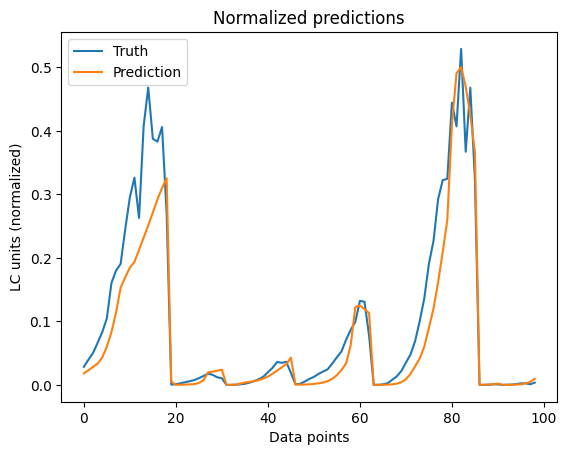

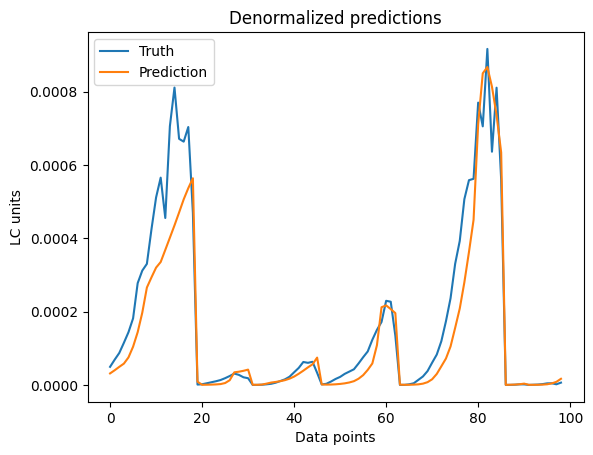

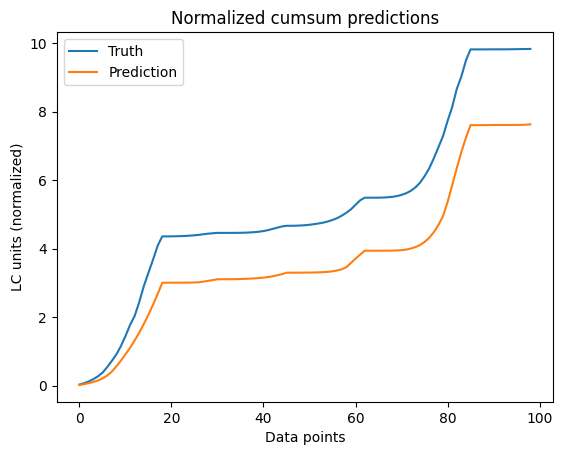

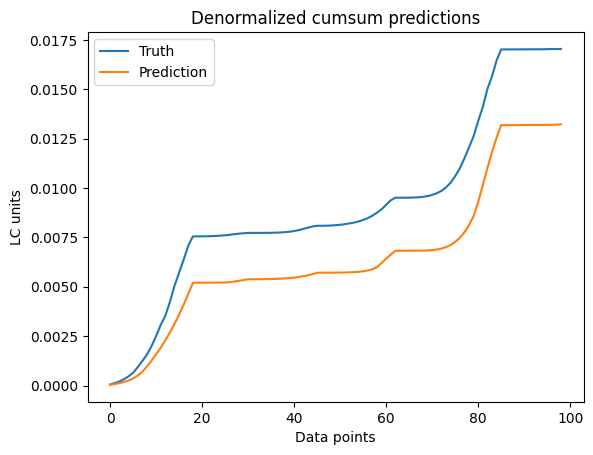

In [129]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [130]:
#Normalized score
get_metrics(y_test, preds)

[0.002701494, 0.030692495, 0.0519759, 8426.034, 956.1386, 36.584724]

In [131]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[8.120766e-09, 5.3214346e-05, 9.0115296e-05, 8411.703, 81.530945, 36.584686]

In [132]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[2.4979744, 1.4688736, 1.5804981, 31.072443, 30.630844, 18.200356]

In [133]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[7.508981e-06, 0.0025467186, 0.002740252, 31.072447, 30.630844, 18.200356]

In [134]:
result_list.append(['db2-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [135]:
model.save('model')

In [136]:
!zip -r "/content/db2-2_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 12%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [137]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [138]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0307 - rmse: 0.0520 - rmspe: 3934.4709 - mape: 956.1395 - smape: 36.9765


[0.002701493911445141,
 0.002701493911445141,
 0.03069249726831913,
 0.05197589844465256,
 3934.470947265625,
 956.1394653320312,
 36.97645568847656]

In [139]:
!cp "/content/db2-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-1-1***

## Data

### Get data

In [140]:
book = pd.ExcelFile('Data for ML TT-DB3-1-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'", "TT 59'",
 "TT 62'", "TT 65'", "TT 68'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 485, dtype: object
<PandasArray>
[0.39210526315789473,  0.7242105263157894,  1.0563157894736843,
   1.388421052631579,  1.7205263157894737,  2.0526315789473686,
   2.384736842105263,   2.716842105263158,   3.048947368421053,
  3.3810526315789473,
 ...
  1.0050000000000001,                1.28,                0.42,
  0.6257142857142857,  0.8314285714285714,  1.0371428571428571,
  1.2428571428571429,  1.4485714285714286,  1.6542857142857144,
                1.86]
Length: 485, dtype: float64
<PandasArray>
[ 979611.0535306311,  782150.2197052066,  636065.0081440957,
 495985.12177099194, 406514.03537471074, 324452.82590361737,
 257775.92452570048, 210110.49354382508, 162192.52105122514,
  135607.0134797413,
 ...
    650723.30925528,  546186.9026236447, 1178646.478

In [141]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [142]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [143]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [144]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(483, 3, 3) (483,)
[[0.06666667 0.04588228 0.70822761]
 [0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]] 0.00652591757502593
[[0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]] 0.008461001377945252
[[0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]] 0.003892739521347456
[[0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]] 0.013106366348797319
[[0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]] 0.016580732978954488
[[0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]] 0.01453319801558204
[[0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]] 0.026544038854726337
[[0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]
 

In [145]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [146]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [147]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

347
347
39
39
97
97


In [148]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [149]:
#number of features
n_features = X.shape[2]

In [150]:
model = create_model(model_type, n_steps, n_features)

In [151]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [152]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
11/11 - 1s - loss: 0.1845 - mse: 0.1845 - mae: 0.4232 - rmse: 0.4296 - rmspe: inf - mape: 1441063.6250 - smape: 89.6637 - val_loss: 0.1358 - val_mse: 0.1358 - val_mae: 0.3650 - val_rmse: 0.3685 - val_rmspe: 71154.4141 - val_mape: 38447.7617 - val_smape: 95.0540 - 1s/epoch - 134ms/step
Epoch 2/2000
11/11 - 0s - loss: 0.0860 - mse: 0.0860 - mae: 0.2793 - rmse: 0.2933 - rmspe: inf - mape: 902441.1250 - smape: 86.0833 - val_loss: 0.0305 - val_mse: 0.0305 - val_mae: 0.1664 - val_rmse: 0.1746 - val_rmspe: 34344.0195 - val_mape: 18075.3691 - val_smape: 90.8259 - 71ms/epoch - 6ms/step
Epoch 3/2000
11/11 - 0s - loss: 0.0204 - mse: 0.0204 - mae: 0.1064 - rmse: 0.1427 - rmspe: inf - mape: 144588.7344 - smape: 75.4417 - val_loss: 0.0027 - val_mse: 0.0027 - val_mae: 0.0414 - val_rmse: 0.0515 - val_rmspe: 7395.5820 - val_mape: 3778.0886 - val_smape: 84.0152 - 71ms/epoch - 6ms/step
Epoch 4/2000
11/11 - 0s - loss: 0.0111 - mse: 0.0111 - mae: 0.0424 - rmse: 0.1052 - rmspe: inf - mape: 1289

### Plot training results

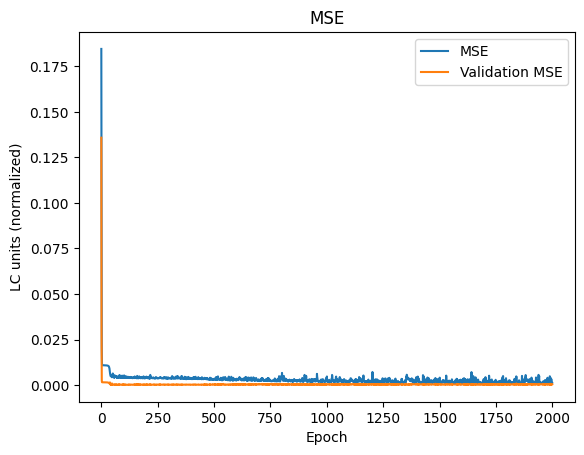

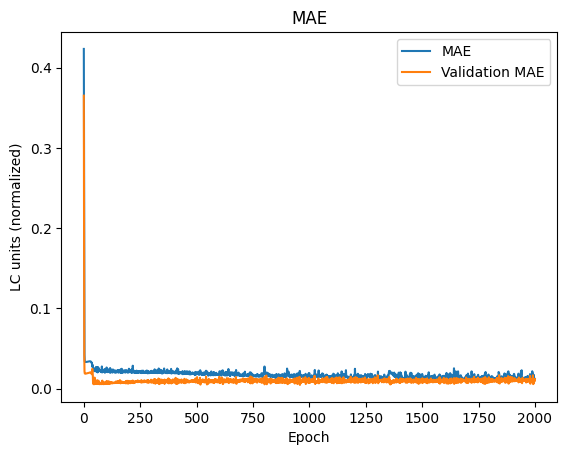

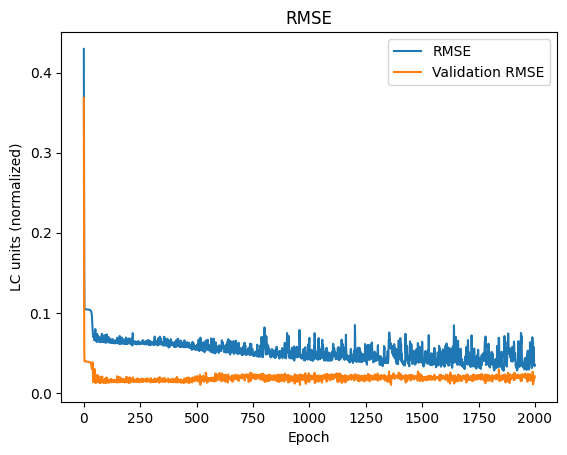

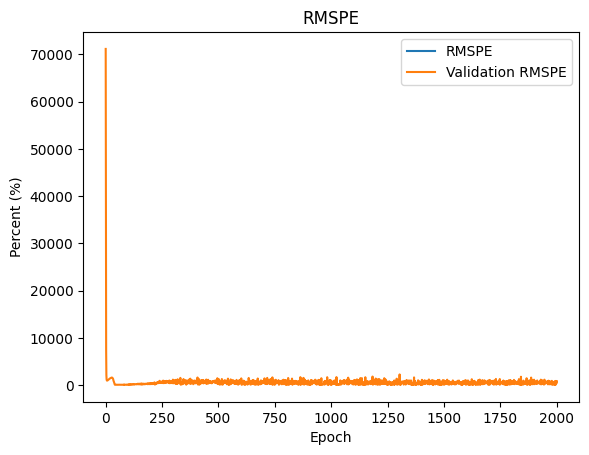

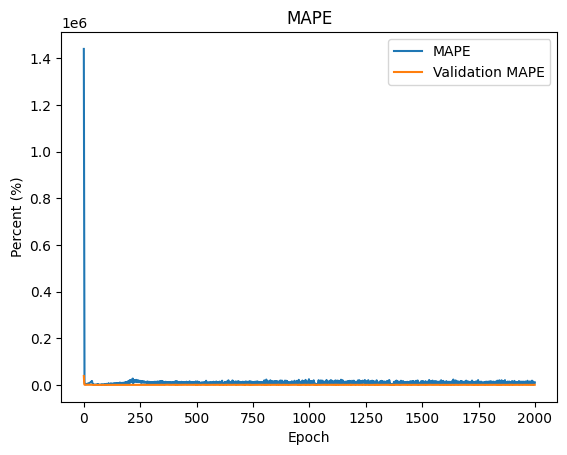

In [153]:
plot_train_results(history)

## Testing

### Predict

In [154]:
preds = predict_all(model, X_test)
print(preds)

[0.009029287, 0.010328533, 0.01617406, 0.02764636, 0.034492537, 0.03797518, 0.029520206, 0.033038408, 0.033747625, 0.03311699, 0.04112293, 0.061041303, 0.11361776, 0.17093165, 0.2279373, 0.23635693, 0.2524801, 0.44399586, 0.6270556, 0.0026192027, 0.0049064206, 0.010862129, 0.013607594, 0.014283263, 0.014401058, 0.01192539, 0.009370663, 0.010503007, 0.009908861, 0.01016708, 0.010655376, 0.0032557934, 0.0029728946, 0.0038938383, 0.005115765, 0.0067282002, 0.007107709, 0.007000023, 0.007746746, 0.0080996575, 0.00794201, 0.009239043, 0.010424643, 0.021083148, 0.03005355, 0.036181178, 0.008001468, 0.024580557, 0.022141736, 0.023202198, 0.022228822, 0.018965846, 0.015876004, 0.014648347, 0.015830653, 0.014161271, 0.014160093, 0.01612612, 0.022365734, 0.02979335, 0.031766888, 0.035742547, 0.0045080185, 0.00877375, 0.013316694, 0.017177878, 0.021872414, 0.02363482, 0.022533821, 0.021481859, 0.018666646, 0.0145415375, 0.011390148, 0.015634306, 0.015486975, 0.016987674, 0.016285826, 0.011697197,

### Inverse

In [155]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [156]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [157]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [158]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

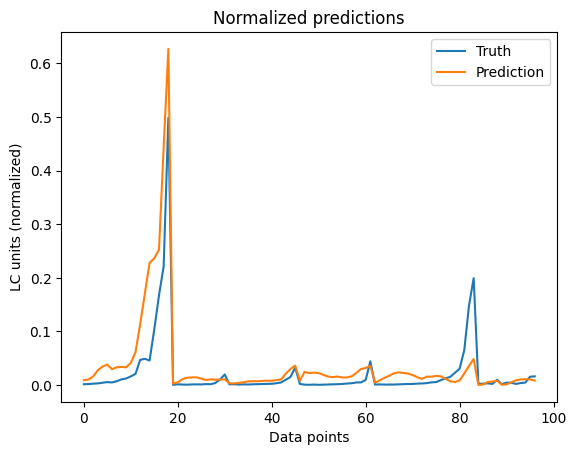

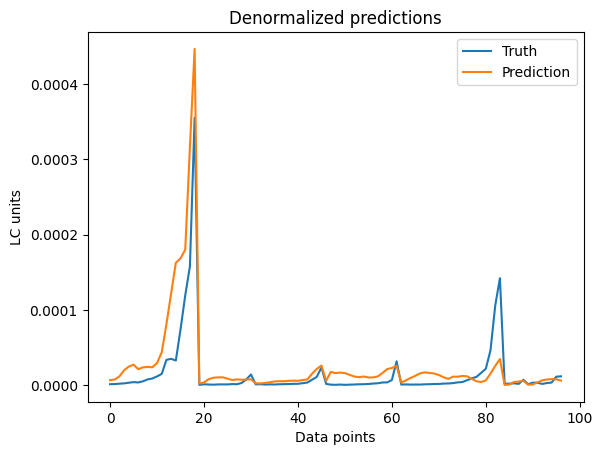

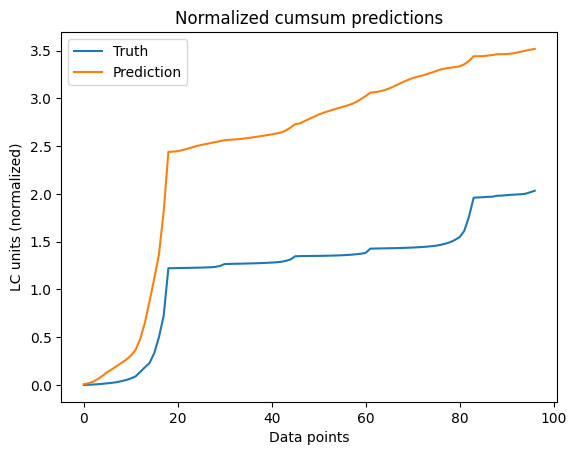

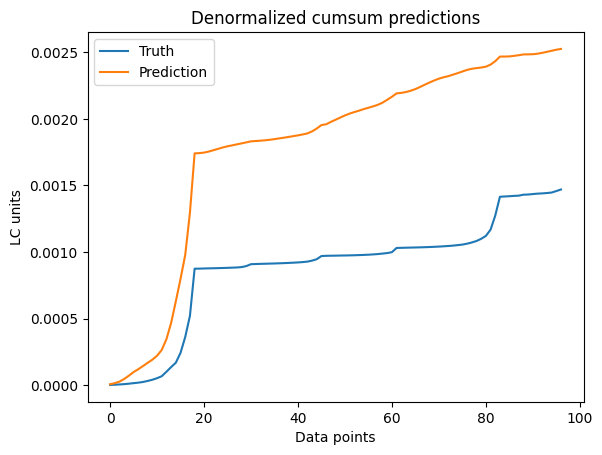

In [159]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [160]:
#Normalized score
get_metrics(y_test, preds)

[0.0020513623, 0.023444247, 0.045291968, 1116.2786, 610.7951, 58.77583]

In [161]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.0393195e-09, 1.6687438e-05, 3.223848e-05, 740.3773, 458.47403, 56.083244]

In [162]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.8931812, 1.2794087, 1.3759292, 212.2373, 160.90436, 39.717815]

In [163]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[9.59177e-07, 0.0009106731, 0.0009793758, 195.17863, 153.08362, 39.19297]

In [164]:
result_list.append(['db3-1-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [165]:
model.save('model')

In [166]:
!zip -r "/content/db3-1-1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 17%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [167]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [168]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0234 - rmse: 0.0453 - rmspe: 779.4089 - mape: 610.7947 - smape: 52.3474


[0.002051363233476877,
 0.002051363233476877,
 0.023444250226020813,
 0.04529197886586189,
 779.4088745117188,
 610.794677734375,
 52.347434997558594]

In [169]:
!cp "/content/db3-1-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-1-2***

## Data

### Get data

In [170]:
book = pd.ExcelFile('Data for ML TT-DB3-1-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 38'", "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'",
 "TT 59'", "TT 62'", "TT 65'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 496, dtype: object
<PandasArray>
[               0.06, 0.39210526315789473,  0.7242105263157894,
  1.0563157894736843,   1.388421052631579,  1.7205263157894737,
  2.0526315789473686,   2.384736842105263,   2.716842105263158,
   3.048947368421053,
 ...
  1.0050000000000001,                1.28,                0.42,
  0.6257142857142857,  0.8314285714285714,  1.0371428571428571,
  1.2428571428571429,  1.4485714285714286,  1.6542857142857144,
                1.86]
Length: 496, dtype: float64
<PandasArray>
[1229638.5606297883,  997252.2436807692,  798617.4805106316,
  657579.1198784112, 512536.20168558287, 414983.66632941243,
   336688.704052688,  265170.4348591843, 213324.56356174042,
 168350.32117537915,
 ...
  658283.3671847995,  575802.8092482509, 1190396.846

In [171]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [172]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [173]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [174]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(494, 3, 3) (494,)
[[0.03333333 0.00615764 0.87806846]
 [0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]] 0.00567363299024241
[[0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]] 0.0021285847277489
[[0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]] 0.0032706223389370437
[[0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]] 0.00176792728324566
[[0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]] 0.003575947111540261
[[0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]] 0.005283604410893063
[[0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.15127834]] 0.005439774542066924
[[0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.15127834]
 [

In [175]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [176]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [177]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

355
355
40
40
99
99


In [178]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [179]:
#number of features
n_features = X.shape[2]

In [180]:
model = create_model(model_type, n_steps, n_features)

In [181]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [182]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
12/12 - 2s - loss: 0.1835 - mse: 0.1835 - mae: 0.4236 - rmse: 0.4284 - rmspe: 43443.2266 - mape: 26514.4766 - smape: 91.8292 - val_loss: 0.1018 - val_mse: 0.1018 - val_mae: 0.3139 - val_rmse: 0.3191 - val_rmspe: 103483.5547 - val_mape: 56529.8750 - val_smape: 94.4498 - 2s/epoch - 131ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0517 - mse: 0.0517 - mae: 0.2032 - rmse: 0.2273 - rmspe: 17542.3301 - mape: 11656.3682 - smape: 87.5705 - val_loss: 0.0052 - val_mse: 0.0052 - val_mae: 0.0641 - val_rmse: 0.0724 - val_rmspe: 16952.7324 - val_mape: 9609.4629 - val_smape: 86.6954 - 61ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0098 - mse: 0.0098 - mae: 0.0449 - rmse: 0.0991 - rmspe: 2397.7053 - mape: 1662.0820 - smape: 70.3893 - val_loss: 0.0018 - val_mse: 0.0018 - val_mae: 0.0200 - val_rmse: 0.0423 - val_rmspe: 2070.0571 - val_mape: 1171.3500 - val_smape: 77.2731 - 73ms/epoch - 6ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0091 - mse: 0.0091 - mae: 0.0269 - rmse: 0.0952 - rmspe: 4

### Plot training results

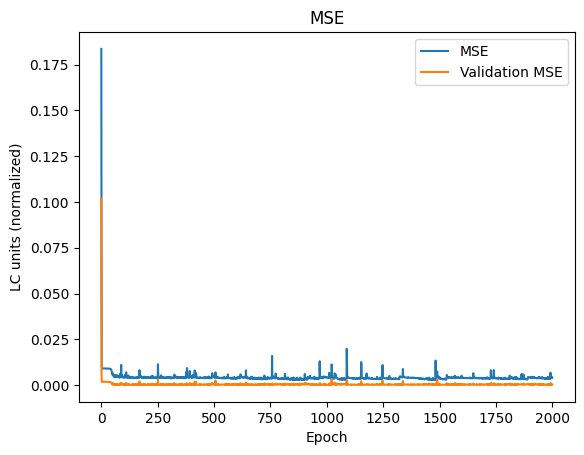

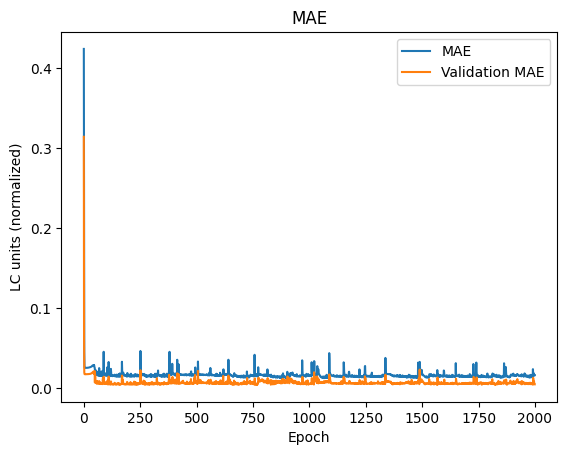

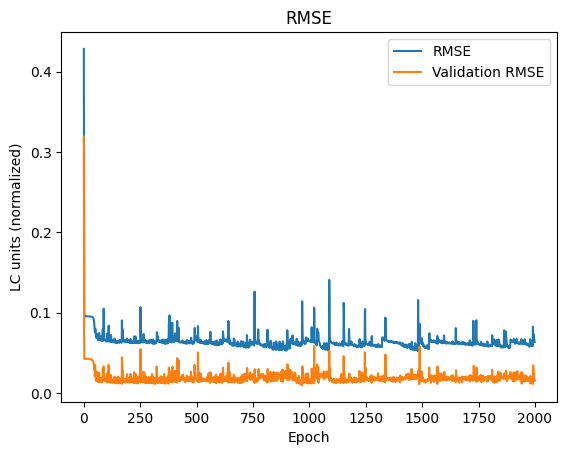

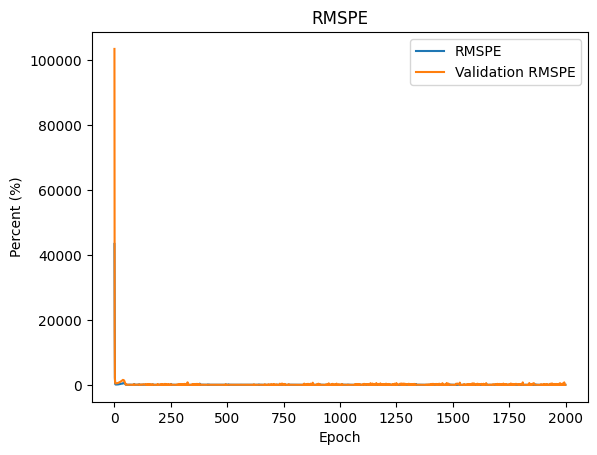

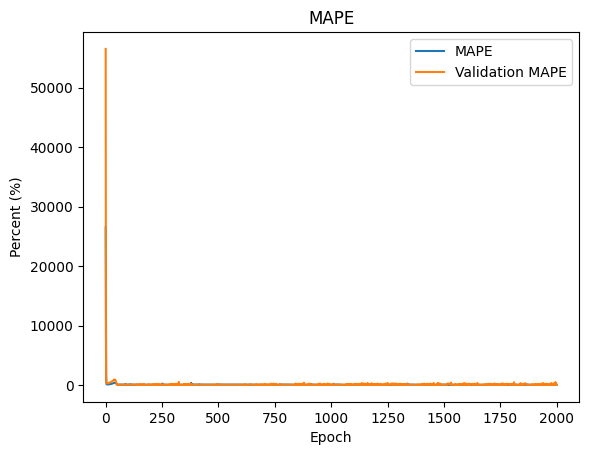

In [183]:
plot_train_results(history)

## Testing

### Predict

In [184]:
preds = predict_all(model, X_test)
print(preds)

[0.003427048, 0.0050944937, 0.0070894603, 0.009344539, 0.012380735, 0.016028259, 0.020350555, 0.0239536, 0.027926018, 0.033762638, 0.044130996, 0.061455913, 0.08451552, 0.1139385, 0.15006799, 0.18956031, 0.22616325, 0.25943127, 0.28164116, 0.0001611292, 1.5540638e-05, 6.175727e-06, 2.5430536e-05, 7.937483e-05, 0.00020137189, 0.0004313218, 0.0008063091, 0.001453651, 0.0024241728, 0.0037737335, 0.005234393, 5.418757e-05, 8.054044e-06, 5.6620797e-06, 2.375113e-05, 7.541479e-05, 0.00019335527, 0.00041389174, 0.0008281209, 0.0015165363, 0.0026185636, 0.00408205, 0.0059147626, 0.0080524525, 0.010418126, 0.01341581, 6.1683895e-05, 7.3654805e-06, 6.3161765e-06, 3.0425708e-05, 0.0001015289, 0.00025740272, 0.0005444524, 0.0009849309, 0.0017542595, 0.0028479737, 0.0044002323, 0.0063239164, 0.008617059, 0.0116495015, 0.01560472, 0.01978062, 0.022816064, 6.7928835e-05, 4.0497475e-06, 1.6961943e-06, 1.08050735e-05, 4.8391998e-05, 0.00015671868, 0.00040301066, 0.0008518817, 0.0016090767, 0.0028465209

### Inverse

In [185]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [186]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [187]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [188]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

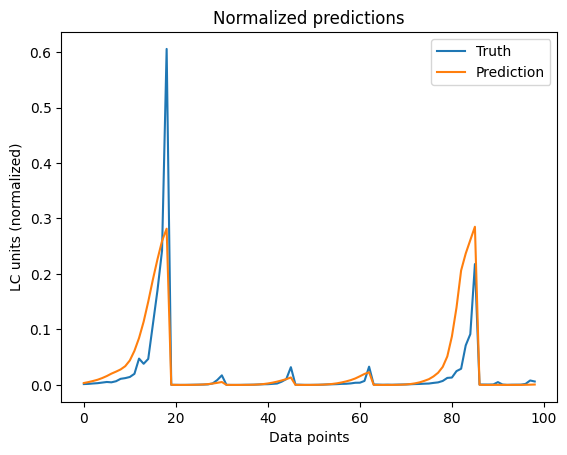

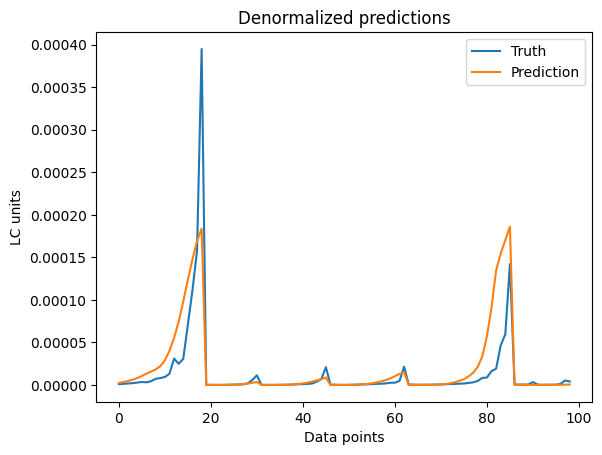

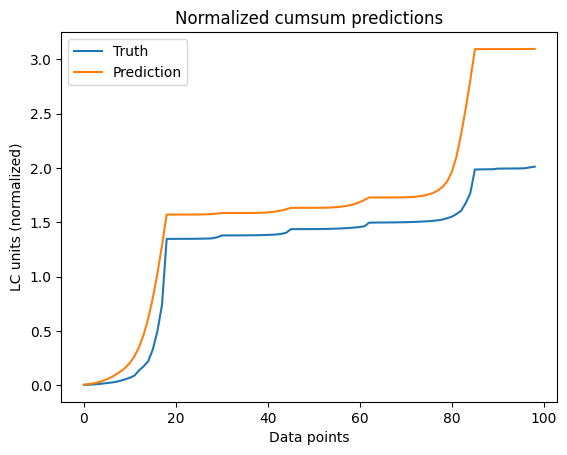

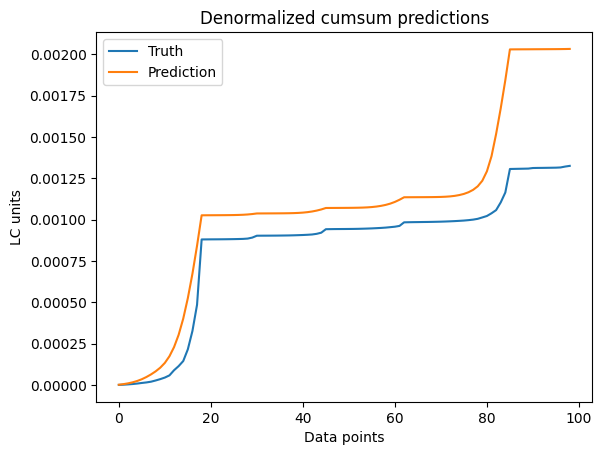

In [189]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [190]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.0025407607, 0.01902321, 0.05040596, inf, 204.95651, 48.989754]

In [191]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.0794414e-09, 1.2399423e-05, 3.2854852e-05, 159.76483, 109.0658, 35.74611]

In [192]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.24228746, 0.36192805, 0.49222705, 78.45258, 50.419895, 16.64551]

In [193]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.0293572e-07, 0.00023590645, 0.00032083597, 74.99001, 48.74288, 16.361616]

In [194]:
result_list.append(['db3-1-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [195]:
model.save('model')

In [196]:
!zip -r "/content/db3-1-2_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 16%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [197]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [198]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0190 - rmse: 0.0504 - rmspe: inf - mape: 204.9564 - smape: 56.8269 


[0.0025407609064131975,
 0.0025407609064131975,
 0.019023209810256958,
 0.05040596053004265,
 inf,
 204.9564208984375,
 56.82688903808594]

In [199]:
!cp "/content/db3-1-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-2-1***

## Data

### Get data

In [200]:
book = pd.ExcelFile('Data for ML TT-DB3-2-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'", "TT 59'",
 "TT 62'", "TT 65'", "TT 68'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 485, dtype: object
<PandasArray>
[0.39210526315789473,  0.7242105263157894,  1.0563157894736843,
   1.388421052631579,  1.7205263157894737,  2.0526315789473686,
   2.384736842105263,   2.716842105263158,   3.048947368421053,
  3.3810526315789473,
 ...
  1.0050000000000001,                1.28,                0.42,
  0.6257142857142857,  0.8314285714285714,  1.0371428571428571,
  1.2428571428571429,  1.4485714285714286,  1.6542857142857144,
                1.86]
Length: 485, dtype: float64
<PandasArray>
[ 816342.5446088592,  651791.8497543389,   530054.173453413,
 413320.93480915995, 338761.69614559226,  270377.3549196811,
 214813.27043808374, 175092.07795318755, 135160.43420935428,
 113005.84456645108,
 ...
     542269.4243794,  455155.7521863705,   982205.39

In [201]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [202]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [203]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [204]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(483, 3, 3) (483,)
[[0.06666667 0.04588228 0.70822761]
 [0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]] 0.006525917575025932
[[0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]] 0.008461001377945252
[[0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]] 0.003892739521347458
[[0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]] 0.013106366348797324
[[0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]] 0.01658073297895449
[[0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]] 0.014533198015582045
[[0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]] 0.026544038854726337
[[0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]


In [205]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [206]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [207]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

347
347
39
39
97
97


In [208]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [209]:
#number of features
n_features = X.shape[2]

In [210]:
model = create_model(model_type, n_steps, n_features)

In [211]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [212]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
11/11 - 2s - loss: 0.1865 - mse: 0.1865 - mae: 0.4256 - rmse: 0.4318 - rmspe: inf - mape: 1010453.8750 - smape: 89.6748 - val_loss: 0.1325 - val_mse: 0.1325 - val_mae: 0.3594 - val_rmse: 0.3640 - val_rmspe: 71547.4219 - val_mape: 38448.1328 - val_smape: 94.8950 - 2s/epoch - 193ms/step
Epoch 2/2000
11/11 - 0s - loss: 0.0771 - mse: 0.0771 - mae: 0.2559 - rmse: 0.2777 - rmspe: inf - mape: 707215.0000 - smape: 85.0170 - val_loss: 0.0152 - val_mse: 0.0152 - val_mae: 0.1119 - val_rmse: 0.1234 - val_rmspe: 26415.7422 - val_mape: 13354.4844 - val_smape: 87.9176 - 101ms/epoch - 9ms/step
Epoch 3/2000
11/11 - 0s - loss: 0.0147 - mse: 0.0147 - mae: 0.0722 - rmse: 0.1213 - rmspe: inf - mape: 8524.3535 - smape: 70.0107 - val_loss: 0.0017 - val_mse: 0.0017 - val_mae: 0.0254 - val_rmse: 0.0417 - val_rmspe: 3752.0459 - val_mape: 1789.6112 - val_smape: 80.1835 - 86ms/epoch - 8ms/step
Epoch 4/2000
11/11 - 0s - loss: 0.0110 - mse: 0.0110 - mae: 0.0353 - rmse: 0.1047 - rmspe: inf - mape: 1582.

### Plot training results

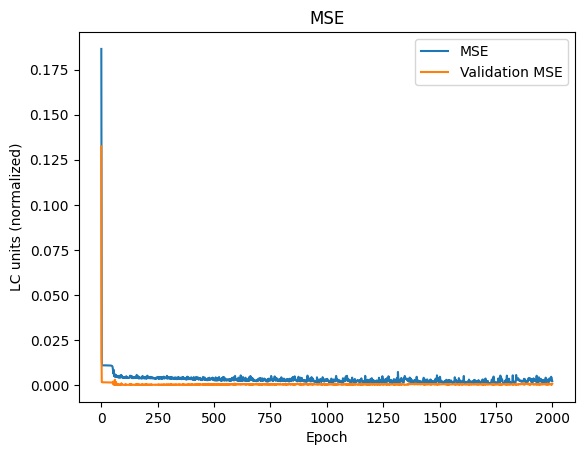

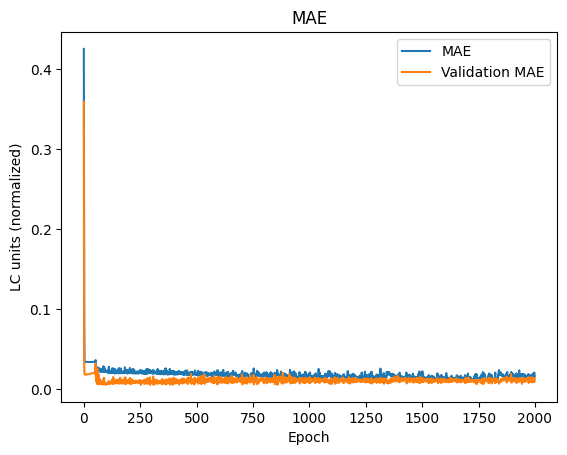

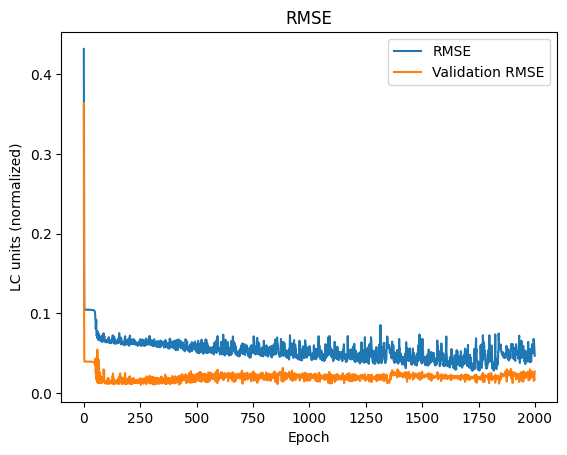

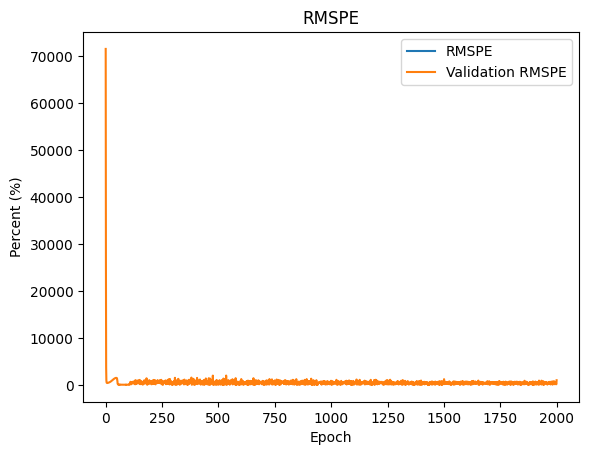

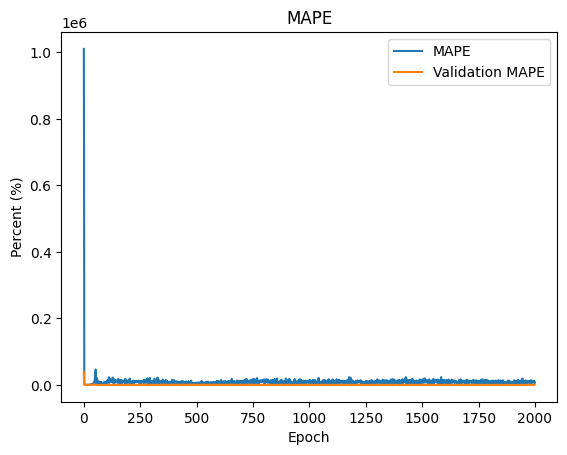

In [213]:
plot_train_results(history)

## Testing

### Predict

In [214]:
preds = predict_all(model, X_test)
print(preds)

[0.004778353, 0.0035205784, 0.0072729615, 0.016507665, 0.022257624, 0.021004416, 0.016658096, 0.015003095, 0.015838811, 0.015471664, 0.020738106, 0.037323114, 0.0619582, 0.09828775, 0.14070079, 0.19451517, 0.26079512, 0.33666304, 0.46073797, 0.0053072996, 0.008117864, 0.015529973, 0.01946835, 0.01985726, 0.021195646, 0.017420147, 0.012973365, 0.009567786, 0.010950143, 0.00797581, 0.005100721, 0.005777137, 0.003664429, 0.0046235034, 0.008633282, 0.009122202, 0.009518363, 0.008815637, 0.006985907, 0.008872995, 0.0065477486, 0.0050748726, 0.0050315163, 0.011169908, 0.020596633, 0.023991361, 0.008296088, 0.015680788, 0.028210677, 0.029140878, 0.028126962, 0.03310772, 0.025739223, 0.018277004, 0.012373787, 0.012294717, 0.011184679, 0.011934922, 0.013326063, 0.015925024, 0.020420952, 0.01713768, 0.0038209918, 0.009690596, 0.015637703, 0.020784138, 0.024106225, 0.03278425, 0.040328506, 0.03557728, 0.029182602, 0.02333041, 0.015286632, 0.015044148, 0.015050446, 0.015441522, 0.017033737, 0.0225

### Inverse

In [215]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [216]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [217]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [218]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

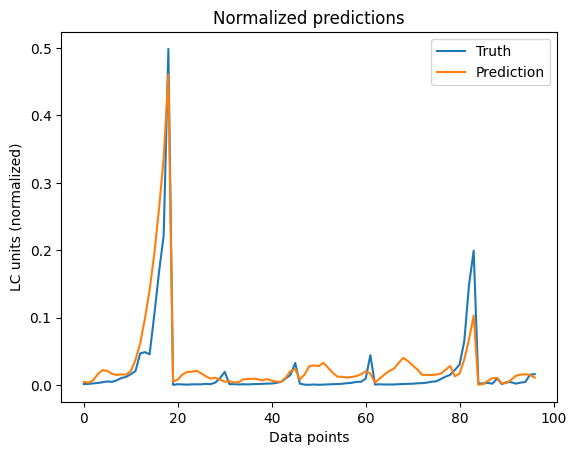

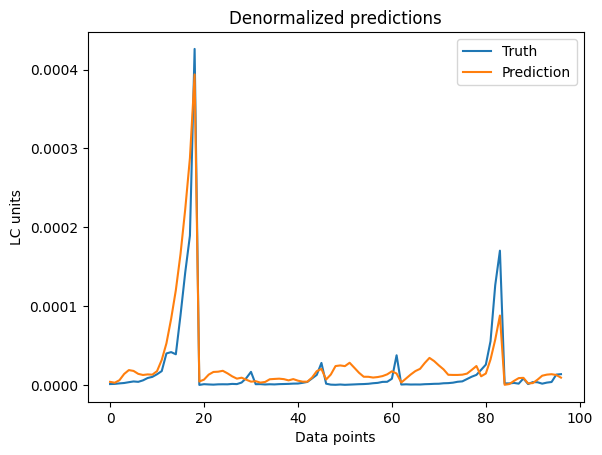

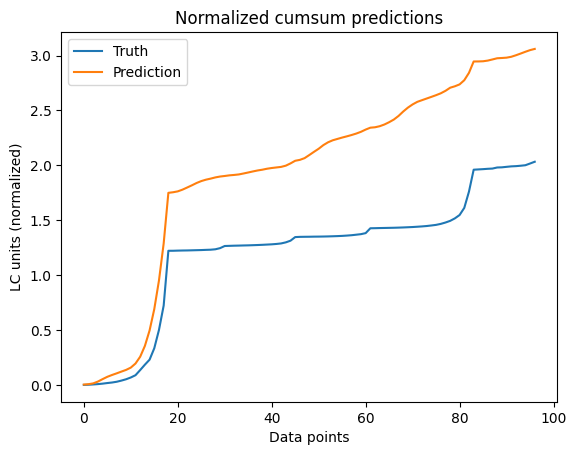

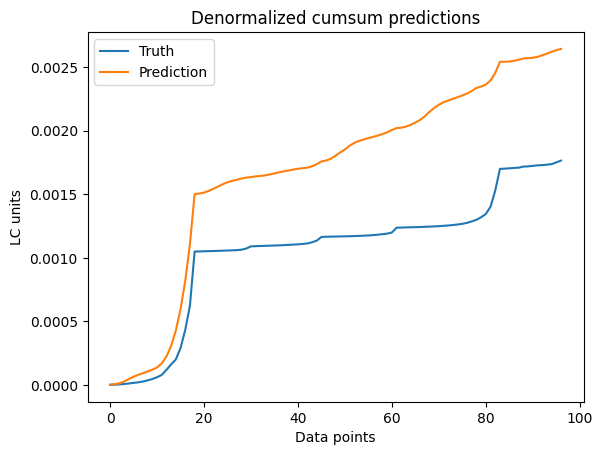

In [219]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [220]:
#Normalized score
get_metrics(y_test, preds)

[0.00079846126, 0.017347738, 0.028257057, 1425.6284, 724.6741, 53.865303]

In [221]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[5.825363e-10, 1.4817586e-05, 2.4135788e-05, 940.6148, 529.7814, 51.592743]

In [222]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.65573025, 0.7340275, 0.8097717, 98.65317, 80.64877, 26.74274]

In [223]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[4.7840365e-07, 0.0006269704, 0.0006916673, 91.772194, 77.207054, 26.215765]

In [224]:
result_list.append(['db3-2-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [225]:
model.save('model')

In [226]:
!zip -r "/content/db3-2-1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 88%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 15%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [227]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [228]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 7.9846e-04 - mse: 7.9846e-04 - mae: 0.0173 - rmse: 0.0283 - rmspe: 1002.7677 - mape: 724.6741 - smape: 45.3882


[0.0007984611438587308,
 0.0007984611438587308,
 0.01734774000942707,
 0.028257055208086967,
 1002.7677001953125,
 724.674072265625,
 45.38821792602539]

In [229]:
!cp "/content/db3-2-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-2-2***

## Data

### Get data

In [230]:
book = pd.ExcelFile('Data for ML TT-DB3-2-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 38'", "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'",
 "TT 59'", "TT 62'", "TT 65'",
 ...
 "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'",
 "TT 46'", "TT 49'", "TT 52'"]
Length: 494, dtype: object
<PandasArray>
[               0.06, 0.39210526315789473,  0.7242105263157894,
  1.0563157894736843,   1.388421052631579,  1.7205263157894737,
  2.0526315789473686,   2.384736842105263,   2.716842105263158,
   3.048947368421053,
 ...
               0.455,                0.73,  1.0050000000000001,
                1.28,                0.42,  0.6257142857142857,
  0.8314285714285714,  1.0371428571428571,  1.2428571428571429,
  1.4485714285714286]
Length: 494, dtype: float64
<PandasArray>
[1024698.8005248236,   831043.536400641,  665514.5670921929,
  547982.5998986758,  427113.5014046524, 345819.72194117703,
 280573.92004390666, 220975.36238265358, 177770.46963478366,
 140291.93431281595,
 ...
  833243.5720280429,  672949.2119512447,  548569.472

In [231]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [232]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [233]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [234]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(492, 3, 3) (492,)
[[0.03333333 0.00615764 0.87806846]
 [0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]] 0.00567363299024241
[[0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]] 0.0021285847277489004
[[0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]] 0.0032706223389370433
[[0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]] 0.0017679272832456599
[[0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]] 0.0035759471115402596
[[0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]] 0.005283604410893063
[[0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.15127834]] 0.005439774542066924
[[0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.151278

In [235]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [236]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [237]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

353
353
40
40
99
99


In [238]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [239]:
#number of features
n_features = X.shape[2]

In [240]:
model = create_model(model_type, n_steps, n_features)

In [241]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [242]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
12/12 - 2s - loss: 0.1632 - mse: 0.1632 - mae: 0.3956 - rmse: 0.4040 - rmspe: 38944.8203 - mape: 25534.2637 - smape: 89.9047 - val_loss: 0.0769 - val_mse: 0.0769 - val_mae: 0.2704 - val_rmse: 0.2772 - val_rmspe: 94700.1406 - val_mape: 47634.3672 - val_smape: 93.4886 - 2s/epoch - 169ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0385 - mse: 0.0385 - mae: 0.1690 - rmse: 0.1962 - rmspe: 15243.4209 - mape: 10180.3467 - smape: 85.7052 - val_loss: 0.0034 - val_mse: 0.0034 - val_mae: 0.0495 - val_rmse: 0.0587 - val_rmspe: 12366.3789 - val_mape: 6850.8999 - val_smape: 85.3595 - 103ms/epoch - 9ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0095 - mse: 0.0095 - mae: 0.0389 - rmse: 0.0973 - rmspe: 1889.4652 - mape: 1246.5615 - smape: 71.2382 - val_loss: 0.0018 - val_mse: 0.0018 - val_mae: 0.0186 - val_rmse: 0.0422 - val_rmspe: 1405.3888 - val_mape: 798.5273 - val_smape: 74.8637 - 108ms/epoch - 9ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0091 - mse: 0.0091 - mae: 0.0263 - rmse: 0.0956 - rmspe: 3

### Plot training results

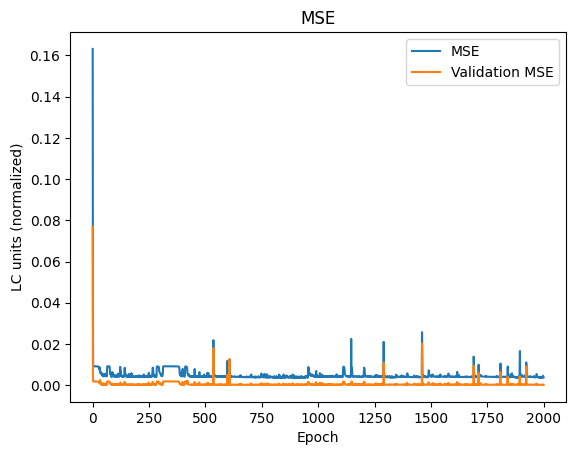

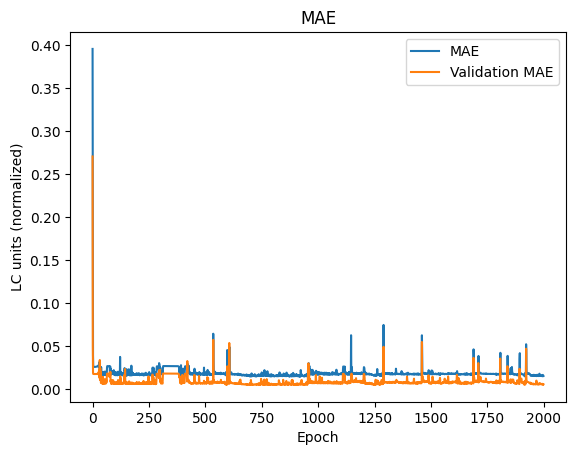

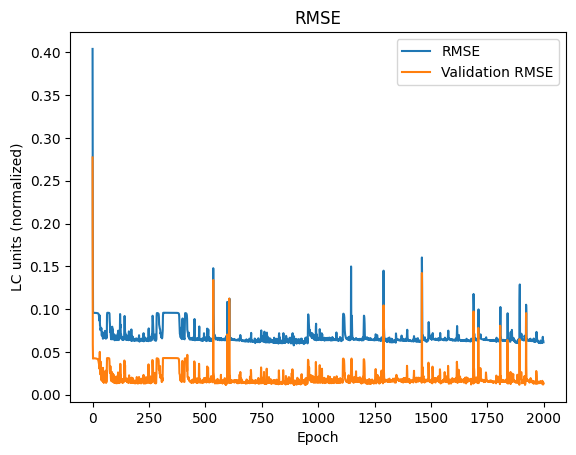

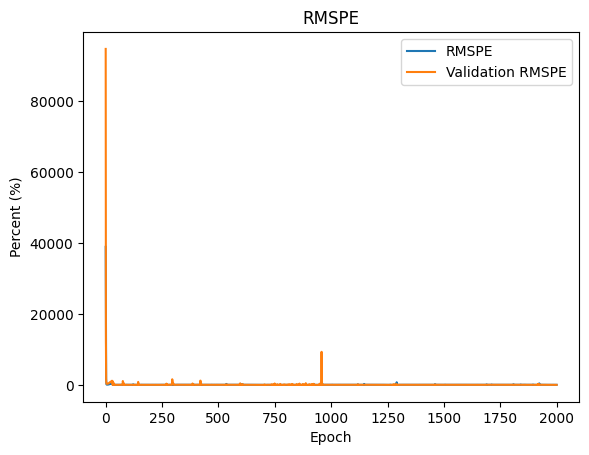

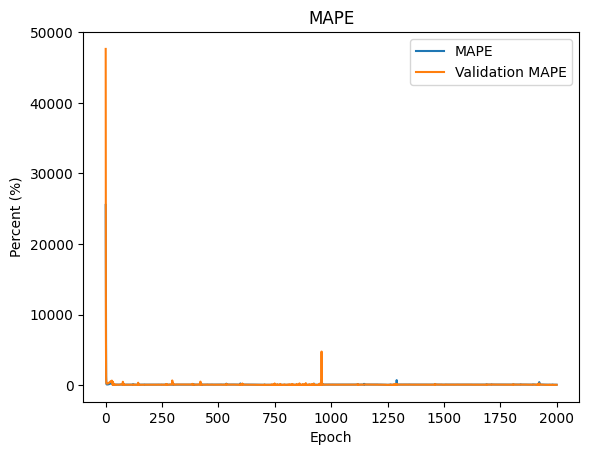

In [243]:
plot_train_results(history)

## Testing

### Predict

In [244]:
preds = predict_all(model, X_test)
print(preds)

[0.0009786312, 0.0020315698, 0.0035617268, 0.005486412, 0.007825801, 0.009996199, 0.011893254, 0.014659336, 0.01806204, 0.022505336, 0.027403207, 0.029829487, 0.03592374, 0.062834874, 0.10209624, 0.14328176, 0.19598722, 0.23489167, 0.26161268, 0.2851691, 0.29895982, 9.849863e-05, 3.1106895e-06, 1.26702e-07, 1.495829e-06, 1.09411685e-05, 5.1375195e-05, 0.00018481187, 0.00051087845, 0.0012195889, 0.0024689739, 0.0041263993, 0.0057963515, 1.9412406e-05, 1.1605687e-06, 1.3221596e-07, 1.6149505e-06, 1.1577505e-05, 5.62831e-05, 0.00019845783, 0.00054737885, 0.0012997605, 0.0026268985, 0.0043667317, 0.0064986055, 0.008956512, 0.011025752, 0.012883508, 2.3701328e-05, 1.0900029e-06, 1.135912e-07, 1.8002231e-06, 1.4527537e-05, 6.741676e-05, 0.00024008485, 0.0006397463, 0.0015068694, 0.0029013806, 0.0048133805, 0.0072123413, 0.0100862775, 0.012447138, 0.014604898, 0.017695067, 0.021550154, 3.1655738e-05, 3.77432e-07, 1.966535e-08, 3.173898e-07, 4.1926055e-06, 3.111568e-05, 0.00013556343, 0.000466

### Inverse

In [245]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [246]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [247]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [248]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

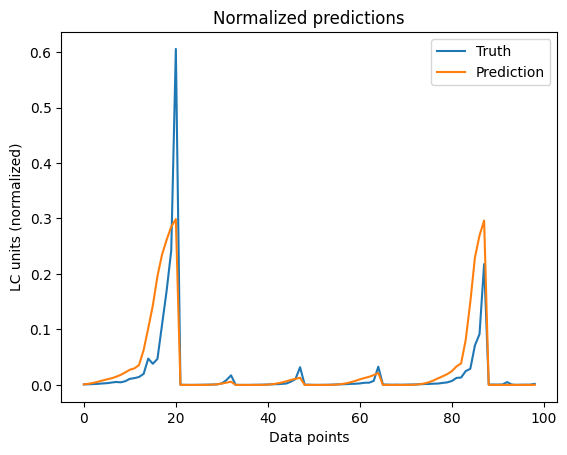

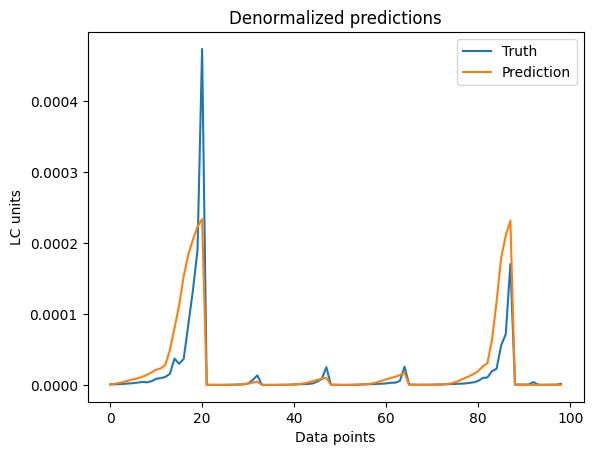

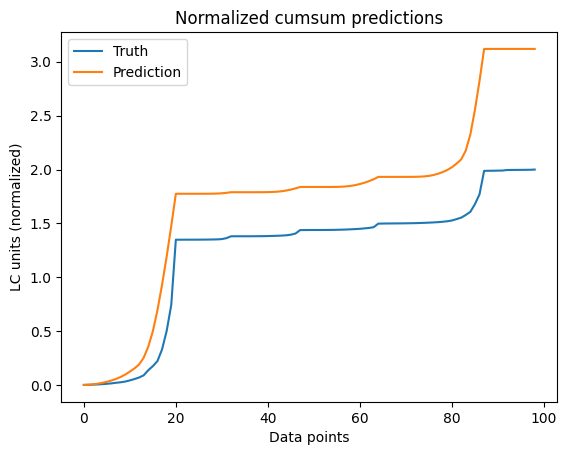

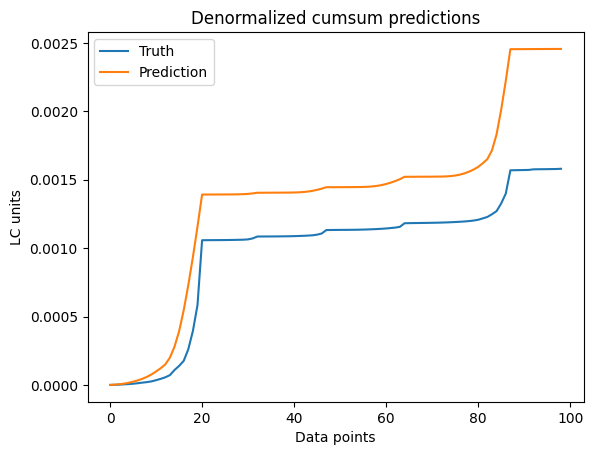

In [249]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [250]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.002460215, 0.018859355, 0.049600553, inf, 136.0854, 57.638412]

In [251]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.5051191e-09, 1.47511455e-05, 3.8795864e-05, 138.89137, 105.26708, 37.66826]

In [252]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.31471294, 0.4768449, 0.56099284, 78.57501, 58.069134, 19.994442]

In [253]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.9253595e-07, 0.00037297158, 0.0004387892, 75.114265, 56.132, 19.61931]

In [254]:
result_list.append(['db3-2-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [255]:
model.save('model')

In [256]:
!zip -r "/content/db3-2-2_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 17%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [257]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [258]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 4ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0189 - rmse: 0.0496 - rmspe: inf - mape: 136.0855 - smape: 66.5249 


[0.002460215240716934,
 0.002460215240716934,
 0.01885935477912426,
 0.04960055649280548,
 inf,
 136.08546447753906,
 66.5249252319336]

In [259]:
!cp "/content/db3-2-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-3-1***

## Data

### Get data

In [260]:
book = pd.ExcelFile('Data for ML TT-DB3-3-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'", "TT 59'",
 "TT 62'", "TT 65'", "TT 68'",
 ...
 "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'",
 "TT 46'", "TT 49'", "TT 52'"]
Length: 483, dtype: object
<PandasArray>
[0.39210526315789473,  0.7242105263157894,  1.0563157894736843,
   1.388421052631579,  1.7205263157894737,  2.0526315789473686,
   2.384736842105263,   2.716842105263158,   3.048947368421053,
  3.3810526315789473,
 ...
               0.455,                0.73,  1.0050000000000001,
                1.28,                0.42,  0.6257142857142857,
  0.8314285714285714,  1.0371428571428571,  1.2428571428571429,
  1.4485714285714286]
Length: 483, dtype: float64
<PandasArray>
[ 653074.0356870873, 521433.47980347107,  424043.3387627304,
 330656.74784732796, 271009.35691647383,  216301.8839357449,
   171850.616350467, 140073.66236255004, 108128.34736748342,
  90404.67565316086,
 ...
  656595.4452535409,  529355.5303445649, 433815.5395

In [261]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [262]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [263]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [264]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(481, 3, 3) (481,)
[[0.06666667 0.04588228 0.70822761]
 [0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]] 0.006525917575025931
[[0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]] 0.008461001377945254
[[0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]] 0.003892739521347457
[[0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]] 0.013106366348797322
[[0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]] 0.01658073297895449
[[0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]] 0.014533198015582045
[[0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]] 0.026544038854726337
[[0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]


In [265]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [266]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [267]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

345
345
39
39
97
97


In [268]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [269]:
#number of features
n_features = X.shape[2]

In [270]:
model = create_model(model_type, n_steps, n_features)

In [271]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
11/11 - 2s - loss: 0.1982 - mse: 0.1982 - mae: 0.4402 - rmse: 0.4452 - rmspe: inf - mape: 1436029.2500 - smape: 90.0482 - val_loss: 0.1515 - val_mse: 0.1515 - val_mae: 0.3861 - val_rmse: 0.3893 - val_rmspe: 92851.0859 - val_mape: 39508.3164 - val_smape: 95.2025 - 2s/epoch - 201ms/step
Epoch 2/2000
11/11 - 0s - loss: 0.0957 - mse: 0.0957 - mae: 0.2965 - rmse: 0.3093 - rmspe: inf - mape: 1117619.5000 - smape: 86.3589 - val_loss: 0.0307 - val_mse: 0.0307 - val_mae: 0.1682 - val_rmse: 0.1752 - val_rmspe: 40435.0938 - val_mape: 17867.3242 - val_smape: 90.6929 - 76ms/epoch - 7ms/step
Epoch 3/2000
11/11 - 0s - loss: 0.0201 - mse: 0.0201 - mae: 0.1038 - rmse: 0.1418 - rmspe: inf - mape: 84826.5703 - smape: 74.0667 - val_loss: 0.0021 - val_mse: 0.0021 - val_mae: 0.0342 - val_rmse: 0.0458 - val_rmspe: 6238.7681 - val_mape: 2894.2795 - val_smape: 82.0368 - 76ms/epoch - 7ms/step
Epoch 4/2000
11/11 - 0s - loss: 0.0110 - mse: 0.0110 - mae: 0.0391 - rmse: 0.1051 - rmspe: inf - mape: 7418

### Plot training results

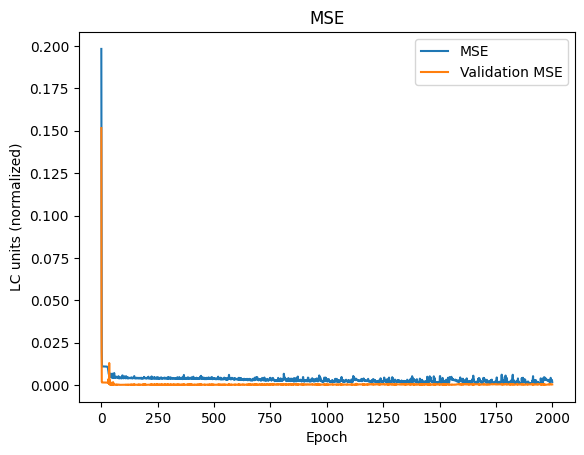

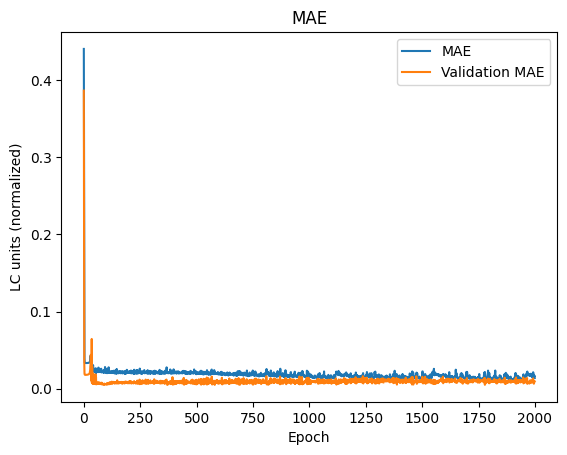

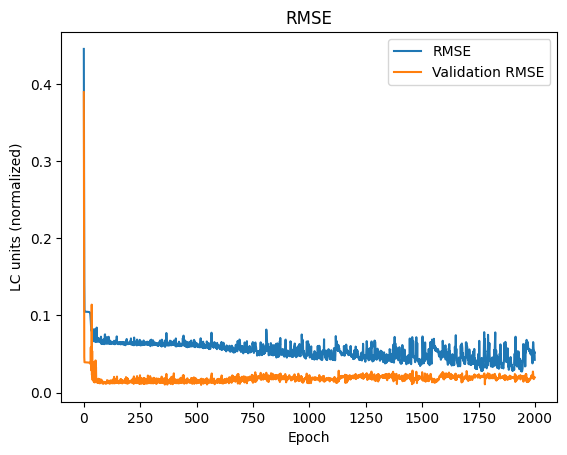

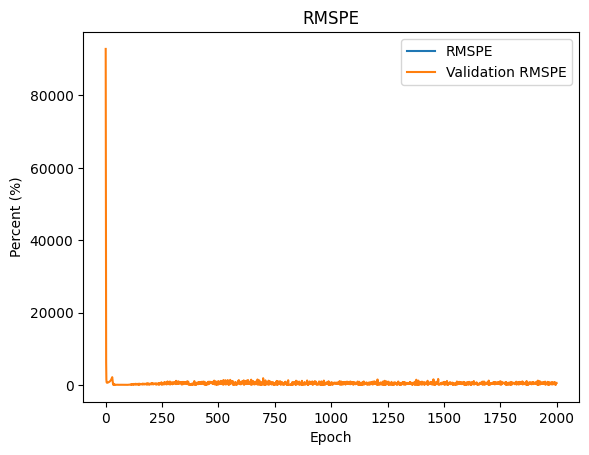

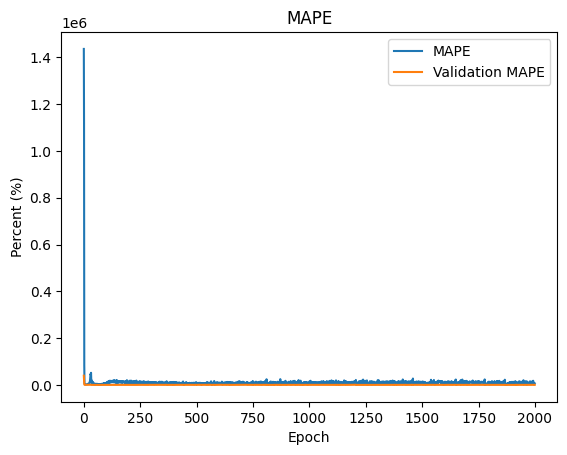

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

[0.0056017353, 0.005709038, 0.007432909, 0.009520417, 0.01817126, 0.022911938, 0.026509294, 0.026913233, 0.026065689, 0.026677532, 0.029350039, 0.033168003, 0.049914792, 0.078772485, 0.117816545, 0.1741348, 0.23367594, 0.29139638, 0.37180856, 0.6089463, 0.7704195, 0.0019400424, 0.0037915313, 0.0055310107, 0.009498523, 0.010981327, 0.010666143, 0.010574035, 0.009750182, 0.008457155, 0.0070206486, 0.008320471, 0.010053104, 0.0018635321, 0.0018611887, 0.0017538696, 0.0032523614, 0.005391255, 0.0059017544, 0.0065049566, 0.0060502025, 0.0057286764, 0.006512122, 0.008361767, 0.011144061, 0.021863593, 0.026089687, 0.027717724, 0.0069901193, 0.019906385, 0.012548689, 0.014187518, 0.016691769, 0.016017646, 0.015030503, 0.014667004, 0.013455471, 0.011791303, 0.013607223, 0.019984843, 0.023036277, 0.025057891, 0.02670847, 0.026905905, 0.0033951937, 0.00867073, 0.008018993, 0.011419307, 0.014723031, 0.01819841, 0.019692158, 0.02069505, 0.023619508, 0.026565868, 0.027382616, 0.027441151, 0.02890058

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

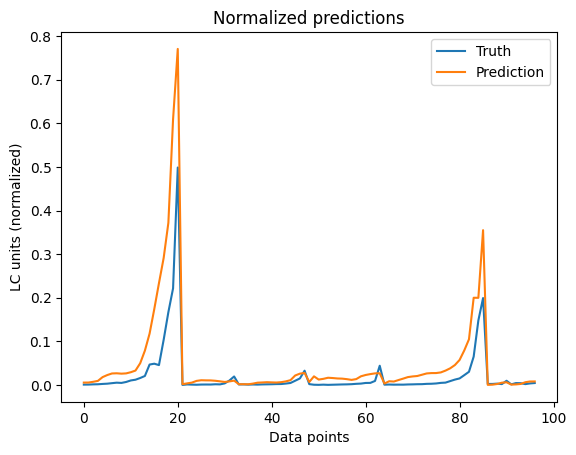

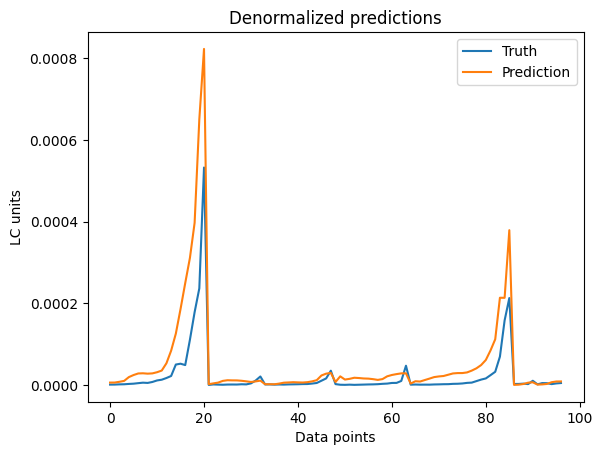

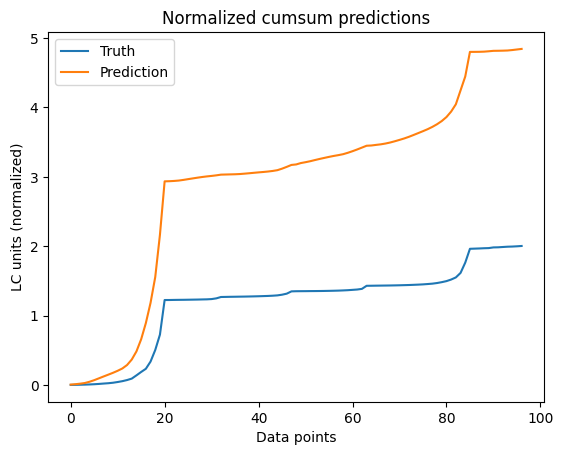

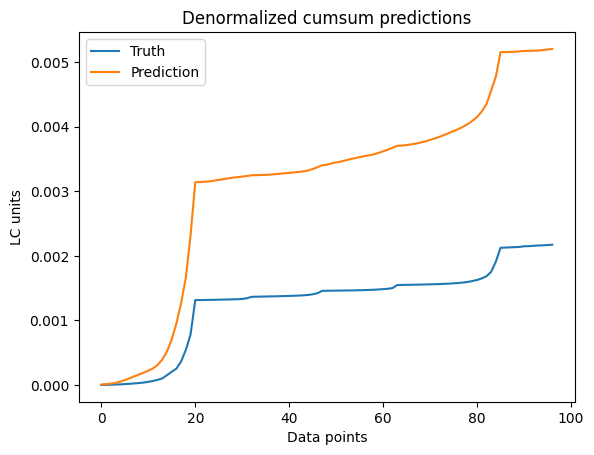

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.004456584, 0.030258324, 0.06675765, 827.99493, 515.7977, 58.241116]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[5.080322e-09, 3.230647e-05, 7.127638e-05, 574.6554, 400.78506, 55.393536]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[3.6504958, 1.7275165, 1.910627, 220.15152, 192.04272, 46.374645]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[4.1614153e-06, 0.0018444496, 0.0020399548, 200.35376, 181.1657, 45.619255]

In [ ]:
result_list.append(['db3-3-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db3-3-1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0303 - rmse: 0.0668 - rmspe: 602.2007 - mape: 515.7977 - smape: 51.0043


[0.004456585738807917,
 0.004456585738807917,
 0.03025832585990429,
 0.06675766408443451,
 602.2007446289062,
 515.7977294921875,
 51.00425720214844]

In [ ]:
!cp "/content/db3-3-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-3-2***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB3-3-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 38'", "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'",
 "TT 59'", "TT 62'", "TT 65'",
 ...
 "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'",
 "TT 46'", "TT 49'", "TT 52'"]
Length: 494, dtype: object
<PandasArray>
[               0.06, 0.39210526315789473,  0.7242105263157894,
  1.0563157894736843,   1.388421052631579,  1.7205263157894737,
  2.0526315789473686,   2.384736842105263,   2.716842105263158,
   3.048947368421053,
 ...
               0.455,                0.73,  1.0050000000000001,
                1.28,                0.42,  0.6257142857142857,
  0.8314285714285714,  1.0371428571428571,  1.2428571428571429,
  1.4485714285714286]
Length: 494, dtype: float64
<PandasArray>
[ 819759.0404198589,  664834.8291205128,  532411.6536737544,
  438386.0799189407,  341690.8011237219, 276655.77755294164,
 224459.13603512532, 176780.28990612287, 142216.37570782696,
 112233.54745025275,
 ...
  666594.8576224343,  538359.3695609958,  438855.578

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(492, 3, 3) (492,)
[[0.03333333 0.00615764 0.87806846]
 [0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]] 0.00567363299024241
[[0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]] 0.0021285847277489
[[0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]] 0.0032706223389370437
[[0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]] 0.0017679272832456599
[[0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]] 0.00357594711154026
[[0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]] 0.005283604410893063
[[0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.15127834]] 0.005439774542066923
[[0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.15127834]
 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

353
353
40
40
99
99


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
12/12 - 1s - loss: 0.2125 - mse: 0.2125 - mae: 0.4580 - rmse: 0.4610 - rmspe: 50939.3789 - mape: 29760.2090 - smape: 93.4349 - val_loss: 0.1726 - val_mse: 0.1726 - val_mae: 0.4129 - val_rmse: 0.4154 - val_rmspe: 157189.7969 - val_mape: 75819.0000 - val_smape: 95.5684 - 1s/epoch - 118ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.1310 - mse: 0.1310 - mae: 0.3538 - rmse: 0.3619 - rmspe: 39420.9805 - mape: 22829.2246 - smape: 91.8393 - val_loss: 0.0599 - val_mse: 0.0599 - val_mae: 0.2387 - val_rmse: 0.2447 - val_rmspe: 87263.7500 - val_mape: 43610.5117 - val_smape: 92.9418 - 60ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0335 - mse: 0.0335 - mae: 0.1578 - rmse: 0.1831 - rmspe: 14260.5928 - mape: 9648.6416 - smape: 84.5881 - val_loss: 0.0042 - val_mse: 0.0042 - val_mae: 0.0561 - val_rmse: 0.0646 - val_rmspe: 16950.1055 - val_mape: 8982.2002 - val_smape: 85.7390 - 60ms/epoch - 5ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0099 - mse: 0.0099 - mae: 0.0464 - rmse: 0.0996 - rmspe

### Plot training results

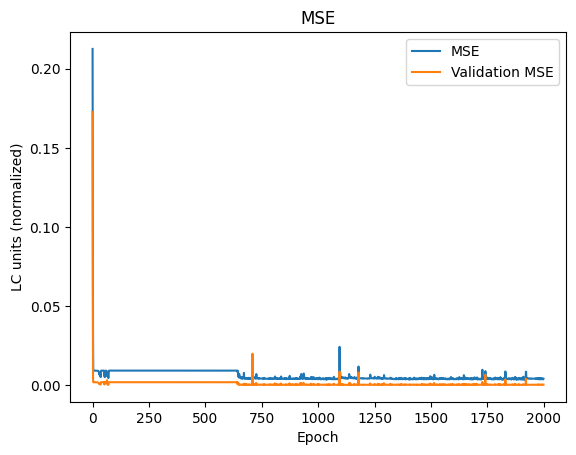

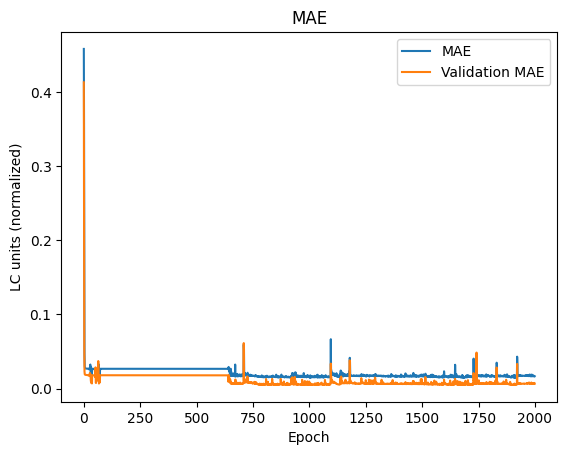

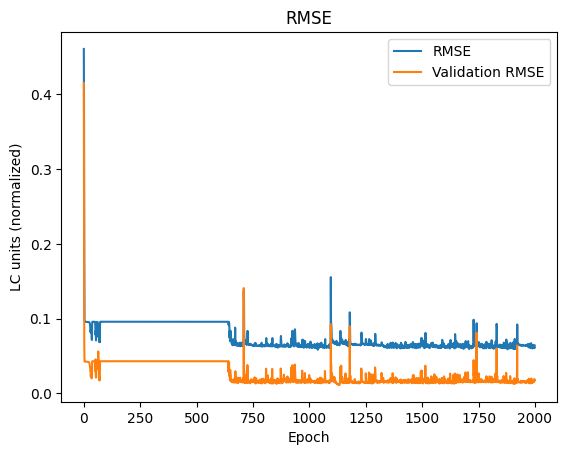

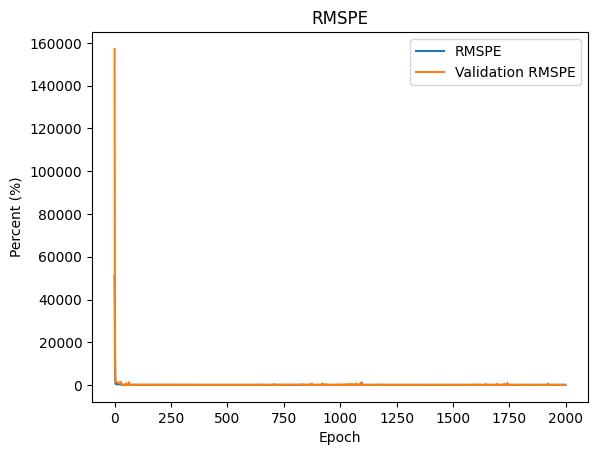

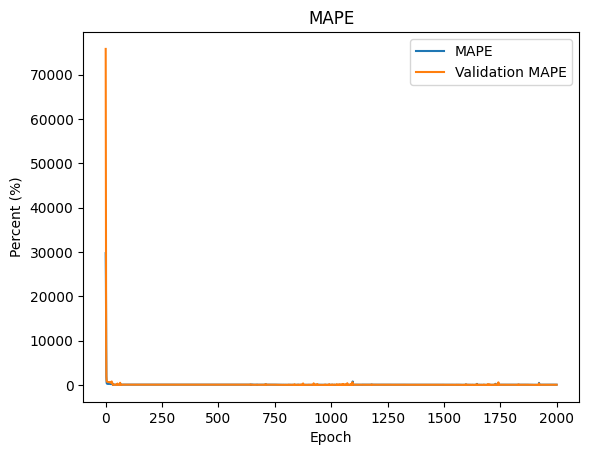

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

[0.00010423887, 0.0002022129, 0.00034881503, 0.0005502163, 0.0008931188, 0.001876532, 0.0035926637, 0.0064005246, 0.0109140305, 0.017410086, 0.02629639, 0.037657943, 0.053057693, 0.07183061, 0.095194146, 0.12299214, 0.15618879, 0.18985896, 0.22468495, 0.26154482, 0.29986462, 2.30756e-06, 5.0955137e-08, 1.6351729e-08, 1.7610354e-07, 1.1521367e-06, 5.268096e-06, 1.8682811e-05, 5.3474036e-05, 0.00012535317, 0.000244095, 0.0004121825, 0.0005934853, 1.9422864e-06, 4.381027e-08, 2.2664315e-08, 2.3943954e-07, 1.5488262e-06, 6.8858703e-06, 2.2955597e-05, 6.379208e-05, 0.00014345246, 0.0002717004, 0.0004513997, 0.00068653707, 0.0012420868, 0.0025184122, 0.004371033, 1.908263e-06, 2.5322237e-08, 1.3382369e-08, 1.8805318e-07, 1.351596e-06, 6.127679e-06, 2.1783293e-05, 6.0037222e-05, 0.0001354221, 0.00025977322, 0.0004408577, 0.00067722617, 0.0014575869, 0.0030187198, 0.005506597, 0.009297153, 0.014444887, 1.8469415e-06, 8.755673e-09, 2.3263365e-09, 4.0641254e-08, 4.5881345e-07, 2.8595566e-06, 1.2

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

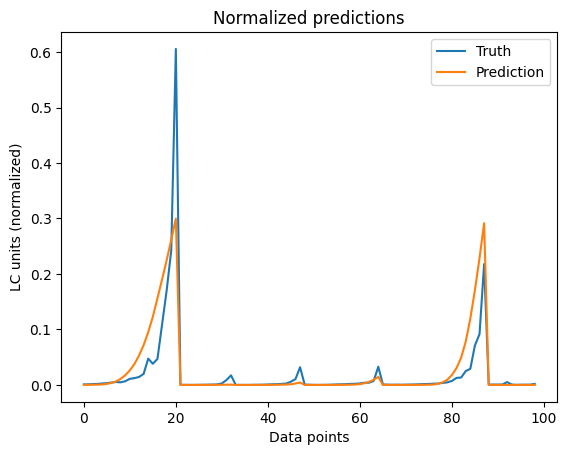

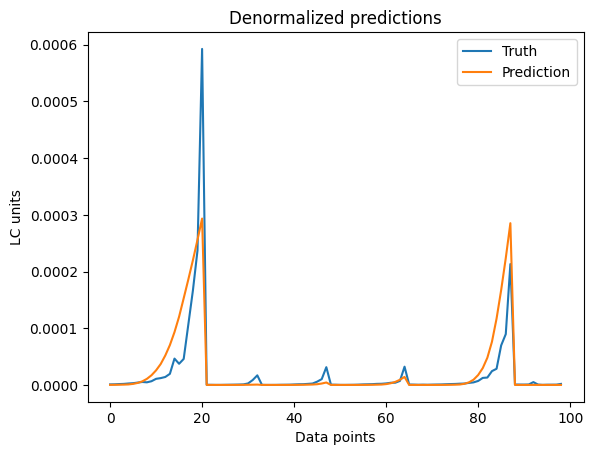

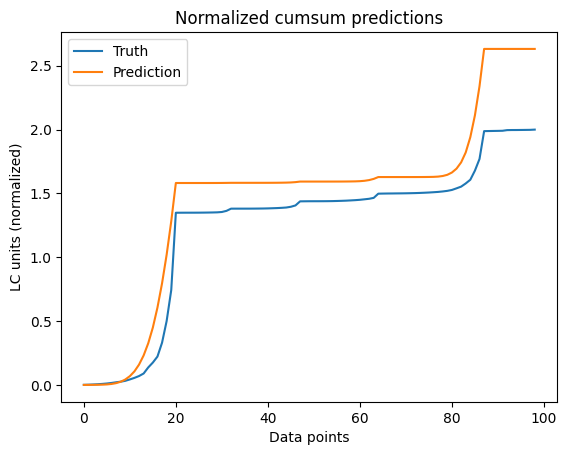

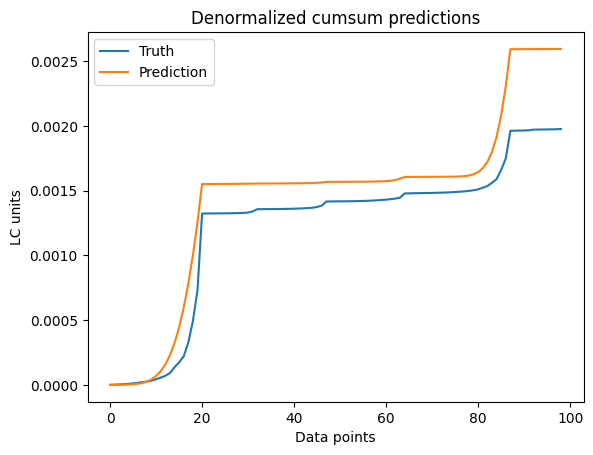

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.001804396, 0.015315886, 0.04247818, inf, 99.507935, 69.93037]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.7248435e-09, 1.4974455e-05, 4.1531235e-05, 99.03764, 79.94211, 44.063766]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.08664374, 0.22988509, 0.2943531, 48.12404, 30.82117, 14.110711]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[8.2823895e-08, 0.0002247605, 0.00028779142, 46.13377, 29.649586, 13.059137]

In [ ]:
result_list.append(['db3-3-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db3-3-2_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 15%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0153 - rmse: 0.0425 - rmspe: inf - mape: 99.5079 - smape: 76.6574  


[0.0018043963937088847,
 0.0018043963937088847,
 0.015315885655581951,
 0.04247818887233734,
 inf,
 99.5079345703125,
 76.65736389160156]

In [ ]:
!cp "/content/db3-3-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-4-1***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB3-4-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'", "TT 59'",
 "TT 62'", "TT 65'", "TT 68'",
 ...
 "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'",
 "TT 46'", "TT 49'", "TT 52'"]
Length: 483, dtype: object
<PandasArray>
[0.39210526315789473,  0.7242105263157894,  1.0563157894736843,
   1.388421052631579,  1.7205263157894737,  2.0526315789473686,
   2.384736842105263,   2.716842105263158,   3.048947368421053,
  3.3810526315789473,
 ...
               0.455,                0.73,  1.0050000000000001,
                1.28,                0.42,  0.6257142857142857,
  0.8314285714285714,  1.0371428571428571,  1.2428571428571429,
  1.4485714285714286]
Length: 483, dtype: float64
<PandasArray>
[489805.52676531556,  391075.1098526033,  318032.5040720478,
 247992.56088549597, 203257.01768735537, 162226.41295180868,
 128887.96226285024, 105055.24677191254,  81096.26052561257,
  67803.50673987065,
 ...
  492446.5839401556,  397016.6477584237,    325361.6

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(481, 3, 3) (481,)
[[0.06666667 0.04588228 0.70822761]
 [0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]] 0.00652591757502593
[[0.1        0.08683237 0.56521659]
 [0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]] 0.008461001377945252
[[0.13333333 0.12778246 0.45941436]
 [0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]] 0.003892739521347456
[[0.16666667 0.16873256 0.3579615 ]
 [0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]] 0.013106366348797319
[[0.2        0.20968265 0.29316205]
 [0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]] 0.016580732978954488
[[0.23333333 0.25063275 0.23372922]
 [0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]] 0.01453319801558204
[[0.26666667 0.29158284 0.18543847]
 [0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]] 0.026544038854726337
[[0.3        0.33253294 0.15091677]
 [0.33333333 0.37348303 0.11621218]
 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

345
345
39
39
97
97


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
11/11 - 2s - loss: 0.1957 - mse: 0.1957 - mae: 0.4372 - rmse: 0.4424 - rmspe: inf - mape: 1297565.8750 - smape: 89.9082 - val_loss: 0.1520 - val_mse: 0.1520 - val_mae: 0.3870 - val_rmse: 0.3899 - val_rmspe: 89826.3750 - val_mape: 38798.2227 - val_smape: 95.2420 - 2s/epoch - 198ms/step
Epoch 2/2000
11/11 - 0s - loss: 0.1019 - mse: 0.1019 - mae: 0.3090 - rmse: 0.3191 - rmspe: inf - mape: 1164331.7500 - smape: 87.3352 - val_loss: 0.0374 - val_mse: 0.0374 - val_mae: 0.1873 - val_rmse: 0.1935 - val_rmspe: 42259.7617 - val_mape: 19065.3125 - val_smape: 91.4867 - 114ms/epoch - 10ms/step
Epoch 3/2000
11/11 - 0s - loss: 0.0224 - mse: 0.0224 - mae: 0.1151 - rmse: 0.1497 - rmspe: inf - mape: 371621.9062 - smape: 76.1935 - val_loss: 0.0023 - val_mse: 0.0023 - val_mae: 0.0381 - val_rmse: 0.0479 - val_rmspe: 6672.6050 - val_mape: 3194.3613 - val_smape: 83.0645 - 87ms/epoch - 8ms/step
Epoch 4/2000
11/11 - 0s - loss: 0.0110 - mse: 0.0110 - mae: 0.0404 - rmse: 0.1050 - rmspe: inf - mape: 1

### Plot training results

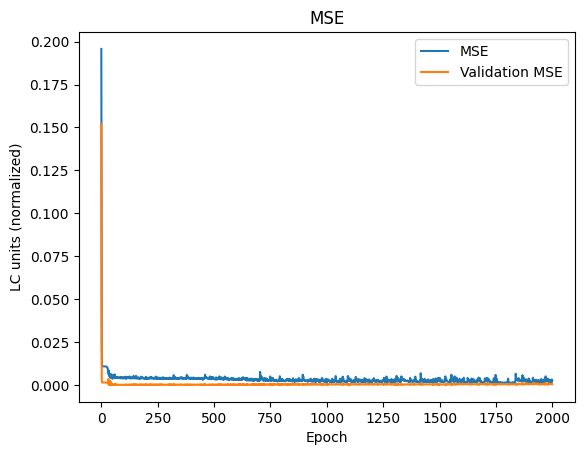

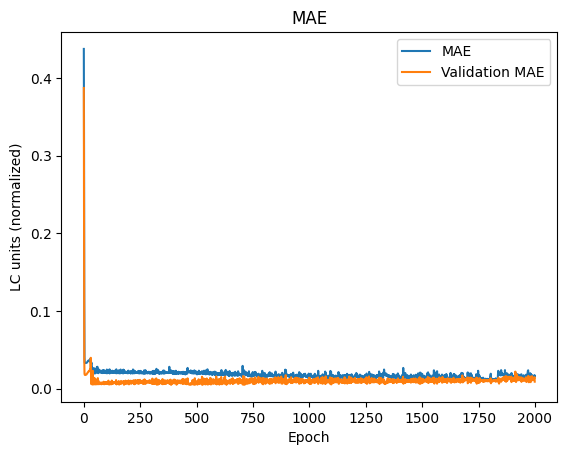

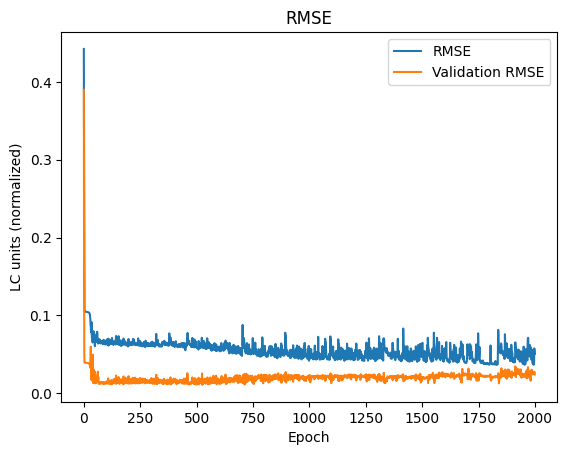

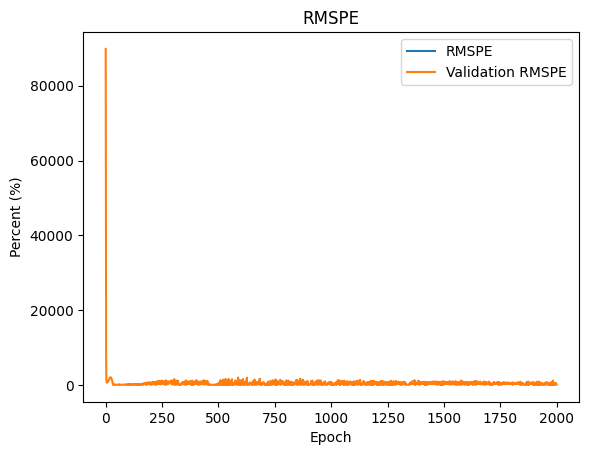

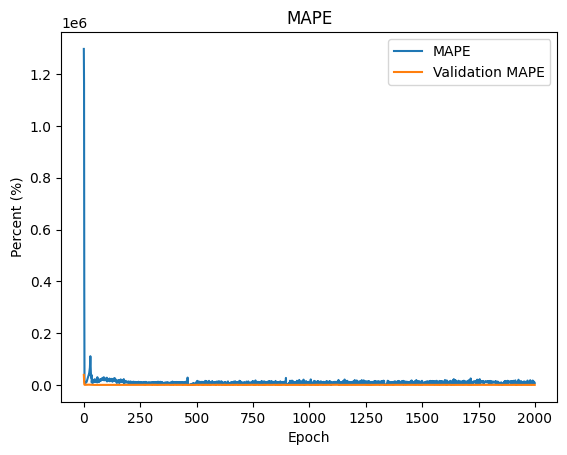

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

[0.0023506125, 0.002805647, 0.0032689124, 0.0038453739, 0.0068571987, 0.014825282, 0.023269009, 0.018730758, 0.026450638, 0.03173714, 0.029205155, 0.0354446, 0.03670032, 0.052021652, 0.10917583, 0.16238767, 0.21212097, 0.2626953, 0.31735682, 0.41562042, 0.52163994, 0.00072007277, 0.00038810272, 0.0008890543, 0.0019763168, 0.0029221824, 0.0037508458, 0.004056663, 0.0042906944, 0.004427518, 0.0040907883, 0.0043944954, 0.004547758, 0.00056559447, 0.00013917149, 0.00030626994, 0.0007491048, 0.0013361908, 0.0017526344, 0.002346819, 0.0027872385, 0.0030502297, 0.0031233605, 0.0039368393, 0.004859942, 0.010559956, 0.02085516, 0.028038697, 0.0030046557, 0.0019461188, 0.0034660231, 0.005172754, 0.006764517, 0.00781601, 0.008044492, 0.007971126, 0.0073765577, 0.0074223704, 0.0079721855, 0.011199999, 0.016152367, 0.019133825, 0.016103374, 0.018385248, 0.0015423144, 0.00078011624, 0.0013876132, 0.002713447, 0.0048464397, 0.008342163, 0.011139989, 0.012864644, 0.013220569, 0.013618895, 0.013436204,

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

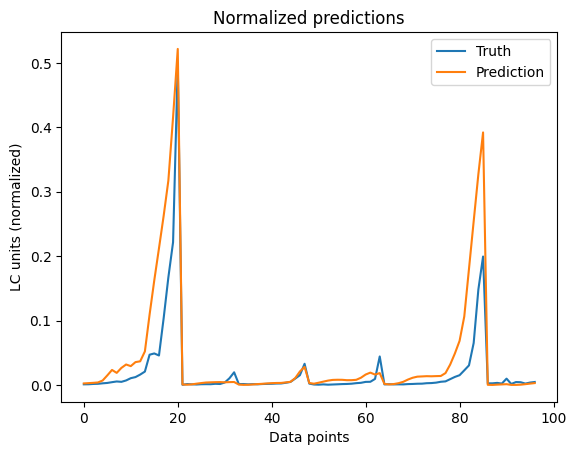

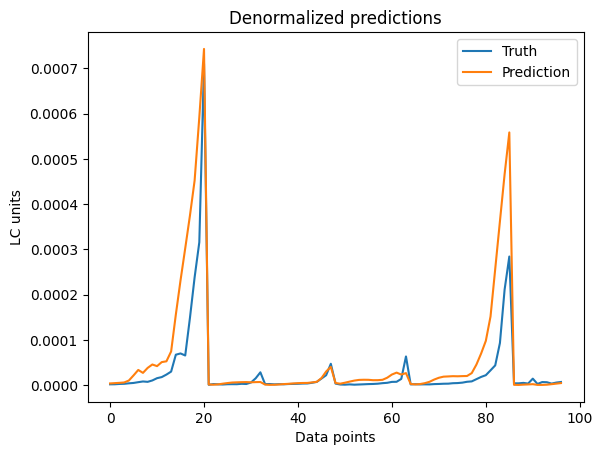

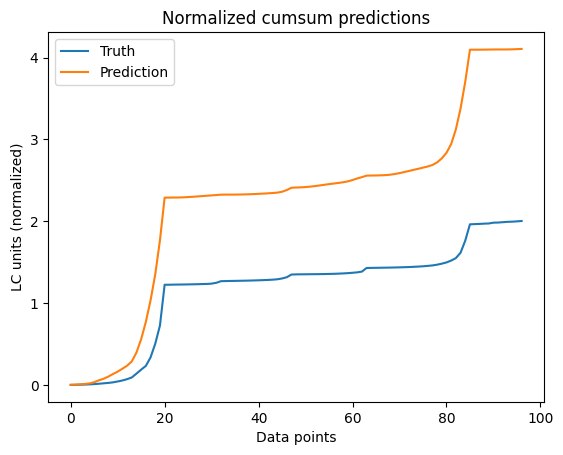

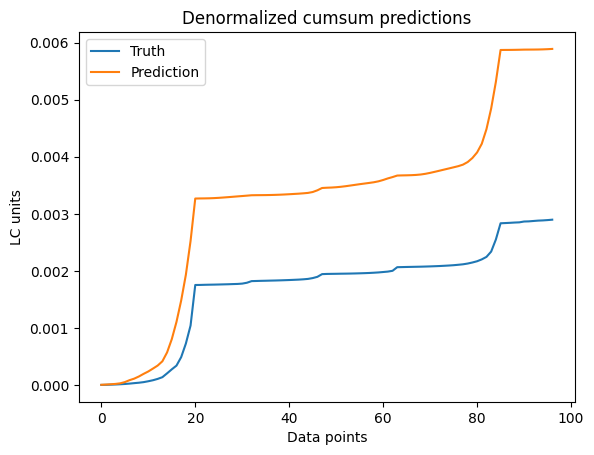

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0028491502, 0.023471793, 0.05337743, 320.28073, 218.28387, 48.588226]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[5.7740697e-09, 3.3414086e-05, 7.59873e-05, 245.35391, 180.89124, 44.12498]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.4744337, 1.0755292, 1.2142626, 126.353264, 112.86581, 34.475674]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[2.9880728e-06, 0.0015311057, 0.0017286043, 118.89632, 107.83639, 33.70494]

In [ ]:
result_list.append(['db3-4-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db3-4-1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 88%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 16%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 6ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0235 - rmse: 0.0534 - rmspe: 242.3909 - mape: 218.2839 - smape: 42.3091


[0.0028491492848843336,
 0.0028491492848843336,
 0.023471787571907043,
 0.0533774234354496,
 242.39089965820312,
 218.28387451171875,
 42.30909729003906]

In [ ]:
!cp "/content/db3-4-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB3-4-2***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB3-4-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(nf)
print(lc)

<PandasArray>
["TT 38'", "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 53'", "TT 56'",
 "TT 59'", "TT 62'", "TT 65'",
 ...
 "TT 41'", "TT 44'", "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'",
 "TT 46'", "TT 49'", "TT 52'"]
Length: 494, dtype: object
<PandasArray>
[               0.06, 0.39210526315789473,  0.7242105263157894,
  1.0563157894736843,   1.388421052631579,  1.7205263157894737,
  2.0526315789473686,   2.384736842105263,   2.716842105263158,
   3.048947368421053,
 ...
               0.455,                0.73,  1.0050000000000001,
                1.28,                0.42,  0.6257142857142857,
  0.8314285714285714,  1.0371428571428571,  1.2428571428571429,
  1.4485714285714286]
Length: 494, dtype: float64
<PandasArray>
[ 614819.2803148942,  498626.1218403846,  399308.7402553158,
  328789.5599392056, 256268.10084279143, 207491.83316470622,
   168344.352026344, 132585.21742959216, 106662.28178087021,
  84175.16058768958,
 ...
  499946.1432168257,  403769.5271707468, 329141.6835

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(492, 3, 3) (492,)
[[0.03333333 0.00615764 0.87806846]
 [0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]] 0.00567363299024241
[[0.06666667 0.0470573  0.71188352]
 [0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]] 0.0021285847277489
[[0.1        0.08795696 0.56983511]
 [0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]] 0.0032706223389370437
[[0.13333333 0.12885662 0.46897525]
 [0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]] 0.00176792728324566
[[0.16666667 0.16975629 0.36525164]
 [0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]] 0.003575947111540261
[[0.2        0.21065595 0.29548952]
 [0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]] 0.005283604410893063
[[0.23333333 0.25155561 0.23949895]
 [0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.15127834]] 0.005439774542066924
[[0.26666667 0.29245528 0.18835454]
 [0.3        0.33335494 0.15127834]
 [

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

353
353
40
40
99
99


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
12/12 - 2s - loss: 0.1842 - mse: 0.1842 - mae: 0.4236 - rmse: 0.4292 - rmspe: 42999.8242 - mape: 27813.1309 - smape: 91.1730 - val_loss: 0.1122 - val_mse: 0.1122 - val_mae: 0.3302 - val_rmse: 0.3350 - val_rmspe: 123820.4297 - val_mape: 60815.6641 - val_smape: 94.4660 - 2s/epoch - 133ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0665 - mse: 0.0665 - mae: 0.2398 - rmse: 0.2580 - rmspe: 23733.7871 - mape: 15780.2461 - smape: 88.5188 - val_loss: 0.0098 - val_mse: 0.0098 - val_mae: 0.0922 - val_rmse: 0.0988 - val_rmspe: 27016.1406 - val_mape: 14548.3623 - val_smape: 88.1584 - 74ms/epoch - 6ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0110 - mse: 0.0110 - mae: 0.0576 - rmse: 0.1048 - rmspe: 4014.1855 - mape: 2673.5073 - smape: 75.7061 - val_loss: 0.0018 - val_mse: 0.0018 - val_mae: 0.0214 - val_rmse: 0.0422 - val_rmspe: 2516.9800 - val_mape: 1453.1420 - val_smape: 77.9768 - 58ms/epoch - 5ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0091 - mse: 0.0091 - mae: 0.0276 - rmse: 0.0954 - rmspe: 

### Plot training results

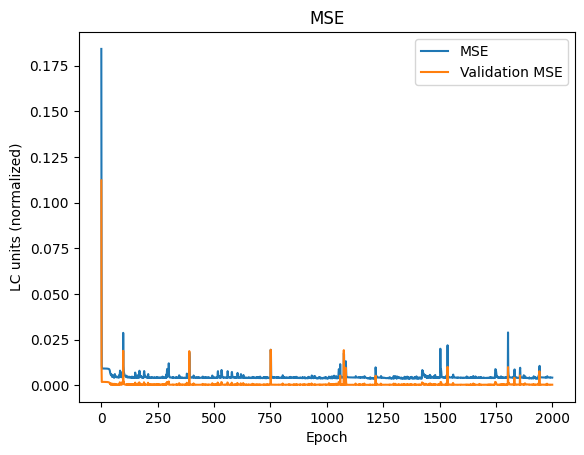

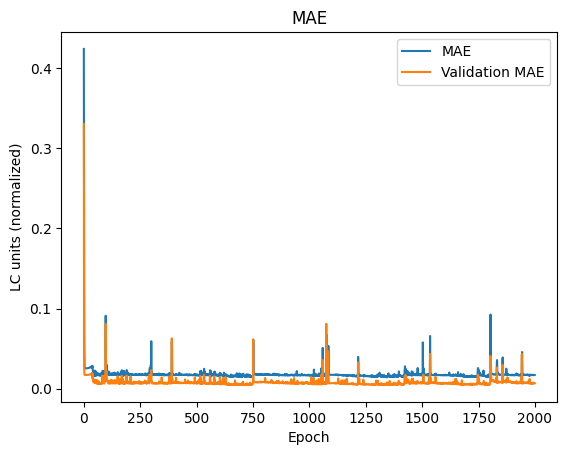

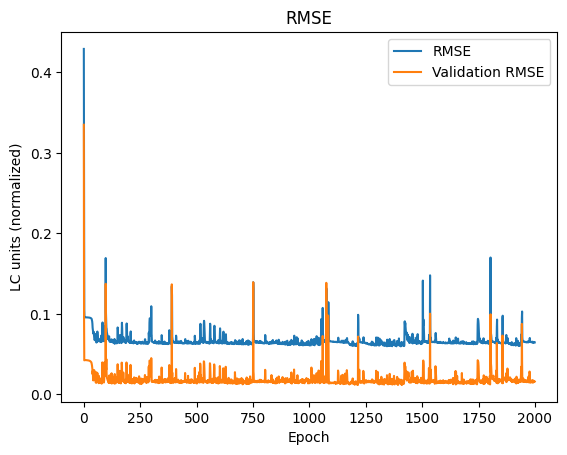

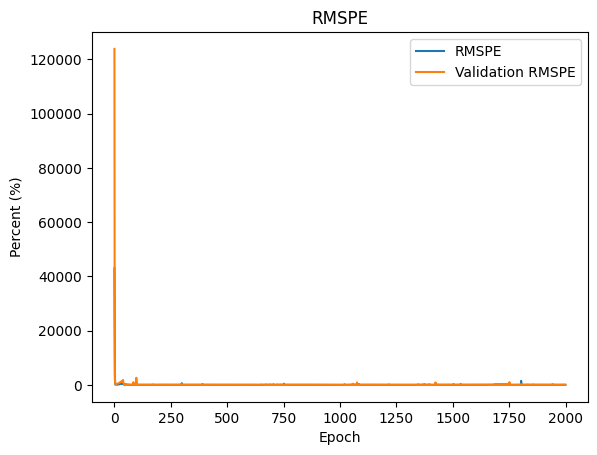

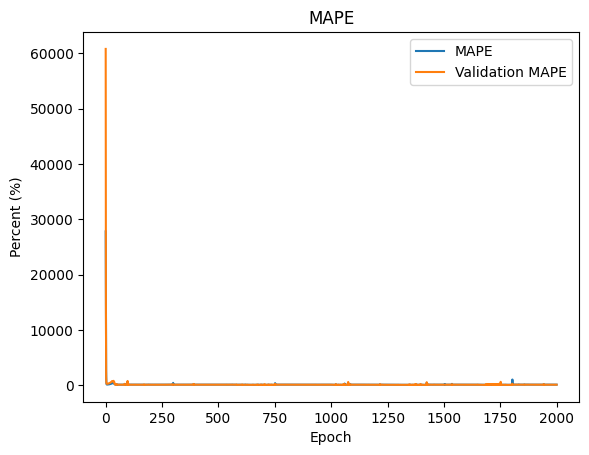

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

[1.0286276e-05, 3.263821e-05, 8.533966e-05, 0.00021804385, 0.000593872, 0.001403725, 0.0029252209, 0.0054914905, 0.009712488, 0.0152620105, 0.02264826, 0.032539804, 0.046811, 0.06616785, 0.09433838, 0.12861277, 0.16907947, 0.21255845, 0.25765473, 0.30266273, 0.3316435, 6.115188e-07, 6.649013e-11, 5.616783e-12, 2.7318547e-10, 6.4563603e-09, 8.2441225e-08, 6.4709536e-07, 3.3752392e-06, 1.3597588e-05, 4.1780535e-05, 0.00010308009, 0.00022363546, 1.7842401e-08, 2.5727786e-11, 6.9349548e-12, 3.3984346e-10, 7.9888745e-09, 1.0395738e-07, 8.044779e-07, 4.137501e-06, 1.608962e-05, 4.8699436e-05, 0.0001193855, 0.0003203236, 0.00082137255, 0.0018509827, 0.0034557034, 2.895395e-08, 2.1769269e-11, 4.924584e-12, 3.712329e-10, 1.0230797e-08, 1.2524428e-07, 9.3731524e-07, 4.655892e-06, 1.8100294e-05, 5.5181656e-05, 0.00015005028, 0.00042812535, 0.0011093774, 0.0024793716, 0.00479339, 0.00841392, 0.0134457955, 4.145137e-08, 2.5656716e-12, 2.8709823e-13, 2.7886634e-11, 1.6106073e-09, 3.839955e-08, 4.153

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

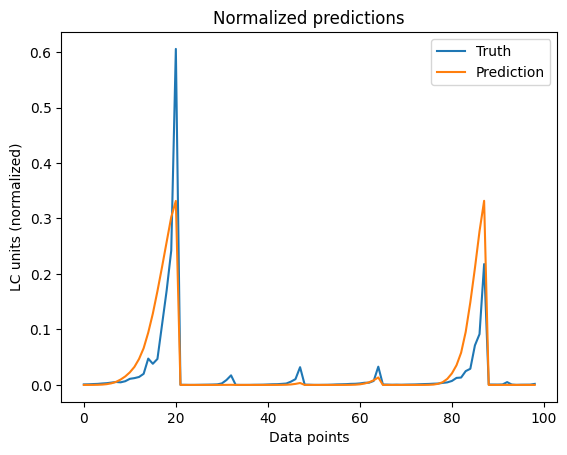

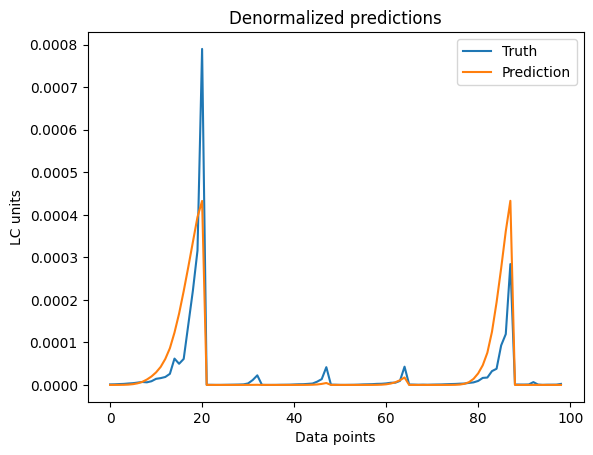

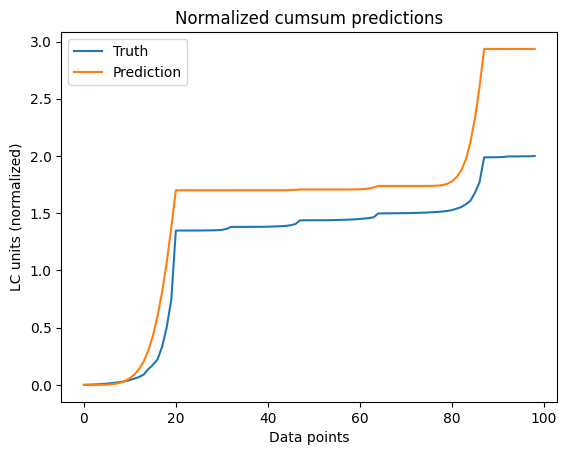

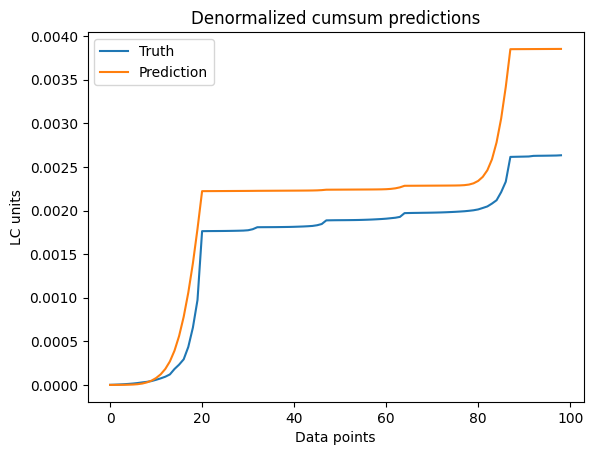

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.0021919205, 0.017944852, 0.04681795, inf, 106.174255, 75.84322]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[3.724948e-09, 2.3393088e-05, 6.103235e-05, 109.414696, 86.56212, 48.3671]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.18828017, 0.34827006, 0.43391263, 50.45222, 38.12506, 18.422882]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[3.199638e-07, 0.00045400875, 0.00056565343, 48.27771, 36.803734, 16.92919]

In [ ]:
result_list.append(['db3-4-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db3-4-2_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 17%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

4/4 [==============================] - 0s 5ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0179 - rmse: 0.0468 - rmspe: inf - mape: 106.1743 - smape: 81.3154 


[0.002191920531913638,
 0.002191920531913638,
 0.017944851890206337,
 0.046817950904369354,
 inf,
 106.17425537109375,
 81.31541442871094]

In [ ]:
!cp "/content/db3-4-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB4-1***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB4-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Nf1"]).array
lc = pd.Series(sheet.loc[:,"LC1"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

<PandasArray>
["TT 60'", "TT 64'", "TT 68'", "TT 72'", "TT 76'", "TT 80'", "TT 84'",
 "TT 88'", "TT 92'", "TT 77'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 387, dtype: object
<PandasArray>
[       0.512454165, 0.9798533879999999, 1.4472526109999997,
 1.9146518339999996,        2.382051057, 2.8494502799999997,
 3.3168495029999994, 3.7842487259999995,        4.251647949,
 0.3485085807619048,
 ...
 1.0050000000000001,               1.28,               0.42,
 0.6257142857142857, 0.8314285714285714, 1.0371428571428571,
 1.2428571428571429, 1.4485714285714286, 1.6542857142857144,
               1.86]
Length: 387, dtype: float64
<PandasArray>
[171.53167382222222, 201.79644094444444, 232.06120806666667,
  262.3259751888889,  292.5907423111111, 322.85550943333334,
 353.12027655555556,  383.3850436777778,        413.6498108,
 155.65745184761903,
 ...
        404.7677612,        404.7677612,        404.7677612,
        404

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(385, 3, 4) (385,)
[[1.93798450e-01 6.07218453e-02 8.95344854e-02 2.40979989e-07]
 [2.24806202e-01 1.18354302e-01 1.98946648e-01 9.58526855e-08]
 [2.55813953e-01 1.75986758e-01 3.08358810e-01 8.49012692e-08]] 0.04153564915315768
[[2.24806202e-01 1.18354302e-01 1.98946648e-01 9.58526855e-08]
 [2.55813953e-01 1.75986758e-01 3.08358810e-01 8.49012692e-08]
 [2.86821705e-01 2.33619215e-01 4.17770973e-01 5.23982049e-08]] 0.04381408976887264
[[2.55813953e-01 1.75986758e-01 3.08358810e-01 8.49012692e-08]
 [2.86821705e-01 2.33619215e-01 4.17770973e-01 5.23982049e-08]
 [3.17829457e-01 2.91251672e-01 5.27183135e-01 3.70466841e-08]] 0.058212253934209666
[[2.86821705e-01 2.33619215e-01 4.17770973e-01 5.23982049e-08]
 [3.17829457e-01 2.91251672e-01 5.27183135e-01 3.70466841e-08]
 [3.48837209e-01 3.48884128e-01 6.36595298e-01 2.49627364e-08]] 0.07852437297590881
[[3.17829457e-01 2.91251672e-01 5.27183135e-01 3.70466841e-08]
 [3.48837209e-01 3.48884128e-01 6.36595298e-01 2.49627364e-08]
 [3.79844961e-

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

277
277
31
31
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
9/9 - 2s - loss: 0.1378 - mse: 0.1378 - mae: 0.3488 - rmse: 0.3712 - rmspe: inf - mape: 1529814.7500 - smape: 63.0608 - val_loss: 0.1081 - val_mse: 0.1081 - val_mae: 0.3077 - val_rmse: 0.3287 - val_rmspe: 41207236.0000 - val_mape: 7494363.5000 - val_smape: 65.6904 - 2s/epoch - 196ms/step
Epoch 2/2000
9/9 - 0s - loss: 0.0894 - mse: 0.0894 - mae: 0.2733 - rmse: 0.2990 - rmspe: inf - mape: 802089.5000 - smape: 58.9293 - val_loss: 0.0380 - val_mse: 0.0380 - val_mae: 0.1664 - val_rmse: 0.1950 - val_rmspe: 20904398.0000 - val_mape: 3806035.7500 - val_smape: 56.0149 - 54ms/epoch - 6ms/step
Epoch 3/2000
9/9 - 0s - loss: 0.0585 - mse: 0.0585 - mae: 0.1873 - rmse: 0.2418 - rmspe: inf - mape: 376718.8125 - smape: 56.6225 - val_loss: 0.0175 - val_mse: 0.0175 - val_mae: 0.1108 - val_rmse: 0.1322 - val_rmspe: 5397404.5000 - val_mape: 985503.3750 - val_smape: 61.8718 - 51ms/epoch - 6ms/step
Epoch 4/2000
9/9 - 0s - loss: 0.0557 - mse: 0.0557 - mae: 0.1566 - rmse: 0.2360 - rmspe: inf - map

### Plot training results

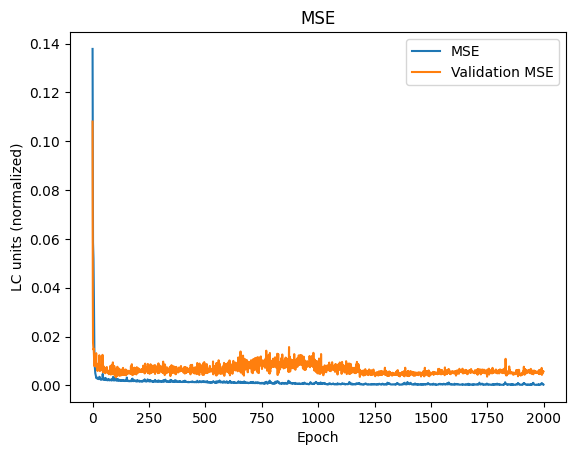

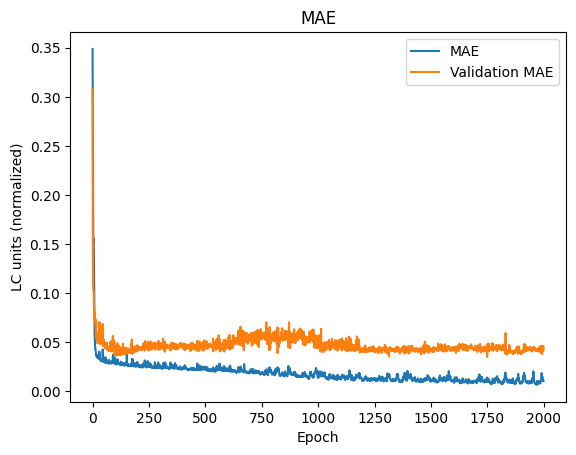

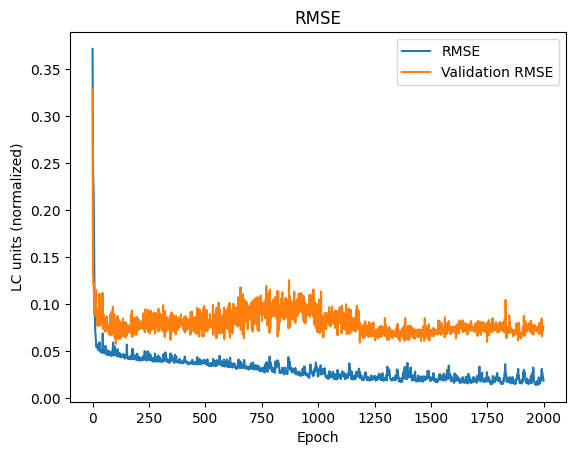

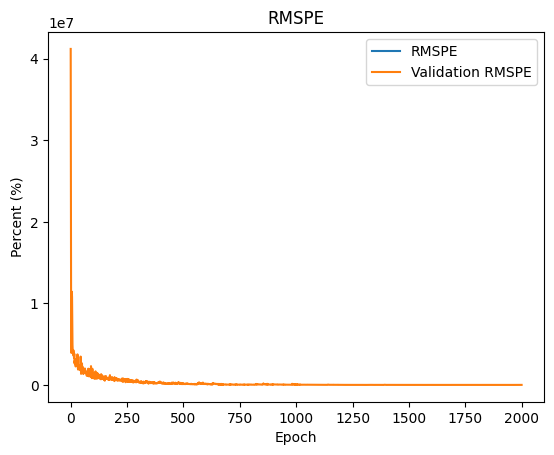

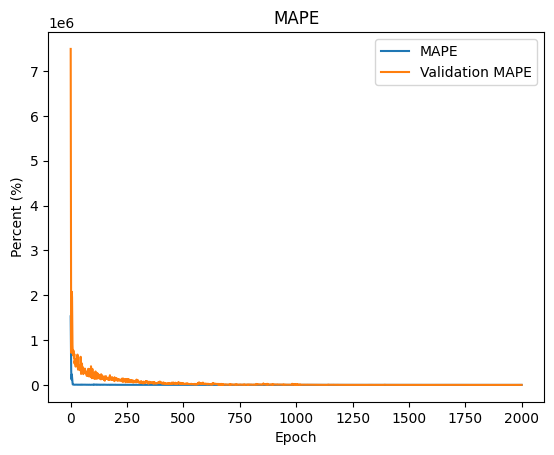

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

[3.1382874e-06, 0.00010819823, 0.00020580832, 0.0004023605, 0.0007619649, 0.0021320507, 0.0040626354, 0.005591051, 0.009269424, 0.009031125, 0.011272354, 0.0039772457, 4.0337916e-05, 8.072518e-05, 0.00014121663, 0.00026128572, 0.00694319, 0.0021274267, 0.008402363, 0.0071888277, 0.008444273, 0.01465282, 0.021183006, 0.02569285, 0.030449335, 0.0388556, 0.0012545516, 0.000116587464, 0.00038795994, 0.00078279775, 0.0014902324, 0.0014149615, 0.0012888318, 0.006405205, 0.013437822, 0.007715215, 0.0152694145, 0.023373883, 0.06735085, 0.05655555, 0.0456513, 0.034313977, 7.086772e-05, 2.3716839e-05, 0.00020732764, 0.00055093423, 0.0013425696, 0.001433752, 0.000692845, 0.003630725, 0.0068165325, 0.01211526, 0.026451299, 0.06485352, 0.09978622, 0.12002655, 0.051948346, 0.07538199, 0.2077979, 0.043301526, 0.08090249, 0.11012247, 0.14413473, 0.19991976, 0.00012434661, 1.2921124e-06, 9.085272e-05, 0.00016995569, 0.0003261359, 4.5831996e-05, 3.7241785e-05, 7.8556535e-05, 0.0001437263, 0.00026952178,

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

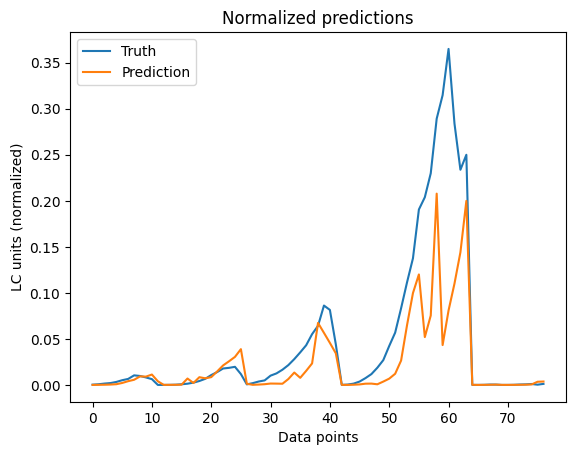

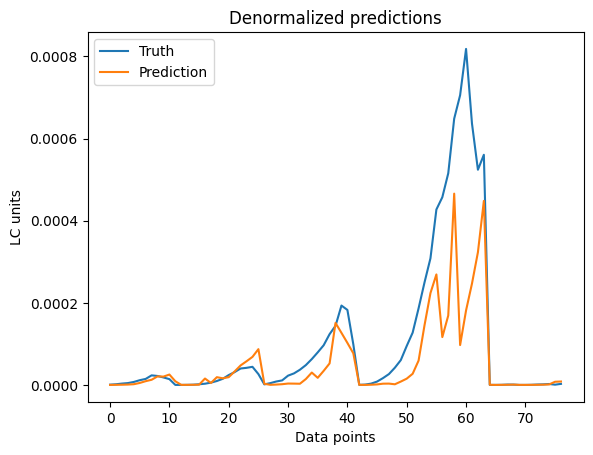

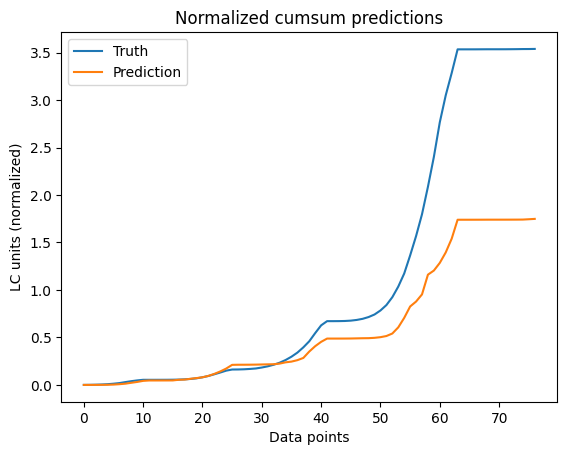

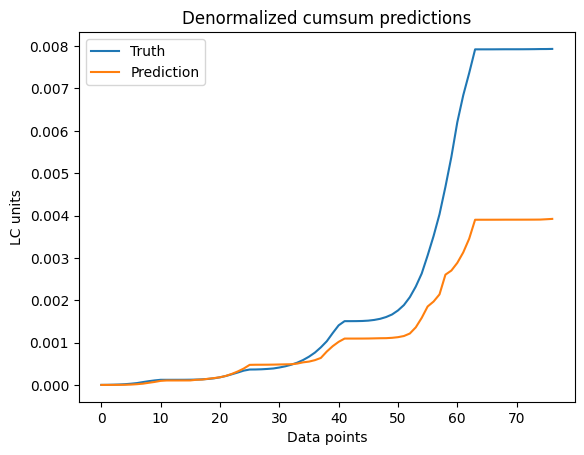

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.003527178, 0.025299314, 0.05939005, 552312.56, 51875.89, 46.95836]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.7726926e-08, 5.6716806e-05, 0.0001331425, 546284.56, 199.17938, 46.958122]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.75337505, 0.5069791, 0.8679718, 41.648727, 35.247932, 23.61767]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[3.7863217e-06, 0.0011365621, 0.0019458473, 41.64871, 35.247925, 23.617655]

In [ ]:
result_list.append(['db4-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db4-1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 13%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

3/3 [==============================] - 0s 7ms/step - loss: 0.0035 - mse: 0.0035 - mae: 0.0253 - rmse: 0.0594 - rmspe: 286454.0938 - mape: 51875.9492 - smape: 47.7537     


[0.003527177730575204,
 0.003527177730575204,
 0.02529931627213955,
 0.05939004570245743,
 286454.09375,
 51875.94921875,
 47.7536506652832]

In [ ]:
!cp "/content/db4-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB4-2***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB4-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Nf2"]).array
lc = pd.Series(sheet.loc[:,"LC2"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

<PandasArray>
["TT 60'", "TT 64'", "TT 68'", "TT 72'", "TT 76'", "TT 80'", "TT 84'",
 "TT 88'", "TT 92'", "TT 77'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 387, dtype: object
<PandasArray>
[       0.512454165, 0.9798533879999999, 1.4472526109999997,
 1.9146518339999996,        2.382051057, 2.8494502799999997,
 3.3168495029999994, 3.7842487259999995,        4.251647949,
 0.3485085807619048,
 ...
 1.0050000000000001,               1.28,               0.42,
 0.6257142857142857, 0.8314285714285714, 1.0371428571428571,
 1.2428571428571429, 1.4485714285714286, 1.6542857142857144,
               1.86]
Length: 387, dtype: float64
<PandasArray>
[171.53167382222222, 201.79644094444444, 232.06120806666667,
  262.3259751888889,  292.5907423111111, 322.85550943333334,
 353.12027655555556,  383.3850436777778,        413.6498108,
 155.65745184761903,
 ...
        404.7677612,        404.7677612,        404.7677612,
        404

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(385, 3, 4) (385,)
[[1.93798450e-01 6.07218453e-02 8.95344854e-02 1.80983945e-07]
 [2.24806202e-01 1.18354302e-01 1.98946648e-01 9.30535078e-08]
 [2.55813953e-01 1.75986758e-01 3.08358810e-01 5.83817404e-08]] 0.04340612747162953
[[2.24806202e-01 1.18354302e-01 1.98946648e-01 9.30535078e-08]
 [2.55813953e-01 1.75986758e-01 3.08358810e-01 5.83817404e-08]
 [2.86821705e-01 2.33619215e-01 4.17770973e-01 3.96731775e-08]] 0.06093671039519228
[[2.55813953e-01 1.75986758e-01 3.08358810e-01 5.83817404e-08]
 [2.86821705e-01 2.33619215e-01 4.17770973e-01 3.96731775e-08]
 [3.17829457e-01 2.91251672e-01 5.27183135e-01 2.82442928e-08]] 0.08089543251390237
[[2.86821705e-01 2.33619215e-01 4.17770973e-01 3.96731775e-08]
 [3.17829457e-01 2.91251672e-01 5.27183135e-01 2.82442928e-08]
 [3.48837209e-01 3.48884128e-01 6.36595298e-01 1.71350139e-08]] 0.08477131952683033
[[3.17829457e-01 2.91251672e-01 5.27183135e-01 2.82442928e-08]
 [3.48837209e-01 3.48884128e-01 6.36595298e-01 1.71350139e-08]
 [3.79844961e-0

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

277
277
31
31
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
9/9 - 2s - loss: 0.1204 - mse: 0.1204 - mae: 0.3203 - rmse: 0.3470 - rmspe: inf - mape: 1768091.3750 - smape: 56.0557 - val_loss: 0.0987 - val_mse: 0.0987 - val_mae: 0.2843 - val_rmse: 0.3142 - val_rmspe: 24419344.0000 - val_mape: 4453682.0000 - val_smape: 62.6565 - 2s/epoch - 206ms/step
Epoch 2/2000
9/9 - 0s - loss: 0.0791 - mse: 0.0791 - mae: 0.2489 - rmse: 0.2812 - rmspe: inf - mape: 1079563.1250 - smape: 52.2112 - val_loss: 0.0383 - val_mse: 0.0383 - val_mae: 0.1716 - val_rmse: 0.1957 - val_rmspe: 12956597.0000 - val_mape: 2368262.0000 - val_smape: 56.7518 - 55ms/epoch - 6ms/step
Epoch 3/2000
9/9 - 0s - loss: 0.0614 - mse: 0.0614 - mae: 0.1917 - rmse: 0.2477 - rmspe: inf - mape: 511188.8438 - smape: 51.6573 - val_loss: 0.0215 - val_mse: 0.0215 - val_mae: 0.1287 - val_rmse: 0.1467 - val_rmspe: 5616483.0000 - val_mape: 1029140.5000 - val_smape: 60.4756 - 66ms/epoch - 7ms/step
Epoch 4/2000
9/9 - 0s - loss: 0.0587 - mse: 0.0587 - mae: 0.1735 - rmse: 0.2422 - rmspe: inf - m

### Plot training results

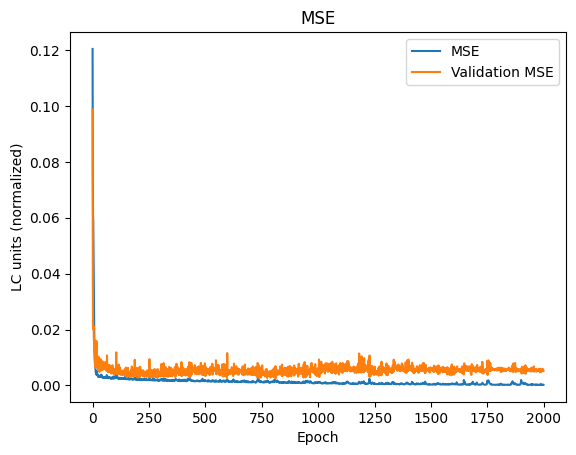

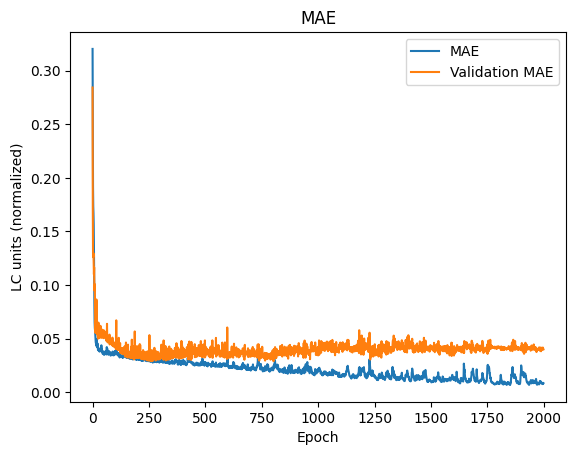

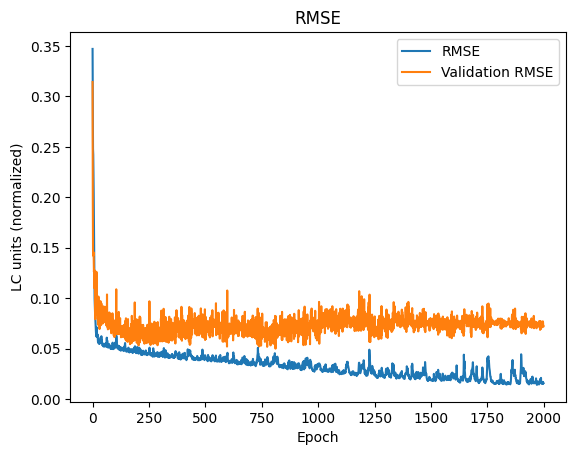

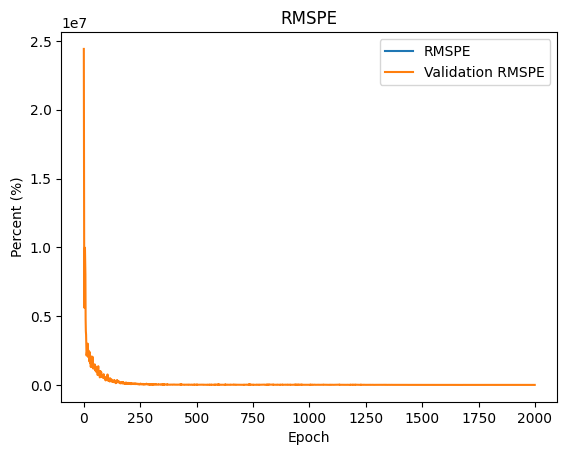

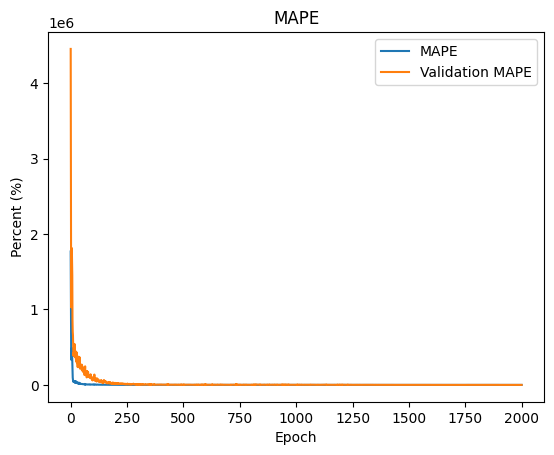

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

[5.693843e-06, 0.0005336445, 0.000931936, 0.0016189635, 0.002695762, 0.0047421986, 0.006703536, 0.007734609, 0.00837972, 0.009458436, 0.011020034, 3.3539683e-05, 1.7572453e-05, 0.000473862, 0.0008647145, 0.001551867, 0.0010361385, 0.0012967718, 0.009217136, 0.012432072, 0.011611953, 0.012282302, 0.014017169, 0.016236609, 0.024880454, 0.025751771, 7.2816554e-05, 1.6311631e-05, 0.0010218254, 0.0017668196, 0.0030273169, 0.012785565, 0.01142397, 0.010460518, 0.0135833, 0.01697416, 0.022463126, 0.038174603, 0.057600457, 0.059008036, 0.024273686, 0.017705373, 1.2307526e-05, 2.769678e-06, 0.0008439738, 0.001579233, 0.0027819418, 0.012722163, 0.011450312, 0.009229786, 0.012963966, 0.013468815, 0.030080974, 0.064815044, 0.1211163, 0.17649417, 0.09125203, 0.10665804, 0.14480722, 0.061470613, 0.037964016, 0.058260243, 0.12861754, 0.22695561, 0.0007250012, 1.1929329e-06, 0.00052436715, 0.0009556991, 0.0017551098, 0.0008102391, 0.00056100293, 0.0004944965, 0.00082576287, 0.0014700664, 0.0025673246,

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

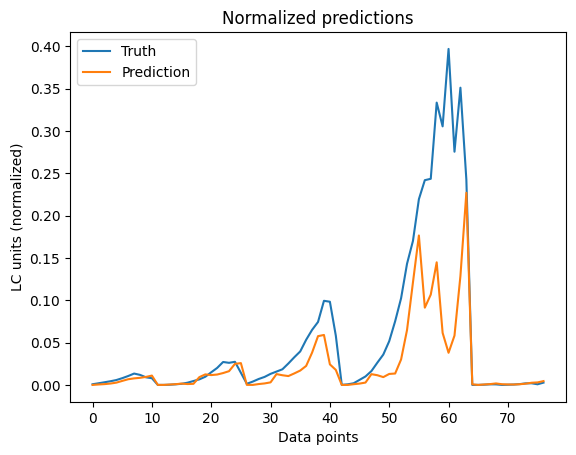

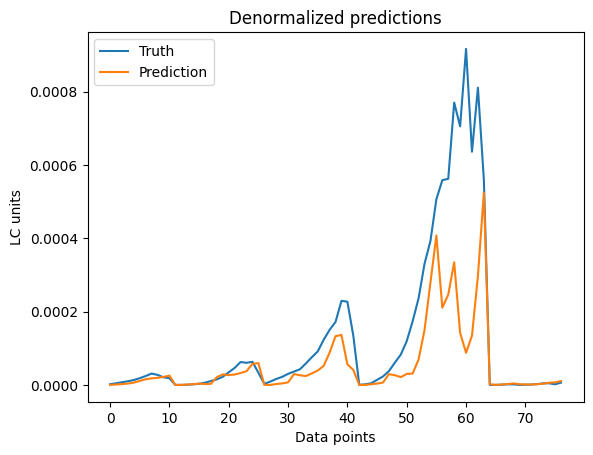

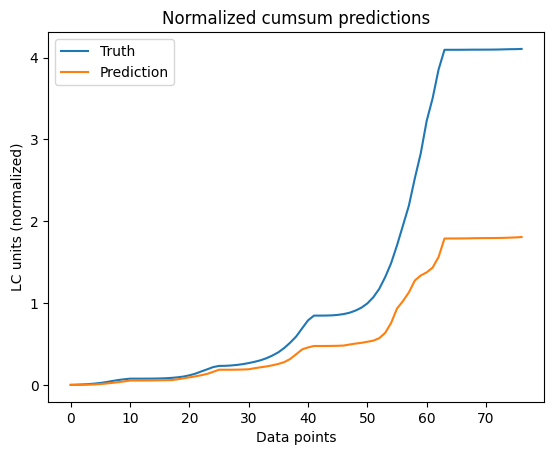

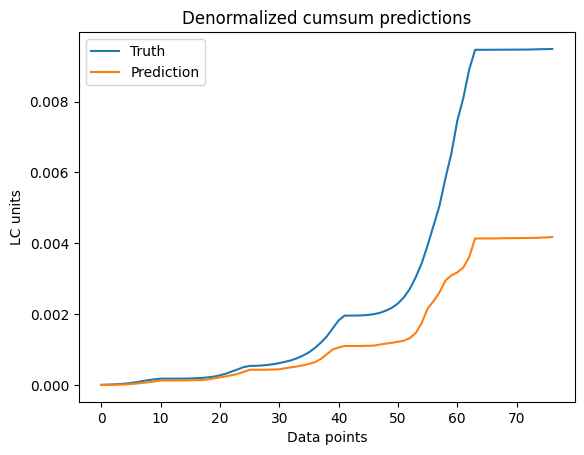

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0051523545, 0.030620215, 0.07177991, 3658.6265, 672.9781, 42.07398]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[2.7508051e-08, 7.075145e-05, 0.00016585551, 3645.484, 105.19533, 42.07346]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.2627692, 0.6893357, 1.1237301, 46.37292, 43.850132, 29.414022]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[6.7418364e-06, 0.0015927876, 0.0025965048, 46.3729, 43.850124, 29.414007]

In [ ]:
result_list.append(['db4-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db4-2_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 15%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

3/3 [==============================] - 0s 6ms/step - loss: 0.0052 - mse: 0.0052 - mae: 0.0306 - rmse: 0.0718 - rmspe: 3529.3313 - mape: 672.9780 - smape: 42.1606    


[0.005152354948222637,
 0.005152354948222637,
 0.030620219185948372,
 0.07177990674972534,
 3529.331298828125,
 672.9779663085938,
 42.16055679321289]

In [ ]:
!cp "/content/db4-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-1-1***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-1-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

<PandasArray>
["TT 60'", "TT 64'", "TT 68'", "TT 72'", "TT 76'", "TT 80'", "TT 84'",
 "TT 88'", "TT 92'", "TT 69'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 388, dtype: object
<PandasArray>
[       0.512454165, 0.9798533879999999, 1.4472526109999997,
 1.9146518339999996,        2.382051057, 2.8494502799999997,
 3.3168495029999994, 3.7842487259999995,        4.251647949,
 0.3485085807619048,
 ...
 1.0050000000000001,               1.28,               0.42,
 0.6257142857142857, 0.8314285714285714, 1.0371428571428571,
 1.2428571428571429, 1.4485714285714286, 1.6542857142857144,
               1.86]
Length: 388, dtype: float64
<PandasArray>
[171.53167382222222, 201.79644094444444, 232.06120806666667,
  262.3259751888889,  292.5907423111111, 322.85550943333334,
 353.12027655555556,  383.3850436777778,        413.6498108,
 155.65745184761903,
 ...
        404.7677612,        404.7677612,        404.7677612,
        404

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

(386, 3, 4) (386,)
[[0.19379845 0.06072185 0.08953449 0.45416966]
 [0.2248062  0.1183543  0.19894665 0.34488188]
 [0.25581395 0.17598676 0.30835881 0.25872145]] 0.003259521600149639
[[0.2248062  0.1183543  0.19894665 0.34488188]
 [0.25581395 0.17598676 0.30835881 0.25872145]
 [0.28682171 0.23361922 0.41777097 0.18752046]] 0.005395704452045319
[[0.25581395 0.17598676 0.30835881 0.25872145]
 [0.28682171 0.23361922 0.41777097 0.18752046]
 [0.31782946 0.29125167 0.52718314 0.1360916 ]] 0.007451896391223001
[[0.28682171 0.23361922 0.41777097 0.18752046]
 [0.31782946 0.29125167 0.52718314 0.1360916 ]
 [0.34883721 0.34888413 0.6365953  0.11075103]] 0.01066412756752603
[[0.31782946 0.29125167 0.52718314 0.1360916 ]
 [0.34883721 0.34888413 0.6365953  0.11075103]
 [0.37984496 0.40651658 0.74600746 0.07486231]] 0.01328431195205059
[[0.34883721 0.34888413 0.6365953  0.11075103]
 [0.37984496 0.40651658 0.74600746 0.07486231]
 [0.41085271 0.46414904 0.85541962 0.05469751]] 0.01856247543701312
[[0.37

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

277
277
31
31
78
78


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

Epoch 1/2000
9/9 - 1s - loss: 0.2170 - mse: 0.2170 - mae: 0.4606 - rmse: 0.4659 - rmspe: inf - mape: 1731233.3750 - smape: 88.7746 - val_loss: 0.1822 - val_mse: 0.1822 - val_mae: 0.4192 - val_rmse: 0.4268 - val_rmspe: 52705.3164 - val_mape: 32944.6406 - val_smape: 88.0970 - 1s/epoch - 166ms/step
Epoch 2/2000
9/9 - 0s - loss: 0.1504 - mse: 0.1504 - mae: 0.3790 - rmse: 0.3878 - rmspe: inf - mape: 1471630.5000 - smape: 86.6348 - val_loss: 0.0905 - val_mse: 0.0905 - val_mae: 0.2916 - val_rmse: 0.3008 - val_rmspe: 36162.2422 - val_mape: 23240.0156 - val_smape: 84.8603 - 57ms/epoch - 6ms/step
Epoch 3/2000
9/9 - 0s - loss: 0.0576 - mse: 0.0576 - mae: 0.2166 - rmse: 0.2399 - rmspe: inf - mape: 305659.8750 - smape: 81.0822 - val_loss: 0.0152 - val_mse: 0.0152 - val_mae: 0.1043 - val_rmse: 0.1231 - val_rmspe: 11493.5674 - val_mape: 7578.6992 - val_smape: 77.2395 - 68ms/epoch - 8ms/step
Epoch 4/2000
9/9 - 0s - loss: 0.0172 - mse: 0.0172 - mae: 0.0781 - rmse: 0.1312 - rmspe: inf - mape: 64266.3320

### Plot training results

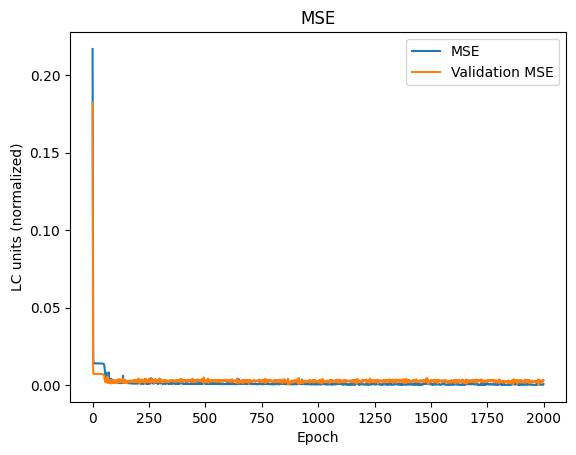

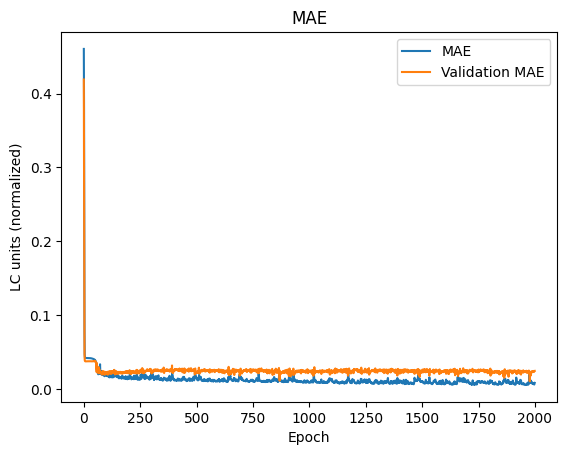

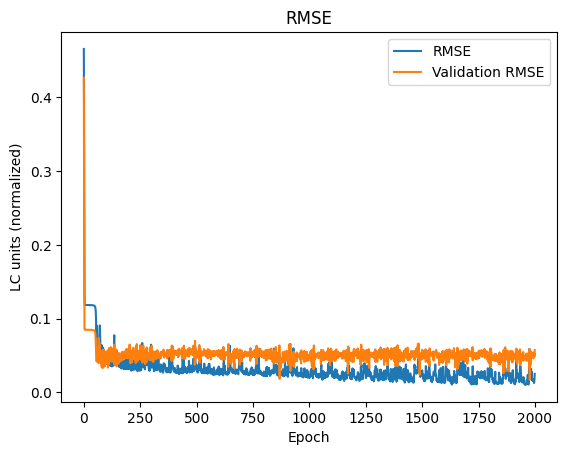

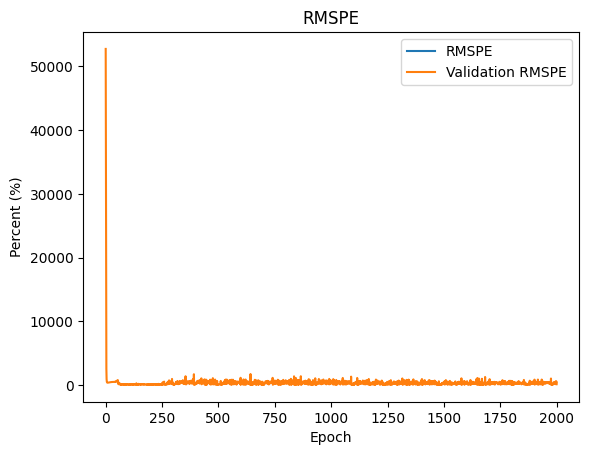

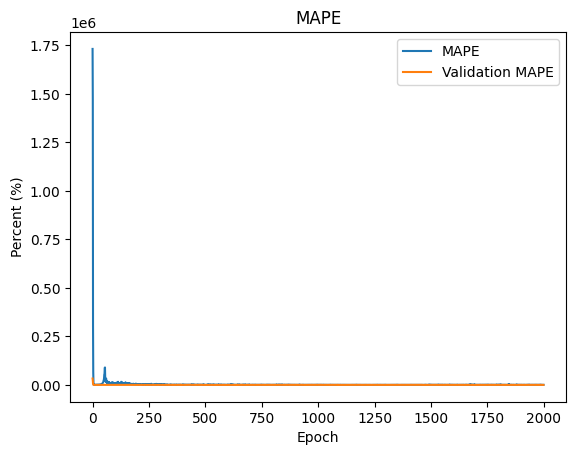

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

[0.0007841517, 0.00046334983, 0.00080423575, 0.0016870124, 0.0025073385, 0.0031611447, 0.007865658, 0.0046654795, 0.0028349834, 0.003065149, 0.0031939615, 0.0033271776, 0.00044111095, 0.00090899493, 0.0005297432, 0.0012188816, 0.0022128355, 0.002538001, 0.0017107315, 0.0028352689, 0.0028810643, 0.003377943, 0.003625678, 0.005344622, 0.0065500606, 0.009004986, 0.013751203, 0.0027080537, 0.0033361267, 0.0018079095, 0.0027589942, 0.0035683447, 0.012351204, 0.0051511736, 0.0015997003, 0.001715537, 0.0017133706, 0.0019162601, 0.00213501, 0.0030676515, 0.0062357434, 0.016761536, 0.03187598, 0.0021298402, 0.0015970743, 0.0010020593, 0.0020811863, 0.0031334308, 0.008957566, 0.0048462073, 0.0010369301, 0.00095619826, 0.0012716115, 0.001510917, 0.0017826732, 0.0021724375, 0.0023206365, 0.006642478, 0.024231432, 0.008559646, 0.05437716, 0.063786544, 0.044302225, 0.046336148, 0.0682026, 0.00033100144, 0.00034205287, 0.0004594686, 0.0012786613, 0.0022558803, 0.0020000318, 0.0020442652, 0.0006926209

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

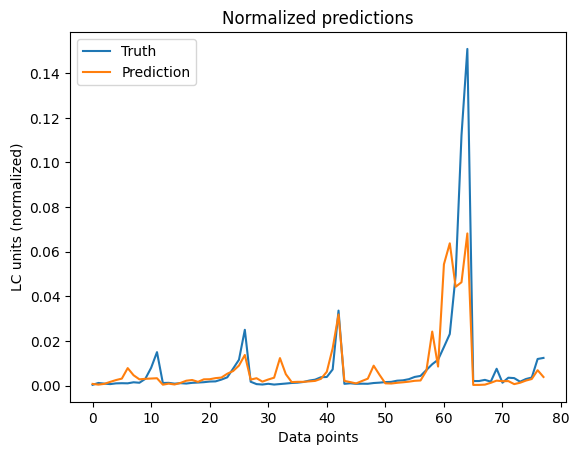

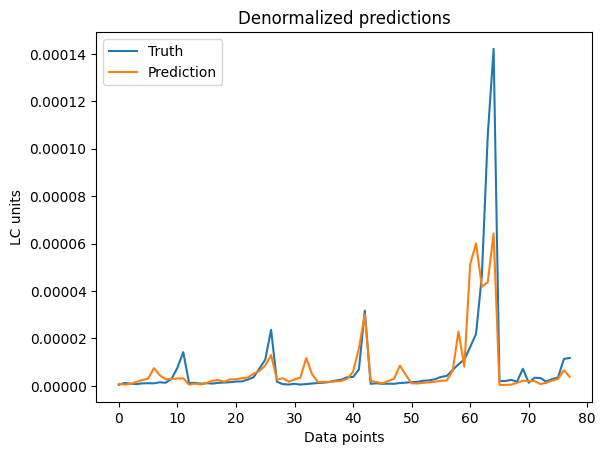

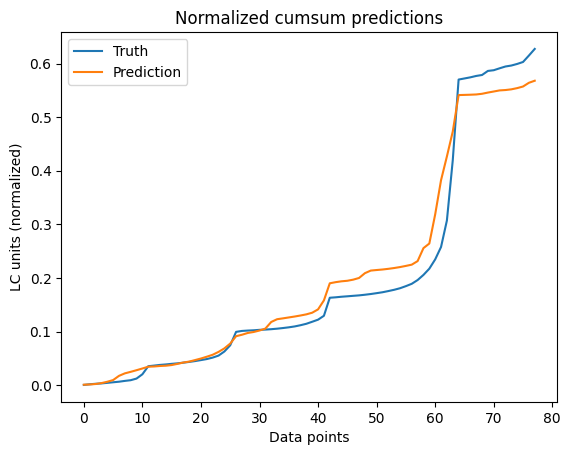

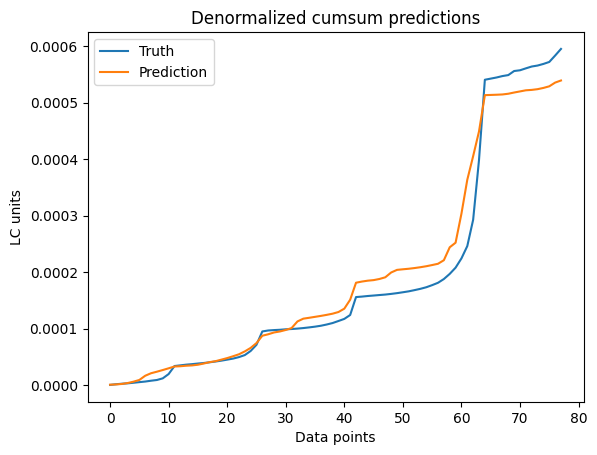

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.00019656228, 0.0052200165, 0.014020067, 250.75371, 124.46967, 33.69013]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.7431953e-10, 4.915807e-06, 1.3203012e-05, 233.69891, 117.80907, 32.81285]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.0012164883, 0.02507286, 0.03487819, 43.572414, 24.042187, 9.218572]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.0788309e-09, 2.3611658e-05, 3.284556e-05, 41.11613, 23.04916, 8.967213]

In [ ]:
result_list.append(['db5-1-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-1-1_cnn.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 87%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 16%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/assets/ (stored 0%)


In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

3/3 [==============================] - 0s 7ms/step - loss: 1.9656e-04 - mse: 1.9656e-04 - mae: 0.0052 - rmse: 0.0140 - rmspe: 197.8976 - mape: 124.4697 - smape: 34.7865


[0.00019656225049402565,
 0.00019656226504594088,
 0.005220017861574888,
 0.01402006670832634,
 197.89756774902344,
 124.4697265625,
 34.78654479980469]

In [ ]:
!cp "/content/db5-1-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-1-2***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-1-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

<PandasArray>
["TT 60'", "TT 64'", "TT 68'", "TT 72'", "TT 76'", "TT 80'", "TT 84'",
 "TT 88'", "TT 92'", "TT 69'",
 ...
 "TT 47'", "TT 50'", "TT 38'", "TT 40'", "TT 43'", "TT 46'", "TT 49'",
 "TT 52'", "TT 54'", "TT 57'"]
Length: 388, dtype: object
<PandasArray>
[       0.512454165, 0.9798533879999999, 1.4472526109999997,
 1.9146518339999996,        2.382051057, 2.8494502799999997,
 3.3168495029999994, 3.7842487259999995,        4.251647949,
 0.3485085807619048,
 ...
 1.0050000000000001,               1.28,               0.42,
 0.6257142857142857, 0.8314285714285714, 1.0371428571428571,
 1.2428571428571429, 1.4485714285714286, 1.6542857142857144,
               1.86]
Length: 388, dtype: float64
<PandasArray>
[171.53167382222222, 201.79644094444444, 232.06120806666667,
  262.3259751888889,  292.5907423111111, 322.85550943333334,
 353.12027655555556,  383.3850436777778,        413.6498108,
 155.65745184761903,
 ...
        404.7677612,        404.7677612,        404.7677612,
        404

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

### Plot training results

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db5-1-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-1-2_cnn.zip" "/content/model"

In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

In [ ]:
!cp "/content/db5-1-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-2-1***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-2-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

### Plot training results

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db5-2-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-2-1_cnn.zip" "/content/model"

In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

In [ ]:
!cp "/content/db5-2-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-2-2***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-2-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

### Plot training results

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db5-2-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-2-2_cnn.zip" "/content/model"

In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

In [ ]:
!cp "/content/db5-2-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-3-1***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-3-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

### Plot training results

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db5-3-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-3-1_cnn.zip" "/content/model"

In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

In [ ]:
!cp "/content/db5-3-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-3-2***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-3-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

### Plot training results

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db5-3-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-3-2_cnn.zip" "/content/model"

In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

In [ ]:
!cp "/content/db5-3-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-4-1***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-4-1.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf1"]).array
lc = pd.Series(sheet.loc[:,"AD1"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

### Plot training results

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db5-4-1', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-4-1_cnn.zip" "/content/model"

In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

In [ ]:
!cp "/content/db5-4-1_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# ***DB5-4-2***

## Data

### Get data

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB5-4-2.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

temp = pd.Series(sheet.loc[:,"Temperature"]).array
cur = pd.Series(sheet.loc[:,"Current (A)"]).array
vol = pd.Series(sheet.loc[:,"Voltage (V)"]).array
nf = pd.Series(sheet.loc[:,"Lf2"]).array
lc = pd.Series(sheet.loc[:,"AD2"]).array


print(temp)
print(cur)
print(vol)
print(nf)
print(lc)

In [ ]:
temp_new = []
for str_temp in temp:
  str_new = str_temp.replace("TT ","")
  str_new = str_new.replace("'","")
  temp_new.append(int(str_new))

In [ ]:
temp_new = np.array(temp_new)
cur = np.array(cur)
vol = np.array(vol)
nf = np.array(nf)
lc = np.array(lc)

### Normalize data

In [ ]:
# fit scaler on data and apply transform
temp_normalized = scaler.fit_transform(temp_new.reshape(-1,1))
cur_normalized = scaler.fit_transform(cur.reshape(-1,1))
vol_normalized = scaler.fit_transform(vol.reshape(-1,1))
nf_normalized = scaler.fit_transform(nf.reshape(-1,1))
lc_normalized = scaler.fit_transform(lc.reshape(-1,1))

### Prepare data

In [ ]:
# define input sequence
in_seq1 = temp_normalized
in_seq2 = cur_normalized
in_seq3 = vol_normalized
in_seq4 = nf_normalized
out_seq = lc_normalized
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
out_seq = out_seq.reshape((len(out_seq), 1))
# horizontally stack columns
dataset = hstack((in_seq1, in_seq2, in_seq3, in_seq4, out_seq))
# convert into input/output
X, y = split_sequences(dataset, n_steps)
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=False)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, shuffle=False)

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_val))
print(len(y_val))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_val = np.array(X_val).astype(np.float32)
y_val = np.array(y_val).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

In [ ]:
#number of features
n_features = X.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=2000, verbose=2, callbacks=[csv_logger], validation_data=(X_val, y_val))

### Plot training results

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
preds = predict_all(model, X_test)
print(preds)

### Inverse

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db5-4-2', get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db5-4-2_cnn.zip" "/content/model"

In [ ]:
loaded_1 = tf.keras.models.load_model("model", custom_objects={"rmspe": rmspe, "smape": smape})

In [ ]:
loaded_1.evaluate(X_test, y_test)

In [ ]:
!cp "/content/db5-4-2_cnn.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"

# Save results

In [ ]:
result_list

In [ ]:
workbook = xlsxwriter.Workbook('result.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0


for item in result_list:
    worksheet.write(row, column, "CNN/GRU")
    row += 1
    for res1 in item[1]:
      worksheet.write(row, column, res1)
      row += 1
    worksheet.write(row, column, "CNN/GRU")
    row += 1
    for res2 in item[2]:
      worksheet.write(row, column, res2)
      row += 1

workbook.close()


In [ ]:
!cp "/content/result.xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/CNN/"